In [3]:
import pandas as pd
import re
import seaborn as sns
import matplotlib.pyplot as plt
import math
import numpy as np
import string
import statistics as stat
import nltk
from nltk.corpus import cess_esp
from nltk.corpus import words as english_dict
import os
import json
import datetime
from dateutil.relativedelta import relativedelta
from collections import Counter
from scipy.stats import kstest,mannwhitneyu,kruskal
from scikit_posthocs import posthoc_dunn

# POLICIA

Hacer el estudio con el target siendo las características demográficas del policía

In [4]:
files = os.listdir('Atestados')
files.remove('.DS_Store')

In [5]:
df = pd.read_excel('Tabla Provincias.xls')
df.head()

,Código País,Nombre País,Código CCAA,Nombre CCAA,Código Provincia,Nombre Provincia,Fecha Fin,Fecha Inicio
0,724,ESPAÑA,PV,COMUNIDAD AUTONOMA DEL PAIS VASCO,1,ARABA/ALAVA,NaN,NaN
1,724,ESPAÑA,CM,COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA,2,ALBACETE,NaN,NaN
2,724,ESPAÑA,CV,COMUNIDAD VALENCIANA,3,ALICANTE - ALACANT,NaN,NaN
3,724,ESPAÑA,AN,COMUNIDAD AUTONOMA DE ANDALUCIA,4,ALMERIA,NaN,NaN
4,724,ESPAÑA,CL,COMUNIDAD AUTONOMA DE CASTILLA Y LEON,5,AVILA,NaN,NaN


In [6]:
def get_region(provincia):
    
    df = pd.read_excel('Tabla Provincias.xls')
    ccaa = list(df.loc[df['Nombre Provincia'].str.contains(provincia.upper())]['Nombre CCAA'])
    if len(ccaa) == 0:
        return provincia
    
    return ccaa[0]

def get_edad(fn):
    # fn del policia
    if '/' not in fn:
        year = fn[:4]
        month = fn[4:6]
        day = fn[6:]
    else:
        aux = fn.split('/')
        day = aux[0]
        month = aux[1]
        year = aux[-1]

    fecha = datetime.date(int(year),int(month),int(day))
    diff = relativedelta(datetime.date.today(),fecha).years

    if diff < 25:
        edad = '18-24'
    elif diff < 35:
        edad = '25-34'
    elif diff < 45:
        edad = '35-44'
    elif diff < 55:
        edad = '45-54'
    else:
        edad = '+55'
    return edad
        

In [7]:
def quitar_guiones(text,file):
    aux = text.split('--')
    aux2 = []
    for w in aux:
        if len(w)>0:
            text = replace_multi_whitespaces(w)
            aux2.append(text)
    return '\n'.join(aux2)

def replace_multi_whitespaces(line):
    return ' '.join(line.split())

def quitar_tags(text):
    tags = 'LOC|NUM|TIEM|PER'
    regex = re.compile(tags,re.S)
    res = regex.sub('', text)
    return res.replace('<','')

In [8]:
def clean_text(text,file):
    text = quitar_guiones(text,file)
    return text

In [9]:
# load data for character based features analysis
def df_character_based():
    data = pd.DataFrame()    
    punctuation_list = list(string.punctuation)

    list_genero = []
    list_region = []
    list_edad = [] 

    num_char = []
    num_capital = []
    num_punctuation = []

    for file in files:
        with open(f'Atestados/{file}') as f:
            _dict = json.load(f)
            # policia
            policia = _dict['cp']
            provincia = policia['provincia'].title()
            genero = policia['sexo']
            fn = policia['fn']
            region = get_region(provincia)
            edad = get_edad(fn)
            if region == 'Alemania':
                print(file)

            list_genero.append(genero)
            list_edad.append(edad)
            list_region.append(region)

            # denuncia
            text = _dict['denuncia']
            text = quitar_tags(text)
            cleaned_text = clean_text(text,file)
            num_char.append(len(cleaned_text))
            num_capital.append(sum(1 for c in cleaned_text if c.isupper()))
            num_punctuation.append(sum(1 for c in cleaned_text if c in punctuation_list))
    
    data['gender'] = list_genero
    data['age'] = list_edad
    data['region'] = list_region
    data['characters'] = num_char
    data['capital_letters'] = num_capital
    data['punctuations'] = num_punctuation

    return data

In [10]:
df_char = df_character_based()

P03057LX2AA_2023000315.pdf.json
P03435LX2AA_2023000297.pdf.json
P03435LX2AA_2023001029.pdf.json


## Normality test: 
Kolmogorov-Smirnoff test, if p-value > 0.05 then it is normally distributed

In [41]:
char = kstest(df_char['characters'], 'norm')
print(f'Char: {char}')

cap = kstest(df_char['capital_letters'], 'norm')
print(f'Capital letters: {cap}')

punc = kstest(df_char['punctuations'], 'norm')
print(f'Punctuations: {punc}')

Char: KstestResult(statistic=1.0, pvalue=0.0, statistic_location=75, statistic_sign=-1)
Capital letters: KstestResult(statistic=0.9973673928867895, pvalue=0.0, statistic_location=3, statistic_sign=-1)
Punctuations: KstestResult(statistic=0.9994552451255347, pvalue=0.0, statistic_location=4, statistic_sign=-1)


In [79]:
df_policia = df_char.copy()
df_policia.drop(['characters','capital_letters','punctuations'],axis=1,inplace=True)

In [80]:
mujeres = len(df_policia.loc[df_policia['gender'] == 'M'])
hombres = len(df_policia.loc[df_policia['gender'] == 'H'])

edad = {}
for e in df_policia['age'].unique():
    edad[e] = len(df_policia.loc[df_policia['age'] == e])

region = {}
for r in df_policia['region'].unique():
    region[r] = len(df_policia.loc[df_policia['region'] == r])

In [81]:
print(mujeres,hombres)
print(edad)
print(region)

878 3020
{'35-44': 2333, '25-34': 414, '45-54': 933, '+55': 200, '18-24': 18}
{'COMUNIDAD AUTONOMA DE ANDALUCIA': 661, 'COMUNIDAD VALENCIANA': 1189, 'PRINCIPADO DE ASTURIAS': 121, 'COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA': 485, 'COMUNIDAD AUTONOMA DE EXTREMADURA': 454, 'COMUNIDAD DE MADRID': 405, 'COMUNIDAD AUTONOMA DE CANTABRIA': 27, 'COMUNIDAD AUTONOMA DEL PAIS VASCO': 10, 'CIUDAD DE MELILLA': 47, 'COMUNIDAD AUTONOMA DE GALICIA': 55, 'REGION DE MURCIA': 104, 'COMUNIDAD AUTONOMA DE ARAGON': 20, 'COMUNIDAD AUTONOMA DE CANARIAS': 42, 'COMUNIDAD AUTONOMA DE CASTILLA Y LEON': 171, 'COMUNIDAD AUTONOMA DE CATALUÑA': 78, 'COMUNIDAD AUTONOMA DE ILLES BALEARS': 15, 'COMUNIDAD FORAL DE NAVARRA': 11, 'Alemania': 3}


In [146]:
total = len(df_policia)
print('\n------- FREQUENCY GENDER -------\n')
print(f'Mujeres: {(mujeres/total)*100} %')
print(f'Hombres: {(hombres/total)*100} %')

#freq age
print('\n-------- FREQUENCY AGE ---------\n')
for key in edad.keys():
    freq = (edad[key]/total)*100
    print(f'{key}: {freq} %')

#freq region
print('\n------- FREQUENCY REGION -------\n')
for key in region.keys():
    freq = (region[key]/total)*100
    print(f'{key}: {freq} %')


------- FREQUENCY GENDER -------

Mujeres: 22.501281394156845 %
Hombres: 77.49871860584315 %

-------- FREQUENCY AGE ---------

35-44: 60.27678113787801 %
25-34: 10.609943618657098 %
45-54: 23.52639671963096 %
+55: 5.125576627370579 %
18-24: 0.4613018964633521 %

------- FREQUENCY REGION -------

COMUNIDAD AUTONOMA DE ANDALUCIA: 16.96565863659662 %
COMUNIDAD VALENCIANA: 30.471553049718093 %
PRINCIPADO DE ASTURIAS: 3.1009738595592005 %
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA: 12.48077908764736 %
COMUNIDAD AUTONOMA DE EXTREMADURA: 11.660686827268067 %
COMUNIDAD DE MADRID: 10.379292670425423 %
COMUNIDAD AUTONOMA DE CANTABRIA: 0.6919528446950282 %
COMUNIDAD AUTONOMA DEL PAIS VASCO: 0.2562788313685289 %
CIUDAD DE MELILLA: 1.204510507432086 %
COMUNIDAD AUTONOMA DE GALICIA: 1.4095335725269094 %
REGION DE MURCIA: 2.665299846232701 %
COMUNIDAD AUTONOMA DE ARAGON: 0.5125576627370578 %
COMUNIDAD AUTONOMA DE CANARIAS: 1.0763710917478215 %
COMUNIDAD AUTONOMA DE CASTILLA Y LEON: 4.382368016401846 

In [124]:
def remove_outliers(data,column,value=None):
    outliers_index = np.where(data[column] > value)
    data.drop(outliers_index[0], inplace=True)
    data.reset_index(drop=True,inplace=True)

    return data

def box_plot(column,data):
    fig,ax = plt.subplots(1,2,figsize=(15,7))

    sns.boxplot(x='gender',y=column,data=data,ax=ax[0])
    sns.boxplot(x='age',y=column,data=data,ax=ax[1],order=['18-24','25-34','35-44','45-54','+55'])

    fig,ax = plt.subplots(1,1,figsize=(15,7))
    sns.boxplot(x='region',y=column,data=data)
    plt.xticks(rotation=75)

def d_cohen(mean1, mean2, std):
    return (mean1 - mean2)/std

def f_cohen(mean_list,count_list,total_mean,length):

    suma = 0
    for mean, count in zip(mean_list,count_list):
        suma += count * math.pow((mean - total_mean),2)

    return math.sqrt(suma/length)

def mann_whitney(df,column):
    # Mann-Whitney U test
    fem_df = df.loc[df['gender'] == 'M'][column].tolist()
    male_df = df.loc[df['gender'] == 'H'][column].tolist()

    res = mannwhitneyu(fem_df,male_df)
    return res

def kruskal_posthoc(df,column):
    # Kruskal-Wallis test
    df_aux = df.copy()
    df_aux = df_aux.groupby('age')[column]
    data = [df_aux.get_group(x).tolist() for x in df_aux.groups]

    data1 = df_aux.get_group('18-24').tolist()
    data2 = df_aux.get_group('25-34').tolist()
    data3 = df_aux.get_group('35-44').tolist()
    data4 = df_aux.get_group('45-54').tolist()
    data5 = df_aux.get_group('+55').tolist()

    res = kruskal(data1,data2,data3,data4,data5)
    print(f'AGE: {res}')

    posthoc = posthoc_dunn(data,p_adjust='holm')
    posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
    posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
    print(f'AGE: {posthoc}')

    # REGION
    df_aux = df.copy()
    df_aux = df_aux.groupby('region')[column]
    data = [df_aux.get_group(x).tolist() for x in df_aux.groups]

    data1 = df_aux.get_group('COMUNIDAD AUTONOMA DE ANDALUCIA').tolist()
    data2 = df_aux.get_group('COMUNIDAD VALENCIANA').tolist()
    data3 = df_aux.get_group('PRINCIPADO DE ASTURIAS').tolist()
    data4 = df_aux.get_group('COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA').tolist()
    data5 = df_aux.get_group('COMUNIDAD AUTONOMA DE EXTREMADURA').tolist()
    data6 = df_aux.get_group('COMUNIDAD DE MADRID').tolist()
    data7 = df_aux.get_group('COMUNIDAD AUTONOMA DE CANTABRIA').tolist()
    data8 = df_aux.get_group('COMUNIDAD AUTONOMA DEL PAIS VASCO').tolist()
    data9 = df_aux.get_group('CIUDAD DE MELILLA').tolist()
    data10 = df_aux.get_group('COMUNIDAD AUTONOMA DE GALICIA').tolist()
    data11 = df_aux.get_group('REGION DE MURCIA').tolist()
    data12 = df_aux.get_group('COMUNIDAD AUTONOMA DE ARAGON').tolist()
    data13 = df_aux.get_group('COMUNIDAD AUTONOMA DE CANARIAS').tolist()
    data14 = df_aux.get_group('COMUNIDAD AUTONOMA DE CASTILLA Y LEON').tolist()
    data15 = df_aux.get_group('COMUNIDAD AUTONOMA DE CATALUÑA').tolist()
    data16 = df_aux.get_group('COMUNIDAD AUTONOMA DE ILLES BALEARS').tolist()
    data17 = df_aux.get_group('COMUNIDAD FORAL DE NAVARRA').tolist()
    data18 = df_aux.get_group('Alemania').tolist()

    res = kruskal(data1,data2,data3,data4,data5,data6,data7,data8,data9,data10,data11,data12,data13,data14,data15,data16,data17,data18)
    print(f'REGION: {res}')

    posthoc = posthoc_dunn(data,p_adjust='holm')
    posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA','COMUNIDAD AUTONOMA DE EXTREMADURA','COMUNIDAD DE MADRID','COMUNIDAD AUTONOMA DE CANTABRIA','COMUNIDAD AUTONOMA DEL PAIS VASCO','CIUDAD DE MELILLA','COMUNIDAD AUTONOMA DE GALICIA','REGION DE MURCIA','COMUNIDAD AUTONOMA DE ARAGON','COMUNIDAD AUTONOMA DE CANARIAS','COMUNIDAD AUTONOMA DE CASTILLA Y LEON','COMUNIDAD AUTONOMA DE CATALUÑA','COMUNIDAD AUTONOMA DE ILLES BALEARS','COMUNIDAD FORAL DE NAVARRA','Alemania'],axis=0,inplace=True)
    posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA','COMUNIDAD AUTONOMA DE EXTREMADURA','COMUNIDAD DE MADRID','COMUNIDAD AUTONOMA DE CANTABRIA','COMUNIDAD AUTONOMA DEL PAIS VASCO','CIUDAD DE MELILLA','COMUNIDAD AUTONOMA DE GALICIA','REGION DE MURCIA','COMUNIDAD AUTONOMA DE ARAGON','COMUNIDAD AUTONOMA DE CANARIAS','COMUNIDAD AUTONOMA DE CASTILLA Y LEON','COMUNIDAD AUTONOMA DE CATALUÑA','COMUNIDAD AUTONOMA DE ILLES BALEARS','COMUNIDAD FORAL DE NAVARRA','Alemania'],axis=1,inplace=True)

    print(f'REGION: {posthoc}')

def statistics(column,data):
    # d of Cohen
    mean_col = data[column].mean()
    std_col = data[column].std()
    # gender
    mean_gender = data.groupby(['gender'])[column].mean()

    d_gender = d_cohen(mean_gender['M'],mean_gender['H'],std_col)
    print(f'The d of Cohen for gender is: {d_gender}')

    # f of Cohen
    # age
    mean_age = data.groupby(['age'])[column].mean()
    count_age = data.groupby(['age'])[column].count()
    f_cohen_age = f_cohen(mean_age,count_age,mean_col,len(data))
    f_cohen_age_normalized = f_cohen_age/(max(mean_age) - min(mean_age))
    print(f'The f of Cohen for age is: {f_cohen_age}')
    print(f'The f of Cohen normalized for age is: {f_cohen_age_normalized}')

    # demography
    mean_dem = data.groupby(['region'])[column].mean()
    count_dem = data.groupby(['region'])[column].count()
    f_cohen_dem = f_cohen(mean_dem,count_dem,mean_col,len(data))
    f_cohen_dem_normalized = f_cohen_dem/(max(mean_dem) - min(mean_dem))
    print(f'The f of Cohen for demography is: {f_cohen_dem}')
    print(f'The f of Cohen normalized for demography is: {f_cohen_dem_normalized}')
    

## CHARACTER BASED

### 1. Number of characters 

### Kruskal - Whitney
Kruskal-Whitney (for multiclass) or Mann-Whitney U (for binary class) are two statistical test with the same null hypothesis: x and y are equally distributed. They are a great alternative for the ANOVA test, whenever the data isn't normally distributed, as this isn't a requirement to perform the test. When the p-value is < 0.05, there's enough statistical evidence to reject the null hypothesis, meaning the variables don't follow the same distribution. 

In [95]:
# Mann-Whitney U test
data = df_char.copy()
res = mann_whitney(data,'characters')
print(res)

MannwhitneyuResult(statistic=1456034.5, pvalue=9.093991349298686e-06)


In [125]:
# Kruskal-Wallis test
kruskal_posthoc(df_char,'characters')


AGE: KruskalResult(statistic=107.96353333974001, pvalue=1.9780410596995172e-22)
AGE:               18-24     25-34         35-44         45-54           +55
18-24  1.000000e+00  0.010291  2.227523e-12  8.171371e-24  9.238273e-17
25-34  1.029138e-02  1.000000  1.000000e+00  1.000000e+00  1.000000e+00
35-44  2.227523e-12  1.000000  1.000000e+00  9.418542e-02  1.000000e+00
45-54  8.171371e-24  1.000000  9.418542e-02  1.000000e+00  1.008971e-01
+55    9.238273e-17  1.000000  1.000000e+00  1.008971e-01  1.000000e+00
REGION: KruskalResult(statistic=221.69312716362353, pvalue=1.1975653946375988e-37)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                  1.000000   
COMUNIDAD VALENCIANA                                             1.000000   
PRINCIPADO DE ASTURIAS                                           1.000000   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                         1.000000   
COMUNID

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.15025401520228246
The f of Cohen for age is: 65.07008156278965
The f of Cohen normalized for age is: 0.22001718195364212
The f of Cohen for demography is: 78.00569550593323
The f of Cohen normalized for demography is: 0.09326486344116892


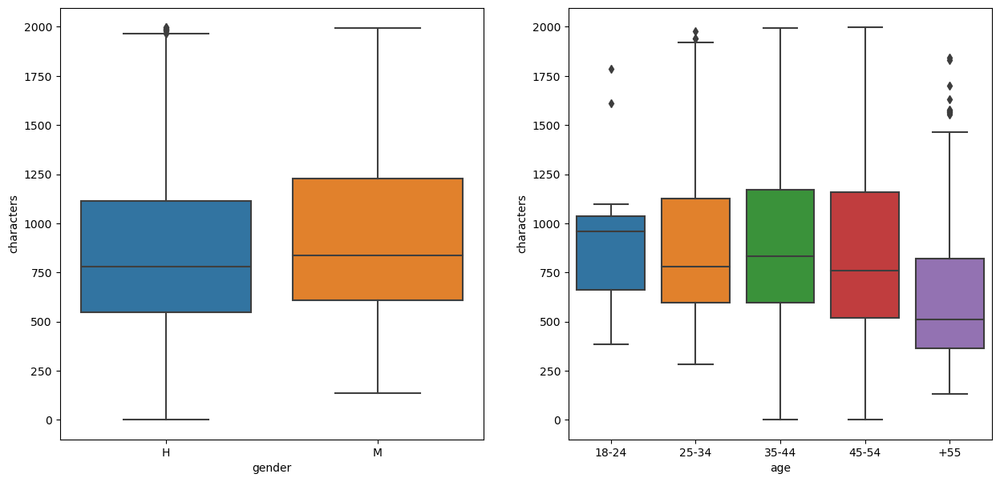

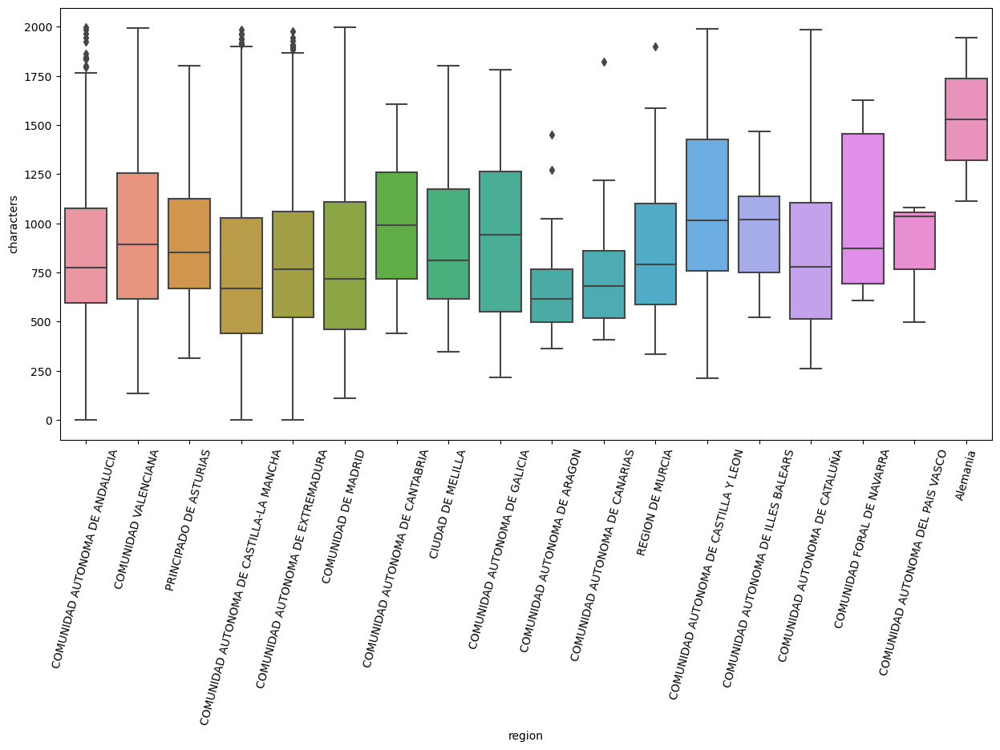

In [199]:
# remove outliers
data = remove_outliers(data,column='characters',value=2000)
# boxplot
box_plot('characters',data)
# statistics
statistics('characters',data)

### 2. Number of capital letters 

In [126]:
# Mann-Whitney U test
data = df_char.copy()
res = mann_whitney(data,'capital_letters')
print(res)

MannwhitneyuResult(statistic=1468688.0, pvalue=1.113348324925797e-06)


In [127]:
# Kruskal-Wallis test
kruskal_posthoc(df_char,'capital_letters')


AGE: KruskalResult(statistic=101.70457471000498, pvalue=4.2648143293219306e-21)
AGE:               18-24     25-34         35-44         45-54           +55
18-24  1.000000e+00  0.008219  1.767694e-17  3.753949e-21  5.490739e-21
25-34  8.219240e-03  1.000000  1.000000e+00  1.000000e+00  1.000000e+00
35-44  1.767694e-17  1.000000  1.000000e+00  1.000000e+00  1.000000e+00
45-54  3.753949e-21  1.000000  1.000000e+00  1.000000e+00  1.000000e+00
+55    5.490739e-21  1.000000  1.000000e+00  1.000000e+00  1.000000e+00
REGION: KruskalResult(statistic=197.25878694080194, pvalue=1.0176937828361815e-32)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNID

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.1895339112767127
The f of Cohen for age is: 5.518486046651544
The f of Cohen normalized for age is: 0.21087108289404563
The f of Cohen for demography is: 9.294423789368073
The f of Cohen normalized for demography is: 0.10638409526174826


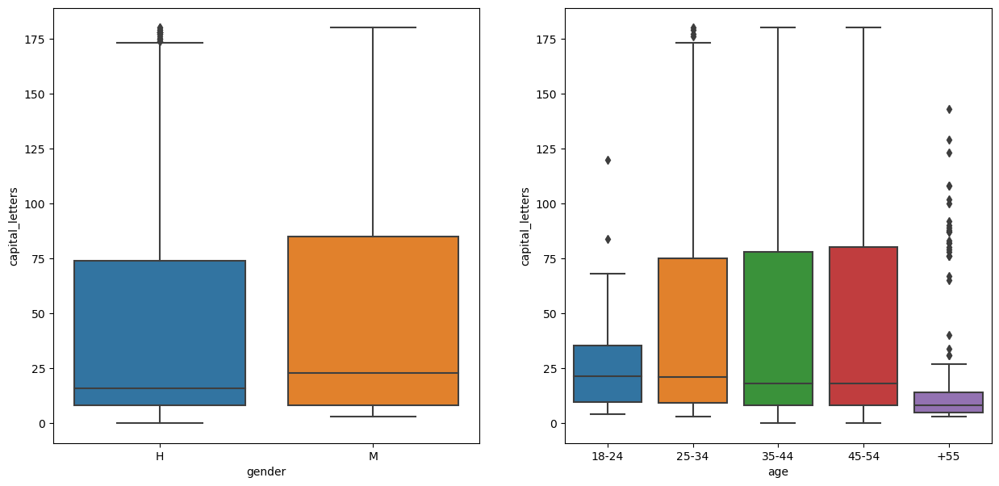

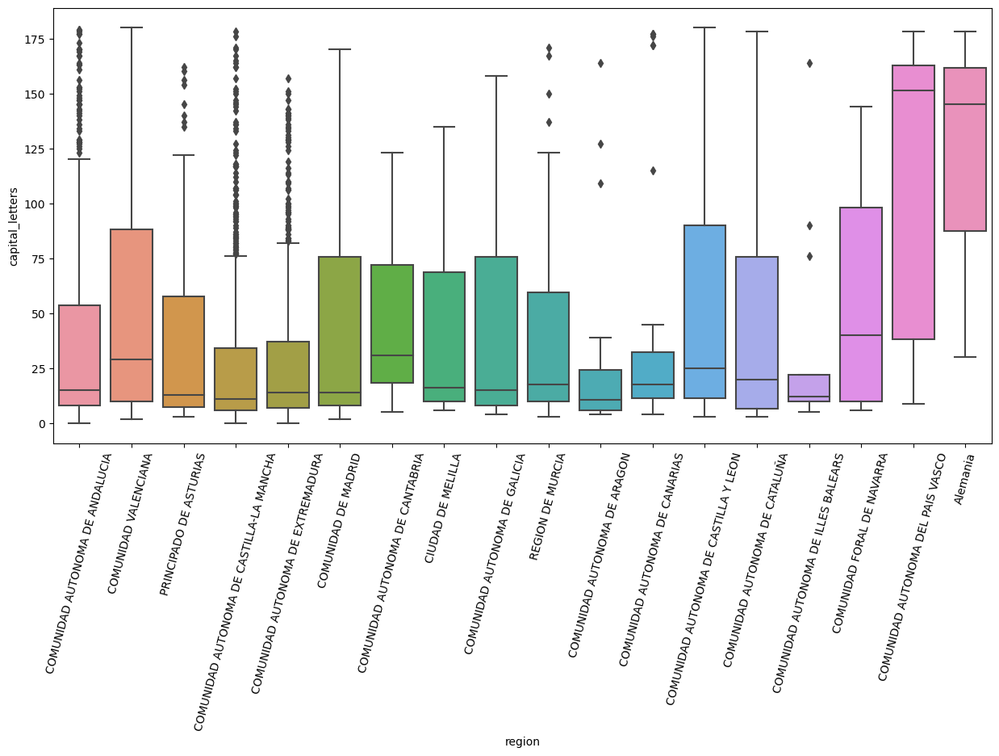

In [200]:
# remove outliers
data = df_char.copy()
data = remove_outliers(data,column='capital_letters',value=180)
# boxplot
box_plot('capital_letters',data)
# statistics
statistics('capital_letters',data)

### 3. Number of puntuation marks 

In [128]:
# Mann-Whitney U test
data = df_char.copy()
res = mann_whitney(data,'punctuations')
print(res)

MannwhitneyuResult(statistic=1448625.5, pvalue=2.8197845022278843e-05)


In [129]:
# Kruskal-Wallis test
kruskal_posthoc(df_char,'punctuations')


AGE: KruskalResult(statistic=64.4935614458411, pvalue=3.289657408016364e-13)
AGE:               18-24     25-34         35-44         45-54           +55
18-24  1.000000e+00  0.824113  2.998682e-08  4.522025e-11  1.263603e-14
25-34  8.241127e-01  1.000000  1.000000e+00  1.000000e+00  9.479063e-01
35-44  2.998682e-08  1.000000  1.000000e+00  1.000000e+00  3.017446e-01
45-54  4.522025e-11  1.000000  1.000000e+00  1.000000e+00  2.185787e-02
+55    1.263603e-14  0.947906  3.017446e-01  2.185787e-02  1.000000e+00
REGION: KruskalResult(statistic=210.85907795685074, pvalue=1.8589706289699644e-35)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                  1.000000   
COMUNIDAD VALENCIANA                                             1.000000   
PRINCIPADO DE ASTURIAS                                           1.000000   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                         0.372114   
COMUNIDAD 

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.08332552609360296
The f of Cohen for age is: 0.9794448221196054
The f of Cohen normalized for age is: 0.21073043715726092
The f of Cohen for demography is: 2.0043579291542892
The f of Cohen normalized for demography is: 0.08565632175873031


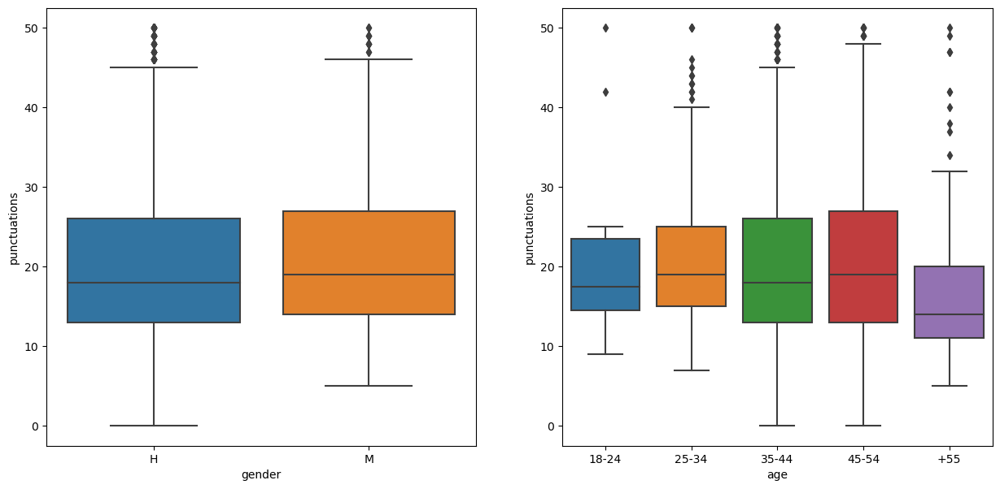

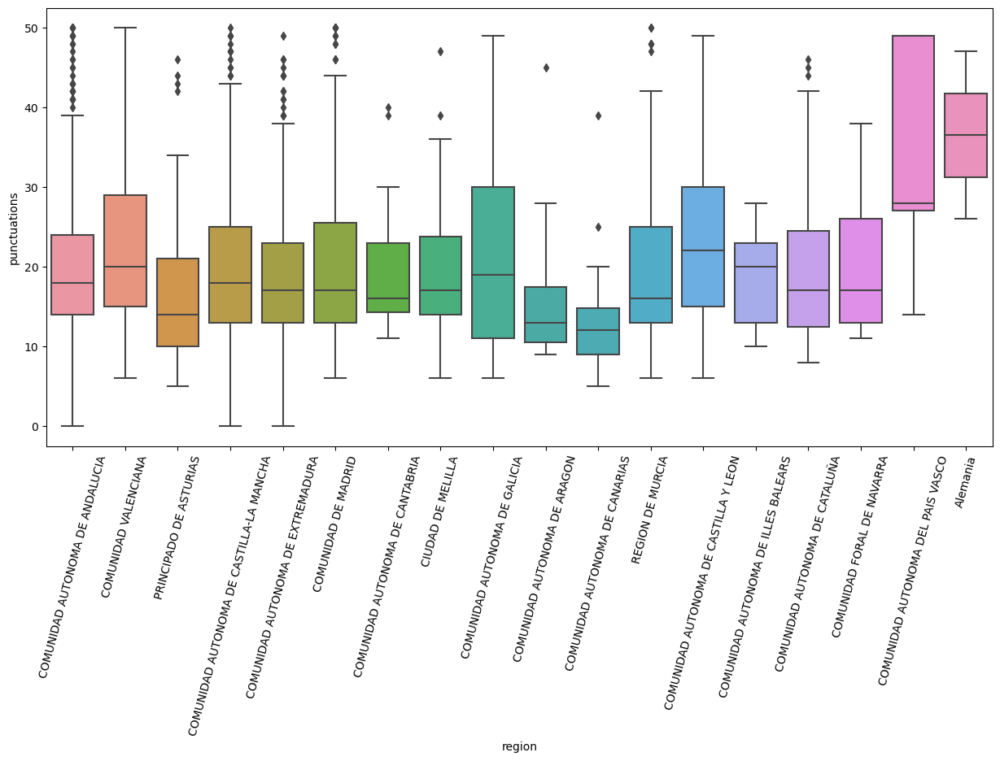

In [201]:
# remove outliers
data = df_char.copy()
data = remove_outliers(data,column='punctuations',value=50)
# boxplot
box_plot('punctuations',data)
# statistics
statistics('punctuations',data)

## STRUCTURAL FEATURES ANALYSIS: 

1. Sentence count
2. Average count of sentence per paragraph
3. Average count of words per paragraph
4. Average count of characters per paragraph
5. Variation in paragraphs length 

#### Steps:

- Create boxplots to visualize independence between studied features and the users personal traits (gender, age and demography)
- Statistical measures: d of Cohen for traits with only 2 options, f of Cohen for traits with more than 2 possibilities.
The d of Cohen can be either positive or negative. Two variables are considered independant when the absolute value of d is 0 or very close to 0, and as the absolute value of d gets bigger, the relationship between the variables becomes stronger. Normaly, when the value is below 0.2 the dependency between the variables is considered small, when it is around 0.5 it's considered moderate, and the dependency is big when the value is greater than 0.8. These measures apply as well for the f of Cohen normilized. This measure is calculated dividing the f of Cohen between the difference of the max and min values of the groups of each of the studied features.

In [130]:
# load data for character based features analysis
def df_structural_based():    
    data = pd.DataFrame()   
    num_sentence = []
    av_sentence_par = []
    av_words_par = []
    av_char_par = []
    variation = []
    list_genero = []
    list_edad = []
    list_region = []

    for file in files:
        with open(f'Atestados/{file}') as f:
            _dict = json.load(f)
            # policia
            policia = _dict['cp']
            provincia = policia['provincia'].title()
            genero = policia['sexo']
            fn = policia['fn']
            region = get_region(provincia)
            edad = get_edad(fn)

            list_genero.append(genero)
            list_edad.append(edad)
            list_region.append(region)

            # denuncia
            text = _dict['denuncia']
            text = quitar_tags(text)
            cleaned_text = clean_text(text,file)

            num_par = len(cleaned_text.split('\n'))

            cleaned_text = cleaned_text.replace('\n','')
            sentences = cleaned_text.split('.')
            num_sentence_user = len(sentences)
            num_sentence.append(num_sentence_user)
            av_sentence_par.append(num_sentence_user/num_par)
            
            words = [w for w in cleaned_text.split(' ') if len(w) > 0]
            num_words = len(words)
            av_words_par.append(num_words/num_par)
            av_char_par.append(len(cleaned_text)/num_par)

            len_sentence_list = [len(sentence) for sentence in sentences]
            if len(len_sentence_list) > 1:
                var = stat.variance(len_sentence_list)
            else:
                var = 0
            variation.append(var)     

    data['gender'] = list_genero
    data['age'] = list_edad
    data['region'] = list_region
    data['num_sentence'] = num_sentence
    data['av_sentence_par'] = av_sentence_par
    data['av_words_par'] = av_words_par
    data['av_char_par'] = av_char_par
    data['variation'] = variation

    return data

In [131]:
df_struct = df_structural_based()
df_struct.head()

,gender,age,region,num_sentence,av_sentence_par,av_words_par,av_char_par,variation
0,H,35-44,COMUNIDAD AUTONOMA DE ANDALUCIA,3,1.000000,14.000000,89.000000,7922.333333
1,H,35-44,COMUNIDAD VALENCIANA,6,1.000000,26.000000,148.500000,6501.466667
2,H,35-44,COMUNIDAD AUTONOMA DE ANDALUCIA,6,1.000000,19.333333,112.833333,6874.400000
3,H,25-34,COMUNIDAD VALENCIANA,24,3.428571,45.428571,273.285714,5368.717391
4,H,35-44,PRINCIPADO DE ASTURIAS,31,1.631579,36.157895,212.368421,12857.094624


## Normality test: 
Kolmogorov-Smirnoff test, if p-value > 0.05 then it is normally distributed

In [44]:
for c in df_struct.columns:
    if c not in df_policia.columns:
        res = kstest(df_struct[c], 'norm')
        print(f'{c}: {res}')

num_sentence: KstestResult(statistic=0.9919800147441523, pvalue=0.0, statistic_location=3, statistic_sign=-1)
av_sentence_par: KstestResult(statistic=0.7710522883979426, pvalue=0.0, statistic_location=1.0, statistic_sign=-1)
av_words_par: KstestResult(statistic=0.9999999999987201, pvalue=0.0, statistic_location=7.0, statistic_sign=-1)
av_char_par: KstestResult(statistic=1.0, pvalue=0.0, statistic_location=37.0, statistic_sign=-1)
variation: KstestResult(statistic=0.9994869163673679, pvalue=0.0, statistic_location=84.5, statistic_sign=-1)


### 1. Number of sentences

In [132]:
# Mann-Whitney U test
data = df_struct.copy()
res = mann_whitney(data,'num_sentence')
print(res)

MannwhitneyuResult(statistic=1448124.5, pvalue=2.8213739901862844e-05)


In [133]:
# Kruskal-Wallis test
kruskal_posthoc(df_struct,'num_sentence')


AGE: KruskalResult(statistic=108.1061100142409, pvalue=1.8443269155504294e-22)
AGE:               18-24     25-34         35-44         45-54           +55
18-24  1.000000e+00  0.000517  3.179351e-20  2.183751e-21  2.809939e-14
25-34  5.170001e-04  1.000000  5.502106e-01  5.502106e-01  3.845978e-01
35-44  3.179351e-20  0.550211  1.000000e+00  2.840389e-01  4.229012e-03
45-54  2.183751e-21  0.550211  2.840389e-01  1.000000e+00  3.692603e-02
+55    2.809939e-14  0.384598  4.229012e-03  3.692603e-02  1.000000e+00
REGION: KruskalResult(statistic=348.310809357686, pvalue=1.1068877757866485e-63)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                  1.000000   
COMUNIDAD VALENCIANA                                             1.000000   
PRINCIPADO DE ASTURIAS                                           0.932624   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                         0.683250   
COMUNIDAD 

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.10485718887410139
The f of Cohen for age is: 0.44979325936235004
The f of Cohen normalized for age is: 0.14894697744623625
The f of Cohen for demography is: 0.9139278978493323
The f of Cohen normalized for demography is: 0.11164427145791209


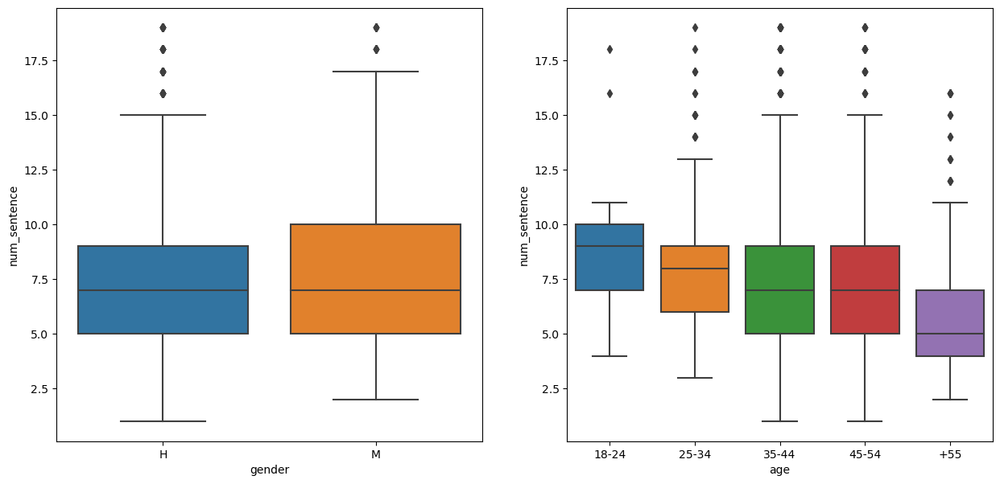

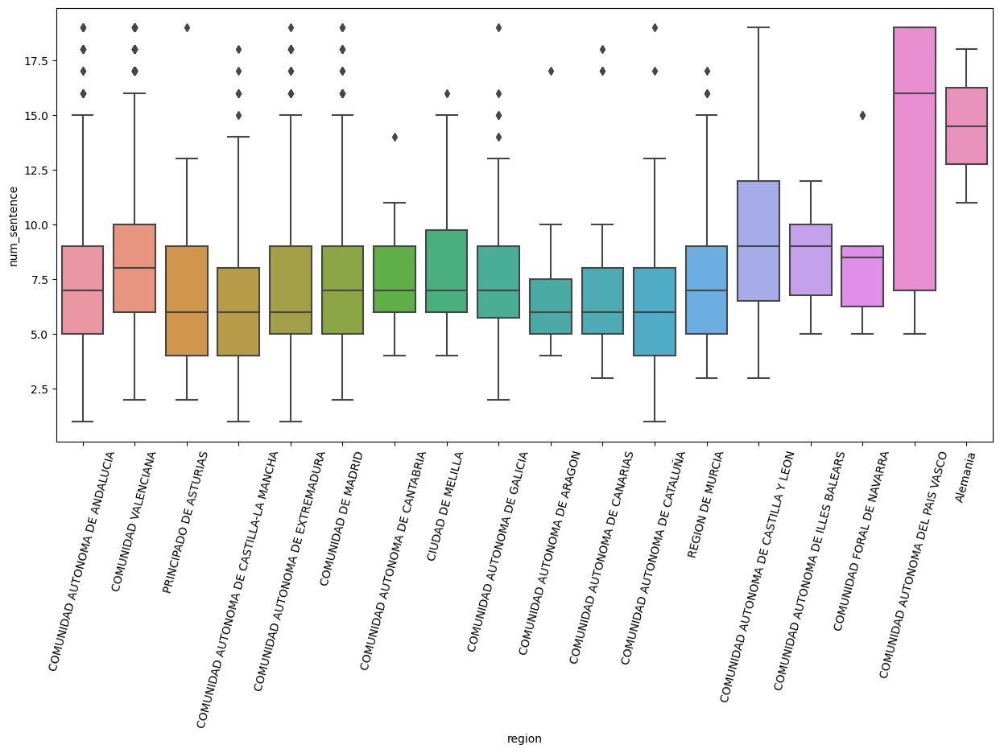

In [204]:
# remove outliers
data = df_struct.copy()
data = remove_outliers(data,column='num_sentence',value=19)
# boxplot
box_plot('num_sentence',data)
# statistics
statistics('num_sentence',data)

### 2. Average number of sentences per paragraph

In [134]:
# Mann-Whitney U test
data = df_struct.copy()
res = mann_whitney(data,'av_sentence_par')
print(res)

MannwhitneyuResult(statistic=1300816.5, pvalue=0.3686054167461795)


In [135]:
# Kruskal-Wallis test
kruskal_posthoc(df_struct,'av_sentence_par')


AGE: KruskalResult(statistic=37.51488572475039, pvalue=1.4108368835204317e-07)
AGE:           18-24     25-34     35-44     45-54       +55
18-24  1.000000  0.095818  0.242731  0.001394  0.384438
25-34  0.095818  1.000000  0.275533  0.384438  0.178121
35-44  0.242731  0.275533  1.000000  0.275533  0.384438
45-54  0.001394  0.384438  0.275533  1.000000  0.000007
+55    0.384438  0.178121  0.384438  0.000007  1.000000
REGION: KruskalResult(statistic=180.7067604173429, pvalue=2.0873075391056337e-29)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                  1.000000   
COMUNIDAD VALENCIANA                                             1.000000   
PRINCIPADO DE ASTURIAS                                           1.000000   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                         1.000000   
COMUNIDAD AUTONOMA DE EXTREMADURA                                1.000000   
COMUNIDAD DE MADRID         

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: -0.08879507476182615
The f of Cohen for age is: 0.025869393731025467
The f of Cohen normalized for age is: 0.211951443374628
The f of Cohen for demography is: 0.05777665413657718
The f of Cohen normalized for demography is: 0.08999977051815163


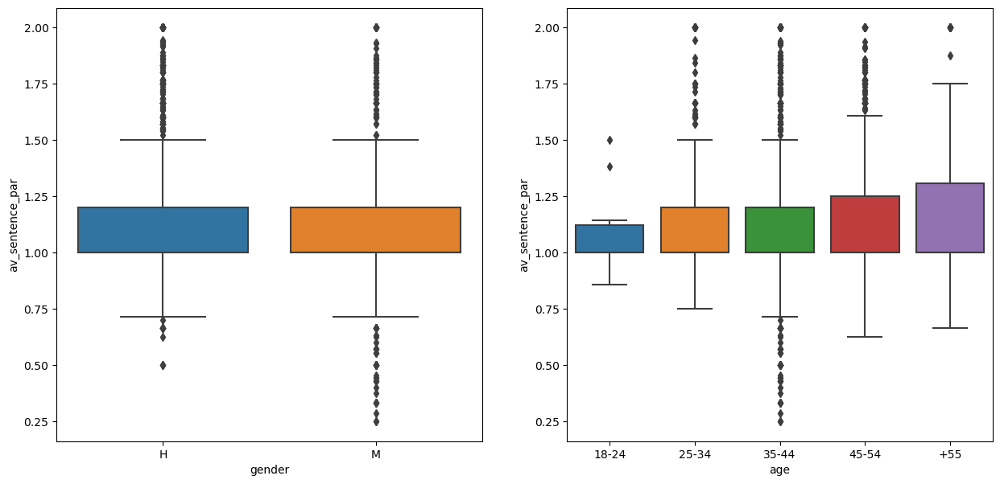

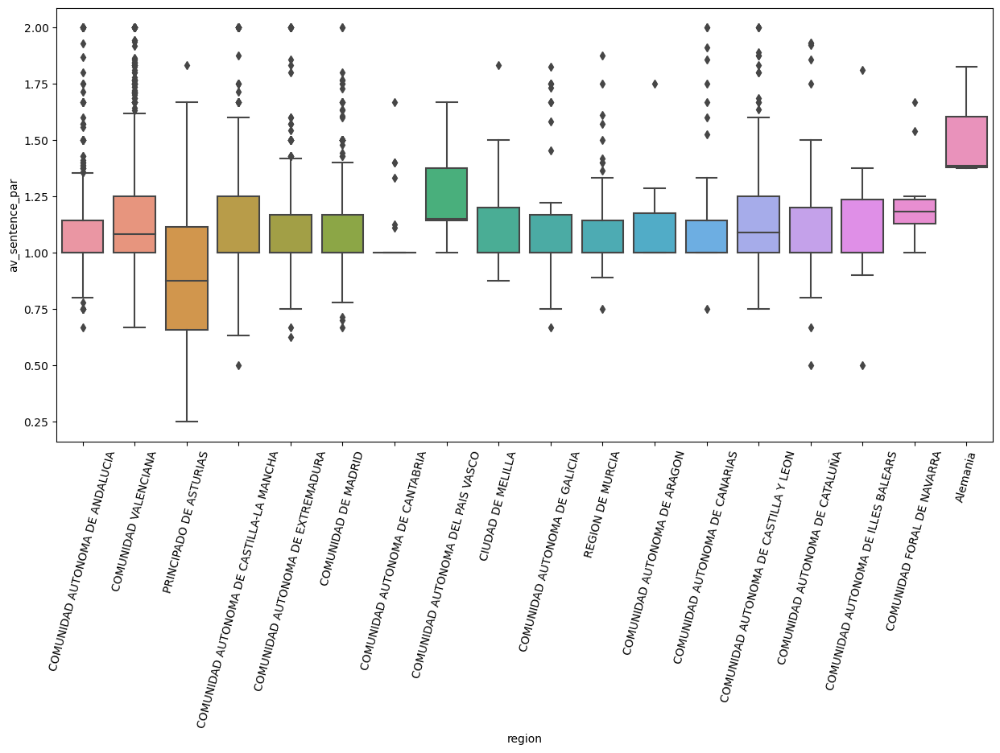

In [205]:
# remove outliers
data = df_struct.copy()
data = remove_outliers(data,column='av_sentence_par',value=2)
# boxplot
box_plot('av_sentence_par',data)
# statistics
statistics('av_sentence_par',data)

### 3. Average number of words per paragraph

In [136]:
# Mann-Whitney U test
data = df_struct.copy()
res = mann_whitney(data,'av_words_par')
print(res)

MannwhitneyuResult(statistic=1344516.0, pvalue=0.5232727108495145)


In [137]:
# Kruskal-Wallis test
kruskal_posthoc(df_struct,'av_words_par')


AGE: KruskalResult(statistic=31.922093474951804, pvalue=1.984532097003368e-06)


/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)


AGE:           18-24     25-34     35-44     45-54       +55
18-24  1.000000  0.110162  0.052404  0.749194  0.749194
25-34  0.110162  1.000000  0.499275  0.128352  0.052404
35-44  0.052404  0.499275  1.000000  0.009963  0.000004
45-54  0.749194  0.128352  0.009963  1.000000  0.009963
+55    0.749194  0.052404  0.000004  0.009963  1.000000
REGION: KruskalResult(statistic=83.03105034538859, pvalue=1.1049146898092277e-10)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRID                                                   1.0   
COMUNIDAD AUTONOMA DE CANTABRI

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA','COMUNIDAD AUTONOMA DE EXTREMADURA','COMUNIDAD DE MADRID','COMUNIDAD AUTONOMA DE CANTABRIA','COMUNIDAD AUTONOMA DEL PAIS VASCO','CIUDAD DE MELILLA','COMUNIDAD AUTONOMA DE GALICIA','REGION DE MURCIA','COMUNIDAD AUTONOMA DE ARAGON','COMUNIDAD AUTONOMA DE CANARIAS','COMUNIDAD AUTONOMA DE CASTILLA Y LEON','COMUNIDAD AUTONOMA DE CATALUÑA','COMUNIDAD AUTONOMA DE ILLES BALEARS','COMUNIDAD FORAL DE NAVARRA','Alemania'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:86: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a futur

The d of Cohen for gender is: 0.04631741898737542
The f of Cohen for age is: 0.6178559238511083
The f of Cohen normalized for age is: 0.14839834653128045
The f of Cohen for demography is: 1.264620631616787
The f of Cohen normalized for demography is: 0.16903211813679514


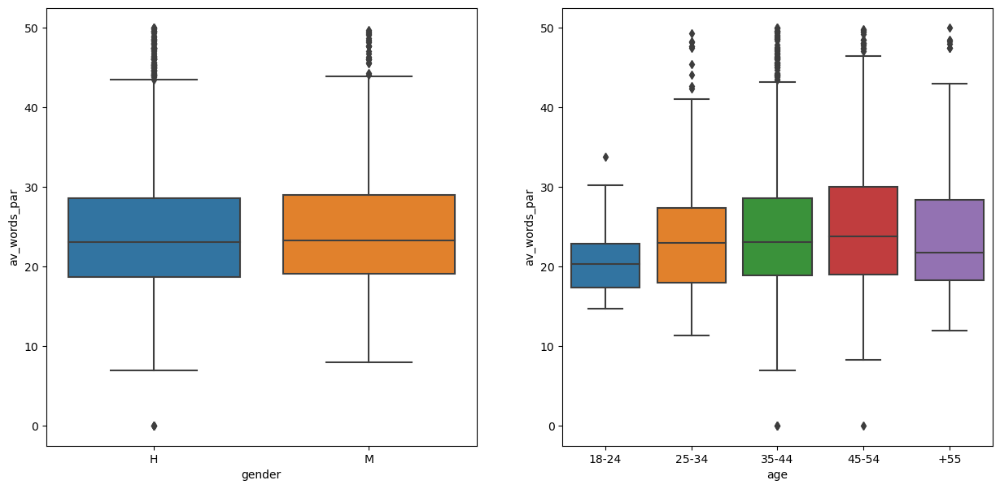

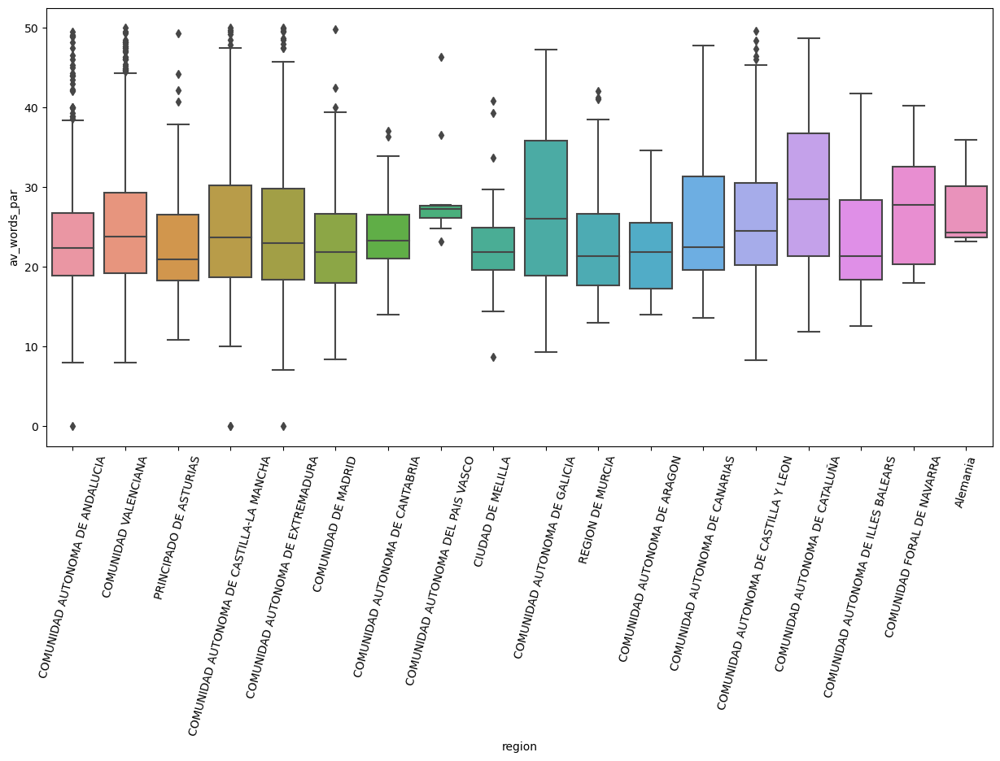

In [207]:
# remove outliers
data = df_struct.copy()
data = remove_outliers(data,column='av_words_par',value=50)
# boxplot
box_plot('av_words_par',data)
# statistics
statistics('av_words_par',data)

### 4. Average number of characters per paragraph

In [138]:
# Mann-Whitney U test
data = df_struct.copy()
res = mann_whitney(data,'av_char_par')
print(res)

MannwhitneyuResult(statistic=1331687.5, pvalue=0.8405050966507122)


In [139]:
# Kruskal-Wallis test
kruskal_posthoc(df_struct,'av_char_par')


AGE: KruskalResult(statistic=30.463305532089223, pvalue=3.938582954009693e-06)
AGE:           18-24     25-34     35-44     45-54       +55
18-24  1.000000  0.267804  0.271691  0.864215  0.267804
25-34  0.267804  1.000000  0.342857  0.235882  0.064297
35-44  0.271691  0.342857  1.000000  0.023896  0.000009
45-54  0.864215  0.235882  0.023896  1.000000  0.005735
+55    0.267804  0.064297  0.000009  0.005735  1.000000
REGION: KruskalResult(statistic=78.218462726916, pvalue=7.932673754729549e-10)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRID            

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.018509081545817062
The f of Cohen for age is: 3.3577703925135434
The f of Cohen normalized for age is: 0.15962446584799223
The f of Cohen for demography is: 6.084692644542032
The f of Cohen normalized for demography is: 0.1433029479420319


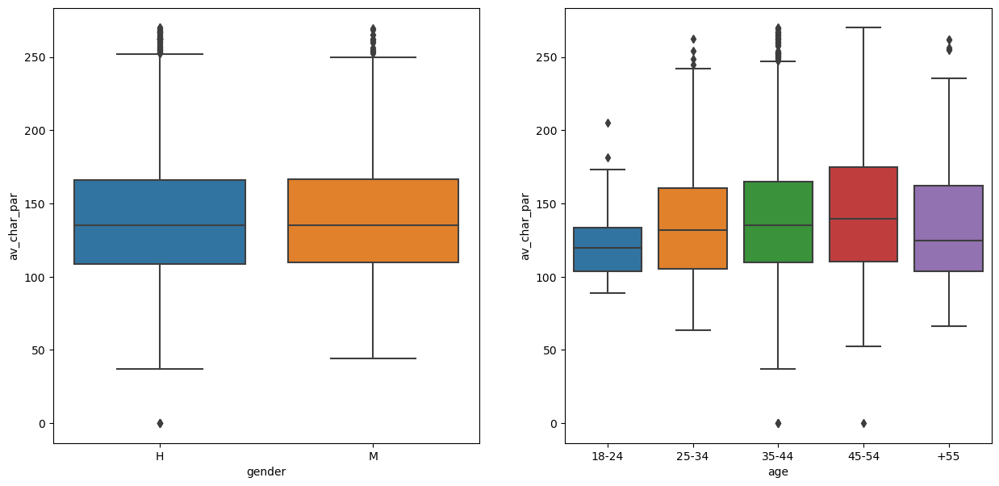

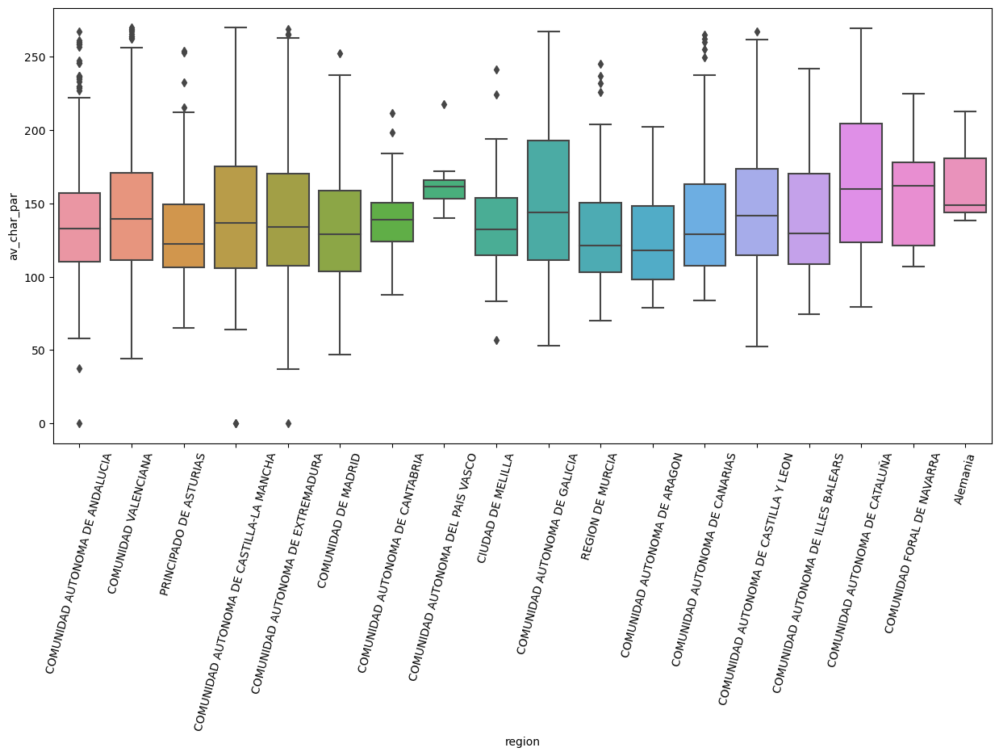

In [211]:
# remove outliers
data = df_struct.copy()
data = remove_outliers(data,column='av_char_par',value=270)
# boxplot
box_plot('av_char_par',data)
# statistics
statistics('av_char_par',data)

### 5. Variation in length

In [140]:
# Mann-Whitney U test
data = df_struct.copy()
res = mann_whitney(data,'variation')
print(res)

MannwhitneyuResult(statistic=1321627.0, pvalue=0.8874964543818212)


In [141]:
# Kruskal-Wallis test
kruskal_posthoc(df_struct,'variation')


AGE: KruskalResult(statistic=75.79279959241806, pvalue=1.354291304254297e-15)
AGE:           18-24     25-34         35-44         45-54           +55
18-24  1.000000  0.000904  1.471746e-06  7.427572e-01  9.451829e-01
25-34  0.000904  1.000000  1.783706e-01  1.244588e-03  6.824114e-04
35-44  0.000001  0.178371  1.000000e+00  6.024771e-12  5.746861e-13
45-54  0.742757  0.001245  6.024771e-12  1.000000e+00  3.548857e-01
+55    0.945183  0.000682  5.746861e-13  3.548857e-01  1.000000e+00
REGION: KruskalResult(statistic=96.98649213028445, pvalue=3.2077690751879025e-13)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA 

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: -0.03589872982512393
The f of Cohen for age is: 458.7938511564768
The f of Cohen normalized for age is: 0.13022791842847814
The f of Cohen for demography is: 431.94276000580464
The f of Cohen normalized for demography is: 0.17458961415600133


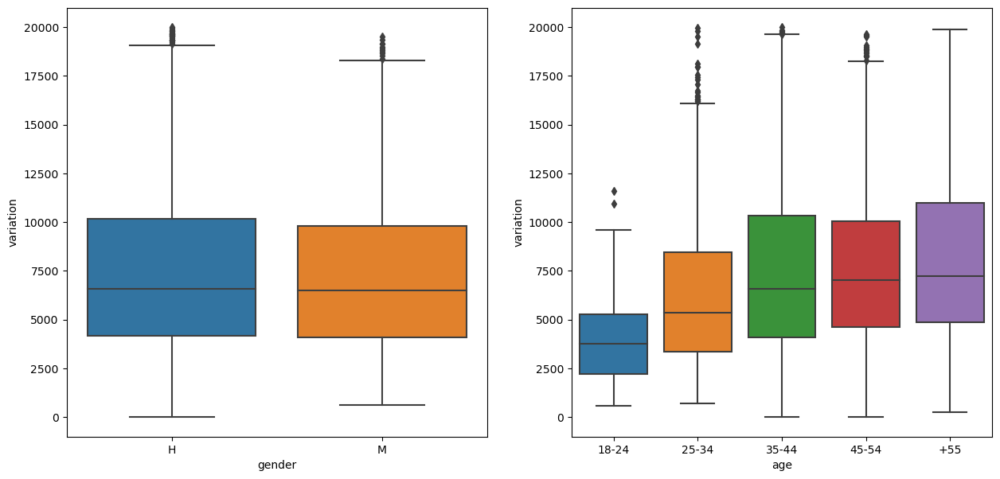

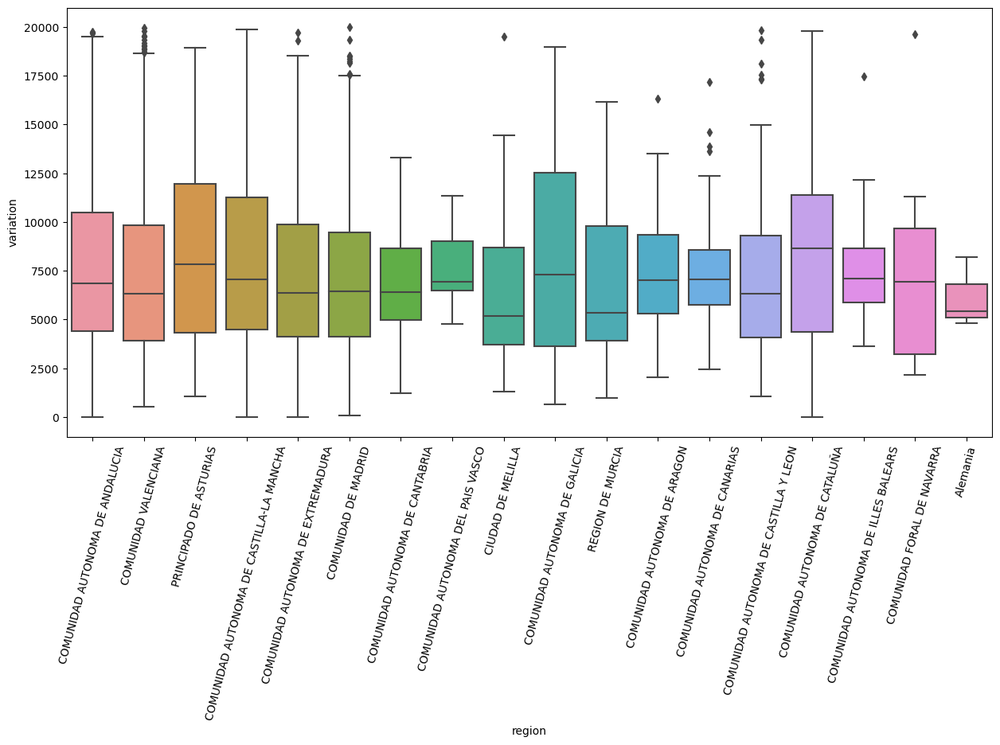

In [214]:
# remove outliers
data = df_struct.copy()
data = remove_outliers(data,column='variation',value=20000)
# boxplot
box_plot('variation',data)
# statistics
statistics('variation',data)

## SYNTACTIC BASED FEATURES ANALYSIS: 

1. Number of determiners
2. Number of prepositions
3. Number of singular nouns
4. Number of plurar nouns
5. Number of adverbs
6. Number of adjetives
7. Number of proper nouns
8. Number of pronouns
9. Number of past tense verbs
10. Number of future tense verbs
11. Number of conjunctions

#### Steps:

- Create boxplots to visualize independence between studied features and the users personal traits (gender, age and demography)
- Statistical measures: d of Cohen for traits with only 2 options, f of Cohen for traits with more than 2 possibilities.
The d of Cohen can be either positive or negative. Two variables are considered independant when the absolute value of d is 0 or very close to 0, and as the absolute value of d gets bigger, the relationship between the variables becomes stronger. Normaly, when the value is below 0.2 the dependency between the variables is considered small, when it is around 0.5 it's considered moderate, and the dependency is big when the value is greater than 0.8. These measures apply as well for the f of Cohen normilized. This measure is calculated dividing the f of Cohen between the difference of the max and min values of the groups of each of the studied features.

In [142]:
# load data for character based features analysis
def df_syntactic_based():
    data = pd.DataFrame() 
    pos_tag = nltk.UnigramTagger(cess_esp.tagged_sents())

    tags_dict = {}
    num_det = []
    num_pre = []
    num_sing = []
    num_plural = []
    num_adv = []
    num_adj = []
    num_prop = []
    num_pronouns = []
    num_past = []
    num_future = []
    num_conj = []
    list_genero = []
    list_edad = []
    list_region = []

    for file in files:
        with open(f'Atestados/{file}') as f:
            _dict = json.load(f)
            # policia
            policia = _dict['cp']
            provincia = policia['provincia'].title()
            genero = policia['sexo']
            fn = policia['fn']
            region = get_region(provincia)
            edad = get_edad(fn)

            list_genero.append(genero)
            list_edad.append(edad)
            list_region.append(region)

            # denuncia
            text = _dict['denuncia']
            
            # clean text
            text = quitar_tags(text)
            cleaned_text = clean_text(text,file)
            cleaned_text = cleaned_text.translate(str.maketrans('','',string.punctuation))
            cleaned_text = cleaned_text.replace('\n','')
            analysis = pos_tag.tag(cleaned_text.split(' '))

            det = 0
            pre = 0
            sing = 0
            plural = 0
            adv = 0
            adj = 0
            prop = 0
            pronouns = 0
            past = 0
            future = 0
            conj = 0

            for word,tag in analysis:
                if tag != None:
                    if tag[0] == 'd':
                        det += 1
                    elif tag[0] == 'a':
                        adj += 1
                    elif tag[0] == 'c':
                        conj += 1
                    elif tag[0] == 'p':
                        pronouns += 1
                    elif tag[0] == 'n':
                        if tag[1] == 'p':
                            prop += 1
                        if tag[3] == 's':
                            sing += 1
                        elif tag[3] == 'p':
                            plural += 1
                    elif tag[0] == 'r':
                        adv += 1
                    elif (tag[0] == 'v' and tag[3] == 'f'):
                        future += 1
                    elif (tag[0] == 'v' and tag[3] == 's'):
                        past += 1
                    elif tag[0] == 's':
                        pre += 1

            
            num_det.append(det)
            num_pre.append(pre)
            num_sing.append(sing)
            num_plural.append(plural)
            num_adv.append(adv)
            num_adj.append(adj)
            num_prop.append(prop)
            num_pronouns.append(pronouns)
            num_past.append(past)
            num_future.append(future)
            num_conj.append(conj)

    for k,v in tags_dict.items():
        data[k] = v
    
    data['gender'] = list_genero
    data['age'] = list_edad
    data['region'] = list_region
    data['num_det'] = num_det
    data['num_pre'] = num_pre
    data['num_sing'] = num_sing
    data['num_plural'] = num_plural
    data['num_adv'] = num_adv
    data['num_adj'] = num_adj
    data['num_prop'] = num_prop
    data['num_pronouns'] = num_pronouns
    data['num_past'] = num_past
    data['num_future'] = num_future
    data['num_conj'] = num_conj

    return data

In [143]:
df_syntactic = df_syntactic_based()
df_syntactic.head()

,gender,age,region,num_det,num_pre,num_sing,num_plural,num_adv,num_adj,num_prop,num_pronouns,num_past,num_future,num_conj
0,H,35-44,COMUNIDAD AUTONOMA DE ANDALUCIA,5,10,5,0,0,3,0,3,0,0,2
1,H,35-44,COMUNIDAD VALENCIANA,24,30,17,3,5,6,0,17,0,0,6
2,H,35-44,COMUNIDAD AUTONOMA DE ANDALUCIA,18,21,9,3,1,5,0,9,1,0,8
3,H,25-34,COMUNIDAD VALENCIANA,26,60,29,7,0,16,1,13,1,0,17
4,H,35-44,PRINCIPADO DE ASTURIAS,98,133,76,14,13,32,3,49,0,0,31


## Normality test: 
Kolmogorov-Smirnoff test, if p-value > 0.05 then it is normally distributed

In [47]:
for c in df_syntactic.columns:
    if c not in df_policia.columns:
        res = kstest(df_syntactic[c], 'norm')
        print(f'{c}: {res}')

num_det: KstestResult(statistic=0.9971108510704736, pvalue=0.0, statistic_location=3, statistic_sign=-1)
num_pre: KstestResult(statistic=0.9986856196765865, pvalue=0.0, statistic_location=4, statistic_sign=-1)
num_sing: KstestResult(statistic=0.9883884293157276, pvalue=0.0, statistic_location=3, statistic_sign=-1)
num_plural: KstestResult(statistic=0.8399999963227289, pvalue=0.0, statistic_location=2, statistic_sign=-1)
num_adv: KstestResult(statistic=0.7287228887057928, pvalue=0.0, statistic_location=1, statistic_sign=-1)
num_adj: KstestResult(statistic=0.9454386828286294, pvalue=0.0, statistic_location=2, statistic_sign=-1)
num_prop: KstestResult(statistic=0.5, pvalue=0.0, statistic_location=0, statistic_sign=-1)
num_pronouns: KstestResult(statistic=0.9742786294183442, pvalue=0.0, statistic_location=3, statistic_sign=-1)
num_past: KstestResult(statistic=0.5, pvalue=0.0, statistic_location=0, statistic_sign=-1)
num_future: KstestResult(statistic=0.5, pvalue=0.0, statistic_location=0, 

### 1. Number of determiners

In [144]:
# Mann-Whitney U test
data = df_syntactic.copy()
res = mann_whitney(data,'num_det')
print(res)

MannwhitneyuResult(statistic=1472134.0, pvalue=6.116589665180125e-07)


In [145]:
# Kruskal-Wallis test
kruskal_posthoc(df_syntactic,'num_det')


AGE: KruskalResult(statistic=98.62857051252665, pvalue=1.9265014572765763e-20)
AGE:               18-24    25-34         35-44         45-54           +55
18-24  1.000000e+00  0.00681  2.756080e-10  2.189450e-21  1.438285e-14
25-34  6.810226e-03  1.00000  1.000000e+00  1.000000e+00  1.000000e+00
35-44  2.756080e-10  1.00000  1.000000e+00  3.610089e-02  1.000000e+00
45-54  2.189450e-21  1.00000  3.610089e-02  1.000000e+00  6.541829e-02
+55    1.438285e-14  1.00000  1.000000e+00  6.541829e-02  1.000000e+00
REGION: KruskalResult(statistic=222.10575297147955, pvalue=9.878662465872786e-38)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTON

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.1323182694430206
The f of Cohen for age is: 1.8199088719731467
The f of Cohen normalized for age is: 0.18068996374510568
The f of Cohen for demography is: 2.699061294027985
The f of Cohen normalized for demography is: 0.12989197635241342


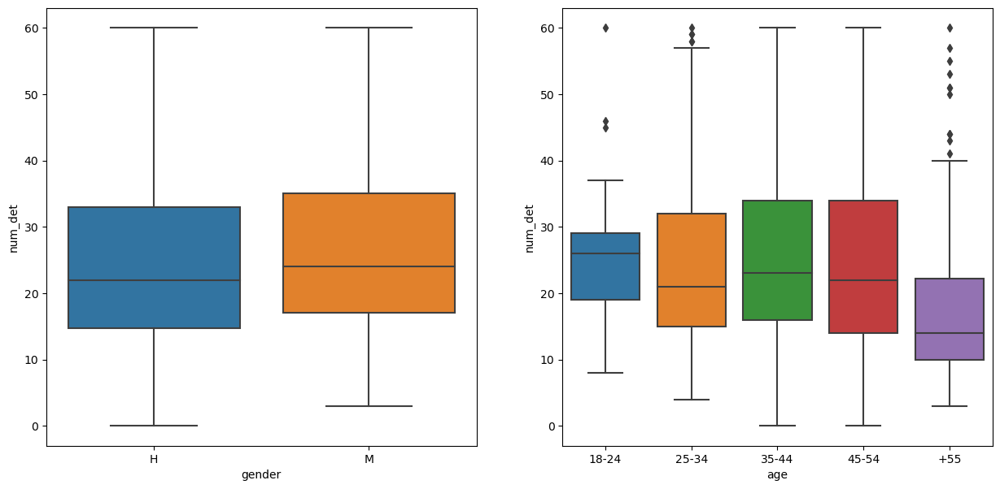

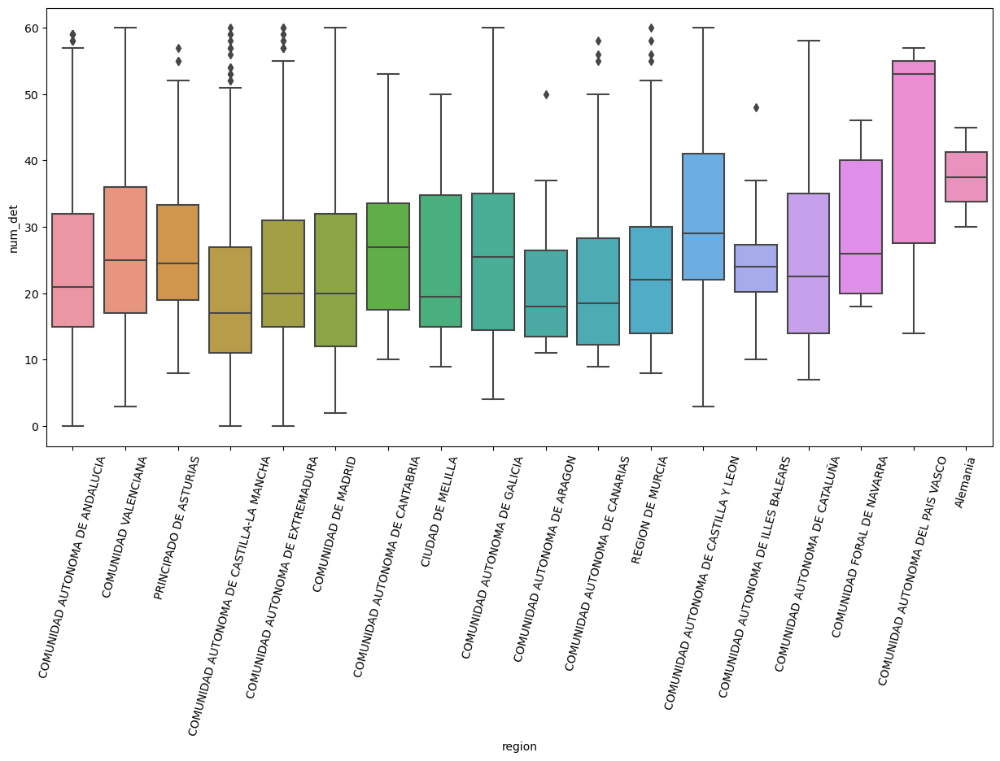

In [16]:
# remove outliers
data = df_syntactic.copy()
data = remove_outliers(data,column='num_det',value=60)
# boxplot
box_plot('num_det',data)
# statistics
statistics('num_det',data)

### 2. Number of prepositions

In [146]:
# Mann-Whitney U test
data = df_syntactic.copy()
res = mann_whitney(data,'num_pre')
print(res)

MannwhitneyuResult(statistic=1451892.5, pvalue=1.7270718855195455e-05)


In [147]:
# Kruskal-Wallis test
kruskal_posthoc(df_syntactic,'num_pre')


AGE: KruskalResult(statistic=98.8566256044738, pvalue=1.722784430684824e-20)
AGE:               18-24     25-34         35-44         45-54           +55
18-24  1.000000e+00  0.038209  5.960388e-11  9.265626e-22  3.556901e-15
25-34  3.820930e-02  1.000000  1.000000e+00  1.000000e+00  1.000000e+00
35-44  5.960388e-11  1.000000  1.000000e+00  7.289724e-02  1.000000e+00
45-54  9.265626e-22  1.000000  7.289724e-02  1.000000e+00  1.063079e-01
+55    3.556901e-15  1.000000  1.000000e+00  1.063079e-01  1.000000e+00
REGION: KruskalResult(statistic=205.9863544291888, pvalue=1.786436819617563e-34)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AU

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.07578572224308742
The f of Cohen for age is: 1.9499940370136706
The f of Cohen normalized for age is: 0.23130600871987772
The f of Cohen for demography is: 2.634580062348388
The f of Cohen normalized for demography is: 0.10058343171725259


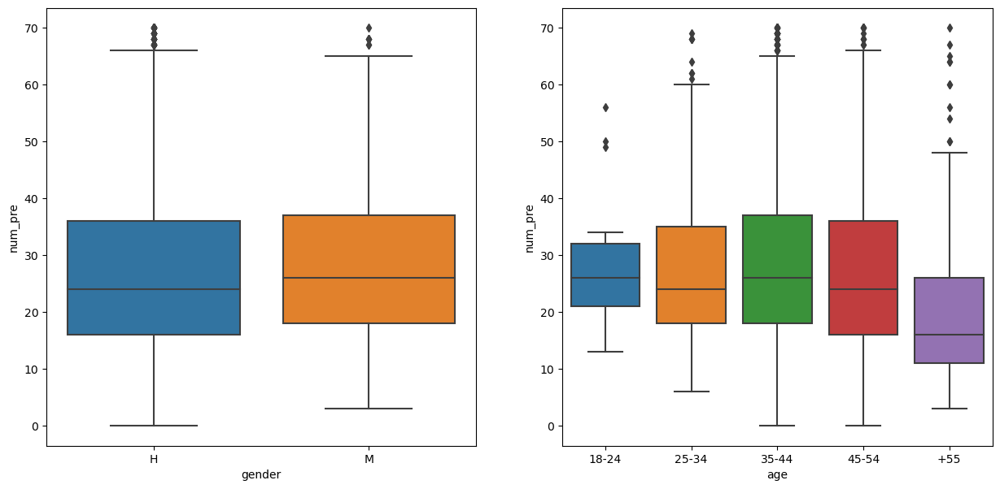

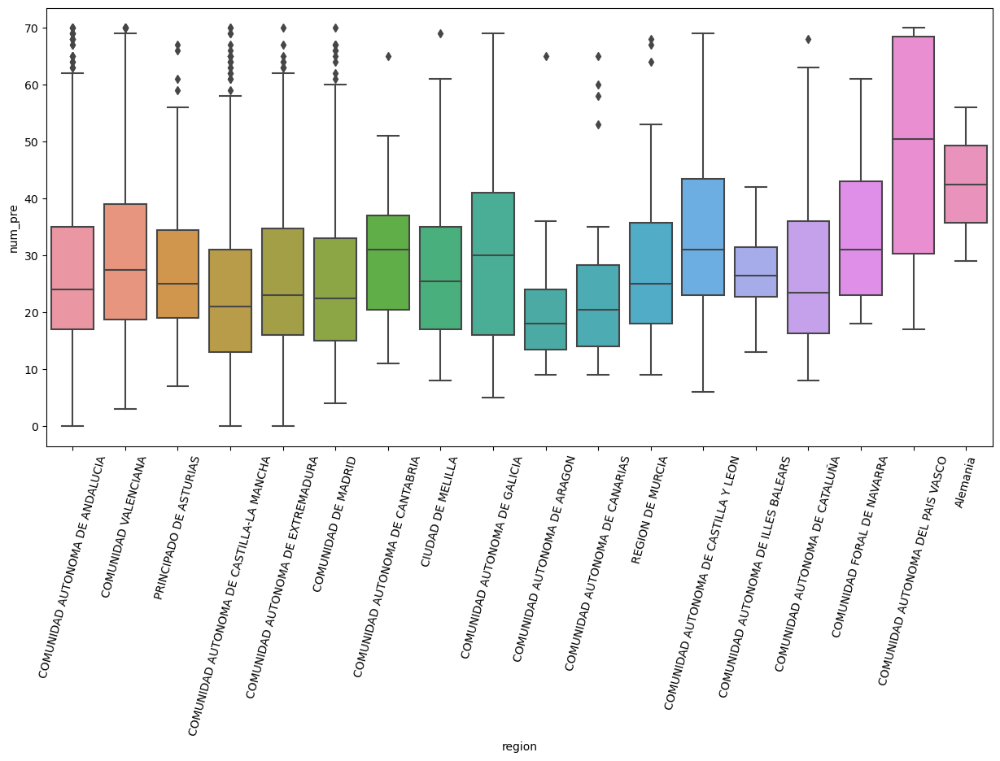

In [19]:
# remove outliers
data = df_syntactic.copy()
data = remove_outliers(data,column='num_pre',value=70)
# boxplot
box_plot('num_pre',data)
# statistics
statistics('num_pre',data)

### 3. Number of singular nouns

In [148]:
# Mann-Whitney U test
data = df_syntactic.copy()
res = mann_whitney(data,'num_sing')
print(res)

MannwhitneyuResult(statistic=1406986.0, pvalue=0.005632799053490982)


In [149]:
# Kruskal-Wallis test
kruskal_posthoc(df_syntactic,'num_sing')


AGE: KruskalResult(statistic=75.71462462717584, pvalue=1.406860125029633e-15)
AGE:               18-24     25-34         35-44         45-54           +55
18-24  1.000000e+00  0.257613  4.873484e-09  1.264897e-16  1.740648e-10
25-34  2.576129e-01  1.000000  1.000000e+00  1.000000e+00  1.000000e+00
35-44  4.873484e-09  1.000000  1.000000e+00  3.467398e-01  1.000000e+00
45-54  1.264897e-16  1.000000  3.467398e-01  1.000000e+00  4.081814e-02
+55    1.740648e-10  1.000000  1.000000e+00  4.081814e-02  1.000000e+00
REGION: KruskalResult(statistic=171.01872492851223, pvalue=1.7620189896713e-27)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AU

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.06172881431410744
The f of Cohen for age is: 1.1056357359478794
The f of Cohen normalized for age is: 0.23807983716722597
The f of Cohen for demography is: 1.5544250005457663
The f of Cohen normalized for demography is: 0.10041334470163896


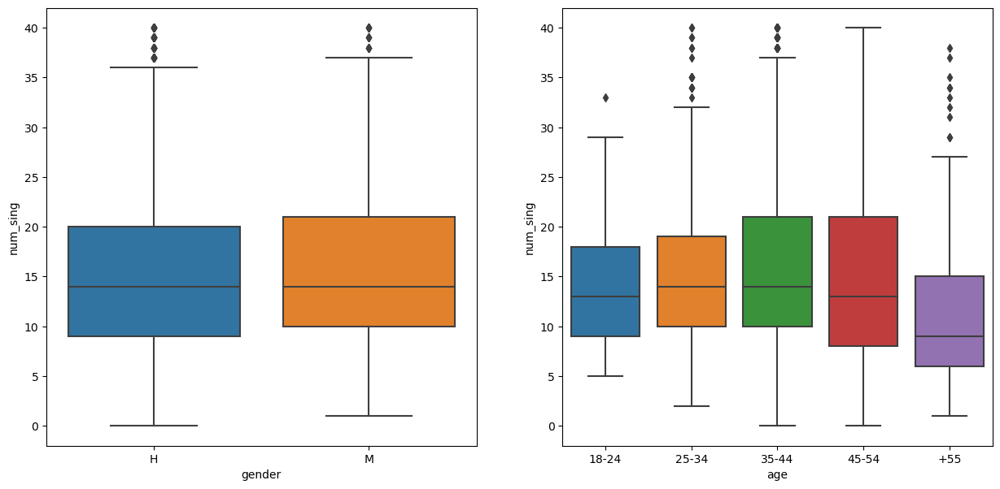

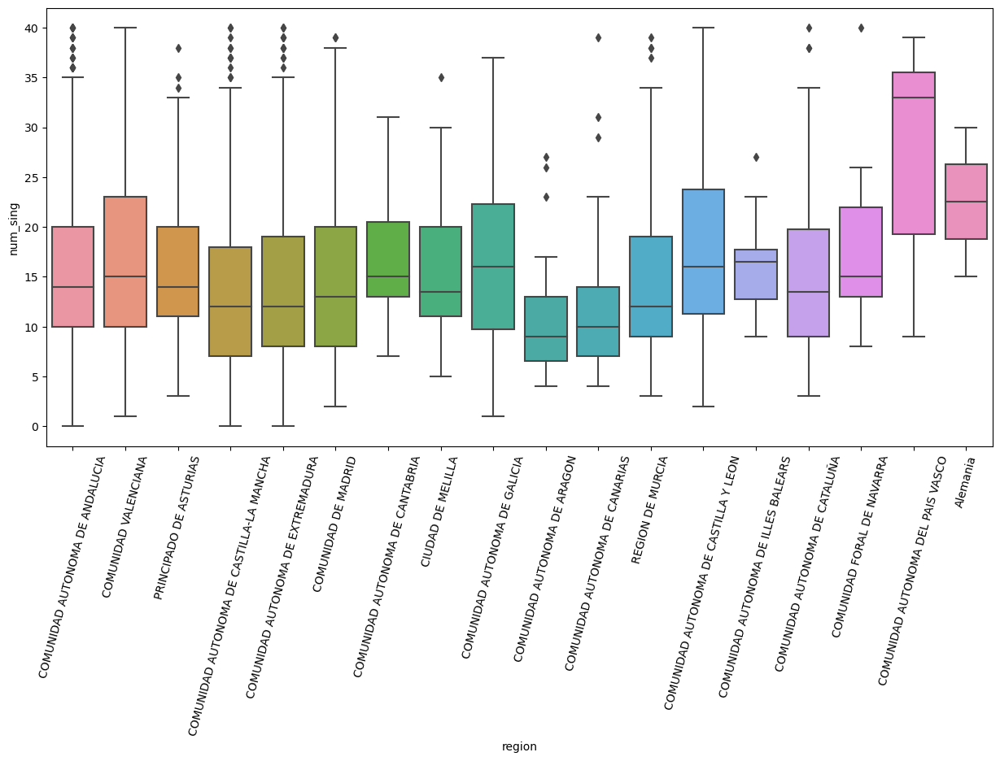

In [22]:
# remove outliers
data = df_syntactic.copy()
data = remove_outliers(data,column='num_sing',value=40)
# boxplot
box_plot('num_sing',data)
# statistics
statistics('num_sing',data)

### 4. Number of plural nouns

In [150]:
# Mann-Whitney U test
data = df_syntactic.copy()
res = mann_whitney(data,'num_plural')
print(res)

MannwhitneyuResult(statistic=1337746.0, pvalue=0.6813238746836094)


In [151]:
# Kruskal-Wallis test
kruskal_posthoc(df_syntactic,'num_plural')


AGE: KruskalResult(statistic=70.97830376220509, pvalue=1.4106554132627645e-14)
AGE:               18-24     25-34     35-44         45-54           +55
18-24  1.000000e+00  0.764651  0.000001  1.162515e-14  8.520040e-12
25-34  7.646505e-01  1.000000  0.430111  2.298392e-01  2.758372e-01
35-44  1.206147e-06  0.430111  1.000000  6.831865e-02  3.131360e-01
45-54  1.162515e-14  0.229839  0.068319  1.000000e+00  7.646505e-01
+55    8.520040e-12  0.275837  0.313136  7.646505e-01  1.000000e+00
REGION: KruskalResult(statistic=133.78891809351404, pvalue=3.484114580746727e-20)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.0006135570084267543
The f of Cohen for age is: 0.3109405364048076
The f of Cohen normalized for age is: 0.23636863829067337
The f of Cohen for demography is: 0.42903719471592006
The f of Cohen normalized for demography is: 0.11440991859091201


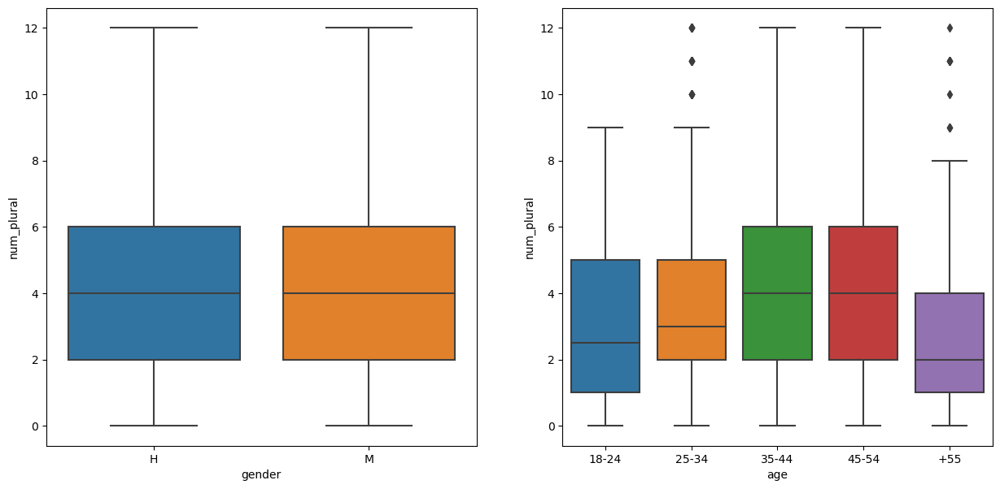

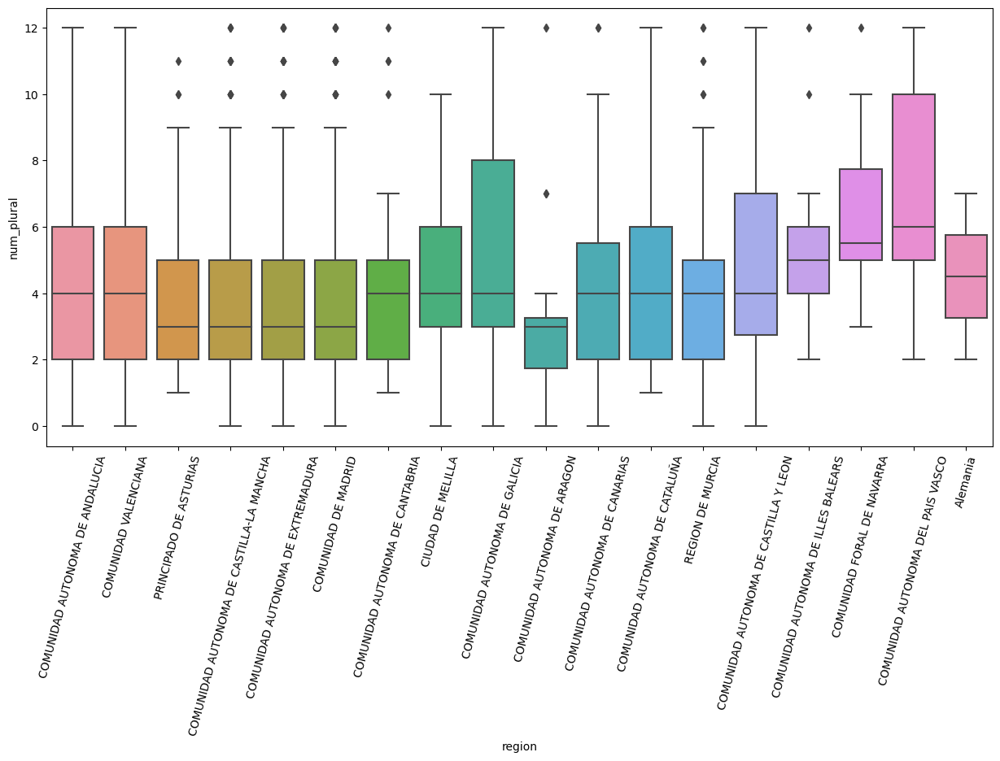

In [24]:
# remove outliers
data = df_syntactic.copy()
data = remove_outliers(data,column='num_plural',value=12)
# boxplot
box_plot('num_plural',data)
# statistics
statistics('num_plural',data)

### 5. Number of adverbs

In [152]:
# Mann-Whitney U test
data = df_syntactic.copy()
res = mann_whitney(data,'num_adv')
print(res)

MannwhitneyuResult(statistic=1463516.5, pvalue=2.342157633090628e-06)


In [153]:
# Kruskal-Wallis test
kruskal_posthoc(df_syntactic,'num_adv')


AGE: KruskalResult(statistic=58.48502072545437, pvalue=6.036107289658515e-12)
AGE:               18-24     25-34     35-44         45-54       +55
18-24  1.000000e+00  0.012951  0.004772  4.371058e-09  0.002578
25-34  1.295089e-02  1.000000  0.210686  4.680730e-01  0.210686
35-44  4.771551e-03  0.210686  1.000000  1.026679e-02  0.835623
45-54  4.371058e-09  0.468073  0.010267  1.000000e+00  0.000032
+55    2.578376e-03  0.210686  0.835623  3.224040e-05  1.000000
REGION: KruskalResult(statistic=213.69123886944047, pvalue=4.9808493203318713e-36)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                        

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.17550308753926264
The f of Cohen for age is: 0.33319153829710585
The f of Cohen normalized for age is: 0.1651767251183267
The f of Cohen for demography is: 0.6625939489007792
The f of Cohen normalized for demography is: 0.13881724807849827


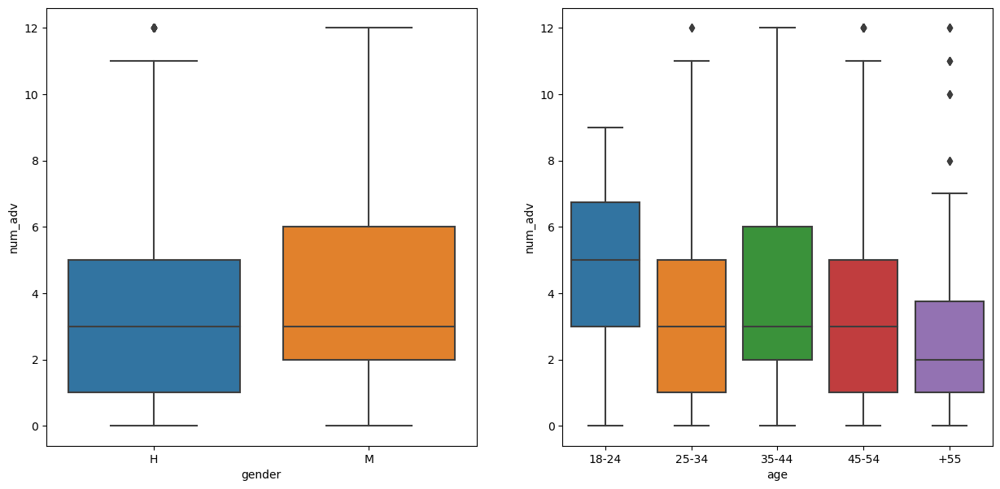

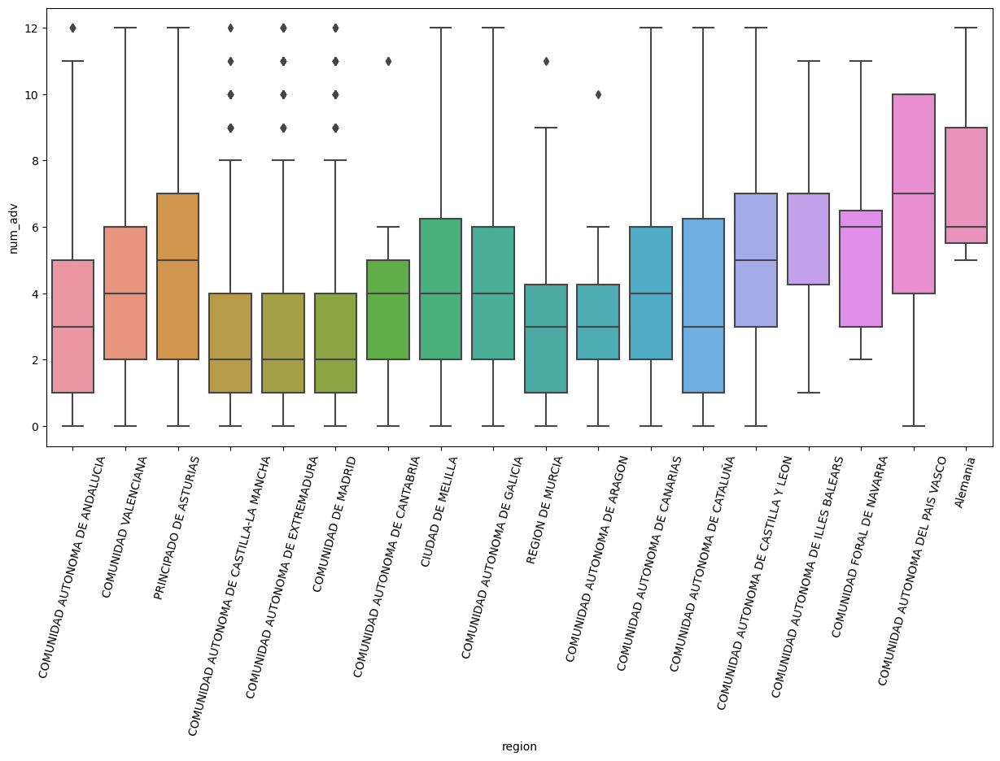

In [27]:
# remove outliers
data = df_syntactic.copy()
data = remove_outliers(data,column='num_adv',value=12)
# boxplot
box_plot('num_adv',data)
# statistics
statistics('num_adv',data)

### 6. Number of adjetives

In [154]:
# Mann-Whitney U test
data = df_syntactic.copy()
res = mann_whitney(data,'num_adj')
print(res)

MannwhitneyuResult(statistic=1458225.5, pvalue=6.005641219717687e-06)


In [155]:
# Kruskal-Wallis test
kruskal_posthoc(df_syntactic,'num_adj')


AGE: KruskalResult(statistic=72.03077225472762, pvalue=8.454712134832221e-15)
AGE:               18-24     25-34     35-44         45-54           +55
18-24  1.000000e+00  0.700879  0.000006  7.290301e-15  2.676580e-10
25-34  7.008791e-01  1.000000  0.700879  5.852490e-01  6.773825e-01
35-44  6.226855e-06  0.700879  1.000000  1.084575e-02  5.852490e-01
45-54  7.290301e-15  0.585249  0.010846  1.000000e+00  2.940574e-01
+55    2.676580e-10  0.677383  0.585249  2.940574e-01  1.000000e+00
REGION: KruskalResult(statistic=133.58421590208857, pvalue=3.816247285873572e-20)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA 

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.08878725283700213
The f of Cohen for age is: 0.5094310971854968
The f of Cohen normalized for age is: 0.2449468355099126
The f of Cohen for demography is: 0.6309976734714001
The f of Cohen normalized for demography is: 0.08887291175653524


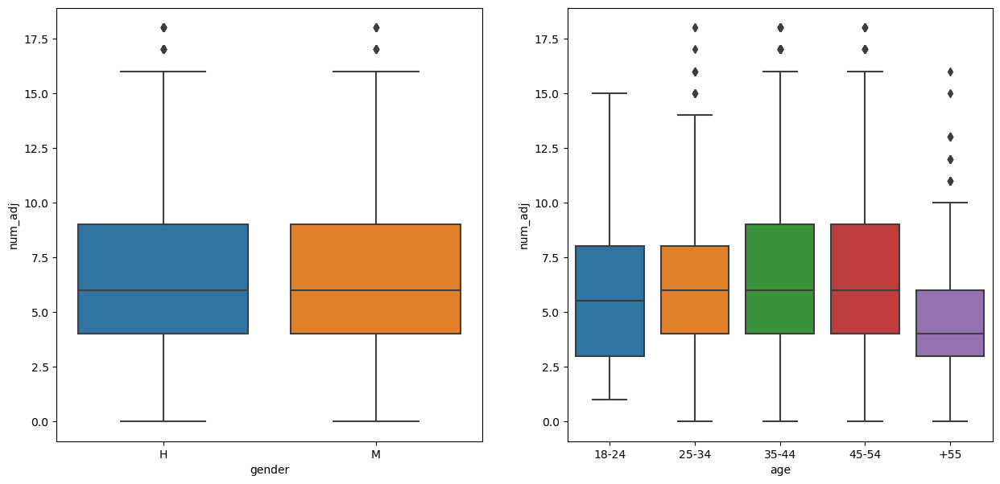

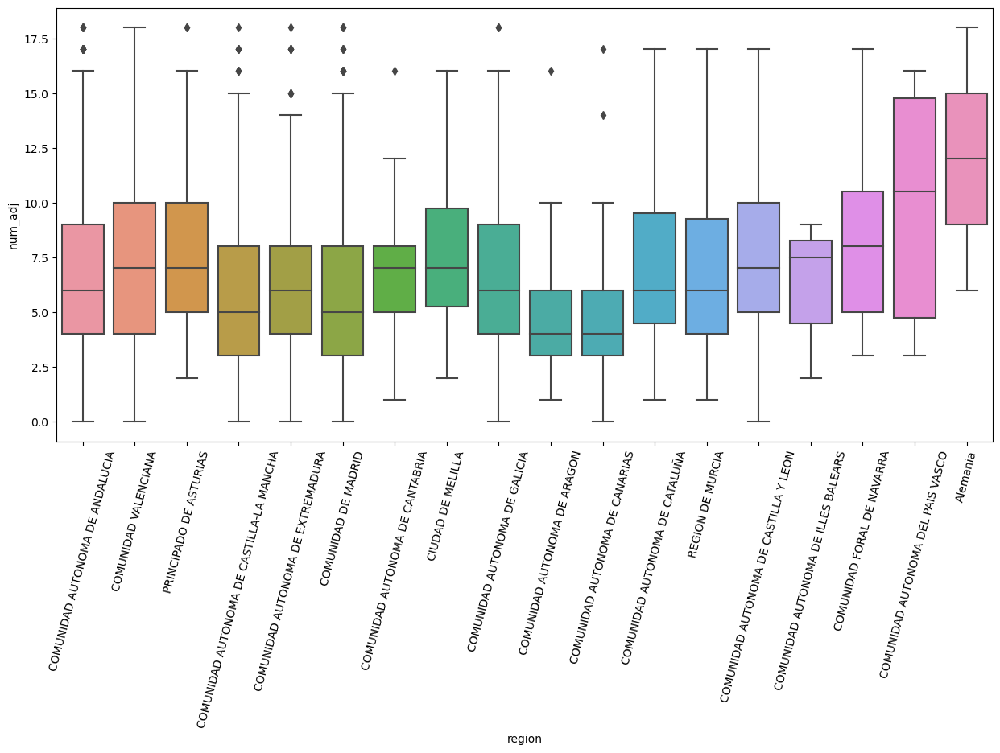

In [30]:
# remove outliers
data = df_syntactic.copy()
data = remove_outliers(data,column='num_adj',value=18)
# boxplot
box_plot('num_adj',data)
# statistics
statistics('num_adj',data)

### 7. Number of proper nouns

In [156]:
# Mann-Whitney U test
data = df_syntactic.copy()
res = mann_whitney(data,'num_prop')
print(res)

MannwhitneyuResult(statistic=1400722.0, pvalue=0.00034913156272396847)


In [157]:
# Kruskal-Wallis test
kruskal_posthoc(df_syntactic,'num_prop')


AGE: KruskalResult(statistic=23.02433305174518, pvalue=0.0001252166610258935)
AGE:           18-24  25-34     35-44     45-54       +55
18-24  1.000000    1.0  1.000000  0.307732  0.002092
25-34  1.000000    1.0  1.000000  1.000000  1.000000
35-44  1.000000    1.0  1.000000  1.000000  0.005919
45-54  0.307732    1.0  1.000000  1.000000  0.002584
+55    0.002092    1.0  0.005919  0.002584  1.000000
REGION: KruskalResult(statistic=116.59242326513639, pvalue=6.854676280852001e-17)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRID                            

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.22566137002915737
The f of Cohen for age is: 0.1574887821084734
The f of Cohen normalized for age is: 0.30303742791153154
The f of Cohen for demography is: 0.31610377377181414
The f of Cohen normalized for demography is: 0.10575962691250287


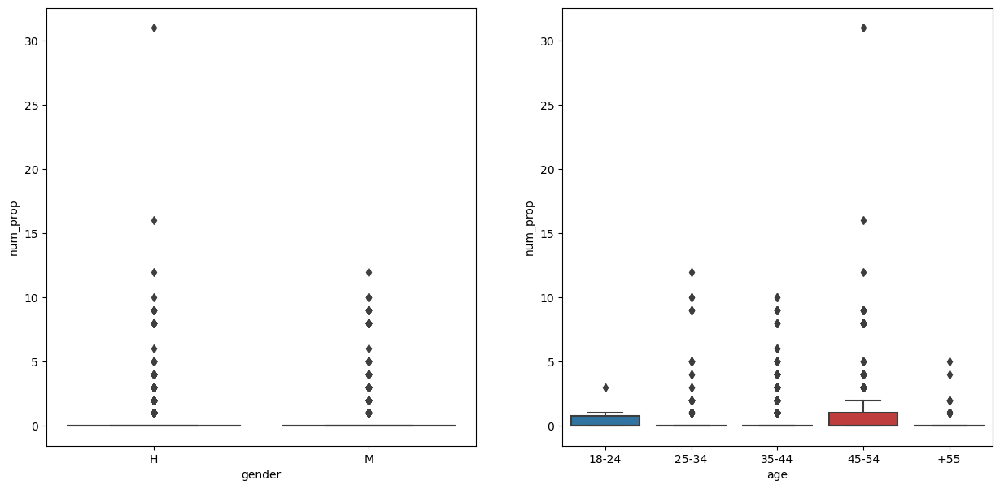

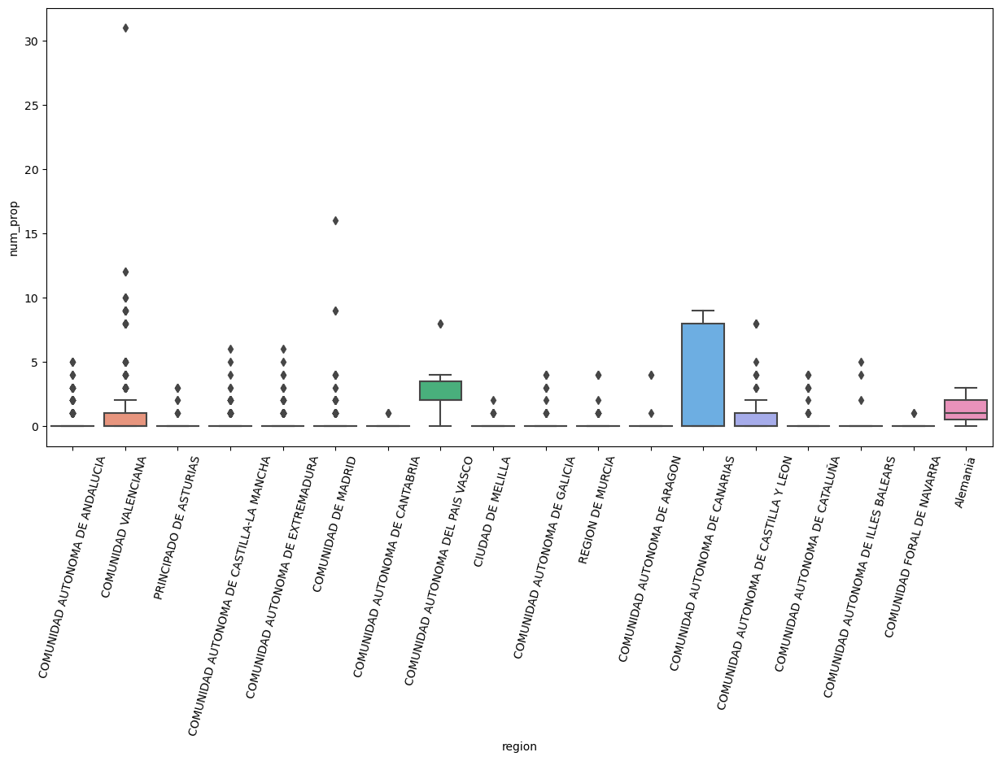

In [33]:
# remove outliers
data = df_syntactic.copy()
#data = remove_outliers(data,column='num_prop',value=2)
# boxplot
box_plot('num_prop',data)
# statistics
statistics('num_prop',data)

### 8. Number of pronouns

In [158]:
# Mann-Whitney U test
data = df_syntactic.copy()
res = mann_whitney(data,'num_pronouns')
print(res)

MannwhitneyuResult(statistic=1443959.5, pvalue=5.584865103657176e-05)


In [159]:
# Kruskal-Wallis test
kruskal_posthoc(df_syntactic,'num_pronouns')


AGE: KruskalResult(statistic=88.59342058551005, pvalue=2.6196894770023385e-18)
AGE:               18-24     25-34         35-44         45-54           +55
18-24  1.000000e+00  0.070597  7.671063e-07  1.747177e-17  2.431921e-09
25-34  7.059720e-02  1.000000  1.000000e+00  1.000000e+00  1.000000e+00
35-44  7.671063e-07  1.000000  1.000000e+00  2.725466e-03  1.000000e+00
45-54  1.747177e-17  1.000000  2.725466e-03  1.000000e+00  4.766319e-04
+55    2.431921e-09  1.000000  1.000000e+00  4.766319e-04  1.000000e+00
REGION: KruskalResult(statistic=209.22598795056194, pvalue=3.9702933237236405e-35)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDA

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.15346837067831126
The f of Cohen for age is: 1.00701645060735
The f of Cohen normalized for age is: 0.23066293114502368
The f of Cohen for demography is: 1.7824260125169658
The f of Cohen normalized for demography is: 0.1450252984259085


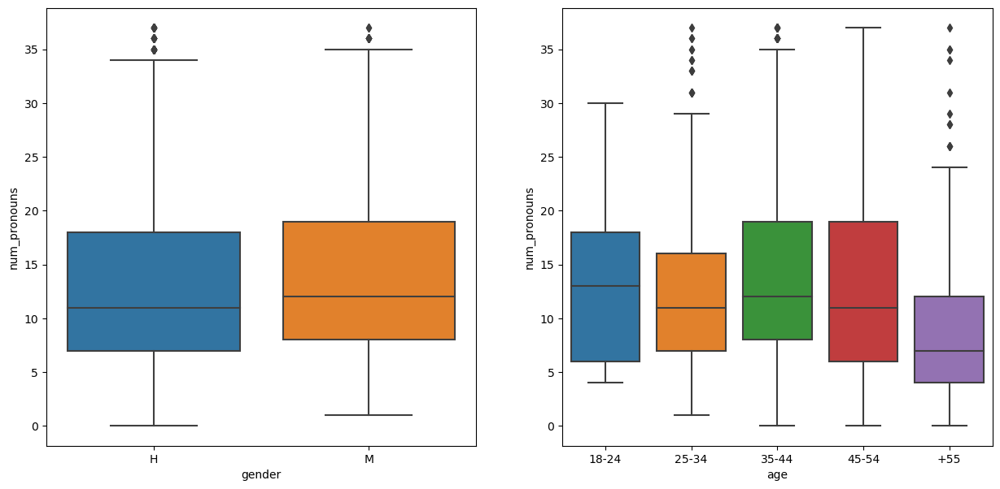

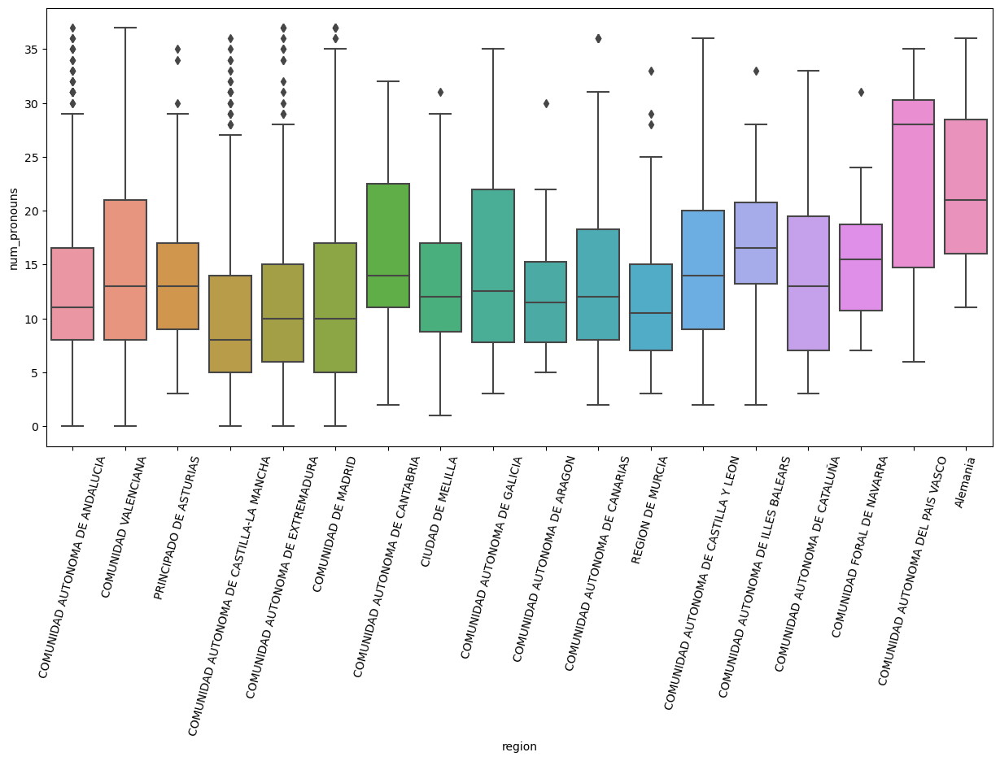

In [36]:
# remove outliers
data = df_syntactic.copy()
data = remove_outliers(data,column='num_pronouns',value=37)
# boxplot
box_plot('num_pronouns',data)
# statistics
statistics('num_pronouns',data)

### 9. Number of past tense verbs

In [160]:
# Mann-Whitney U test
data = df_syntactic.copy()
res = mann_whitney(data,'num_past')
print(res)

MannwhitneyuResult(statistic=1315337.5, pvalue=0.6834959410984025)


In [161]:
# Kruskal-Wallis test
kruskal_posthoc(df_syntactic,'num_past')


AGE: KruskalResult(statistic=20.256040052386904, pvalue=0.00044450299196551526)
AGE:           18-24     25-34     35-44     45-54       +55
18-24  1.000000  0.456649  0.635078  0.635078  0.503220
25-34  0.456649  1.000000  0.635078  0.211258  0.141611
35-44  0.635078  0.635078  1.000000  0.010196  0.001379
45-54  0.635078  0.211258  0.010196  1.000000  0.635078
+55    0.503220  0.141611  0.001379  0.635078  1.000000
REGION: KruskalResult(statistic=57.29544072363617, pvalue=2.916067799100061e-06)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRID         

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: -0.03331506359202728
The f of Cohen for age is: 0.06965674973036176
The f of Cohen normalized for age is: 0.12888412347087538
The f of Cohen for demography is: 0.11113475042884693
The f of Cohen normalized for demography is: 0.0901092571044705


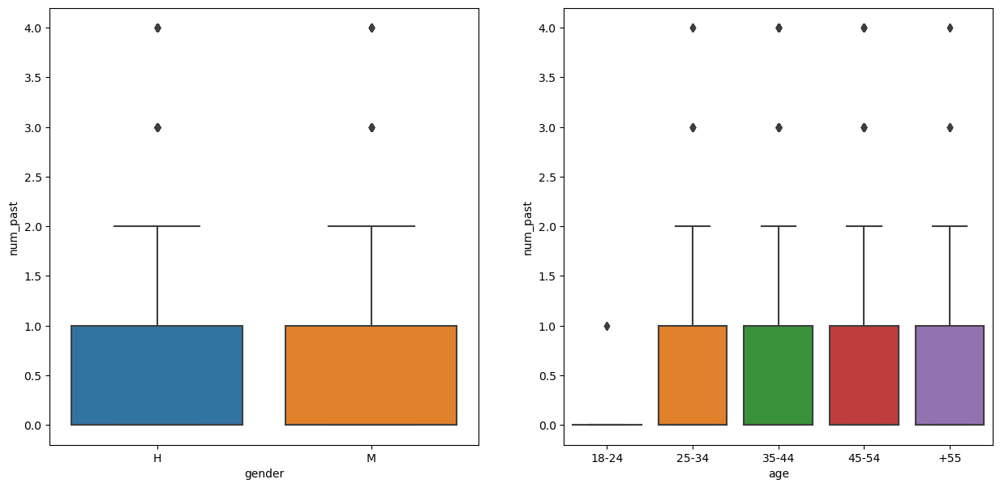

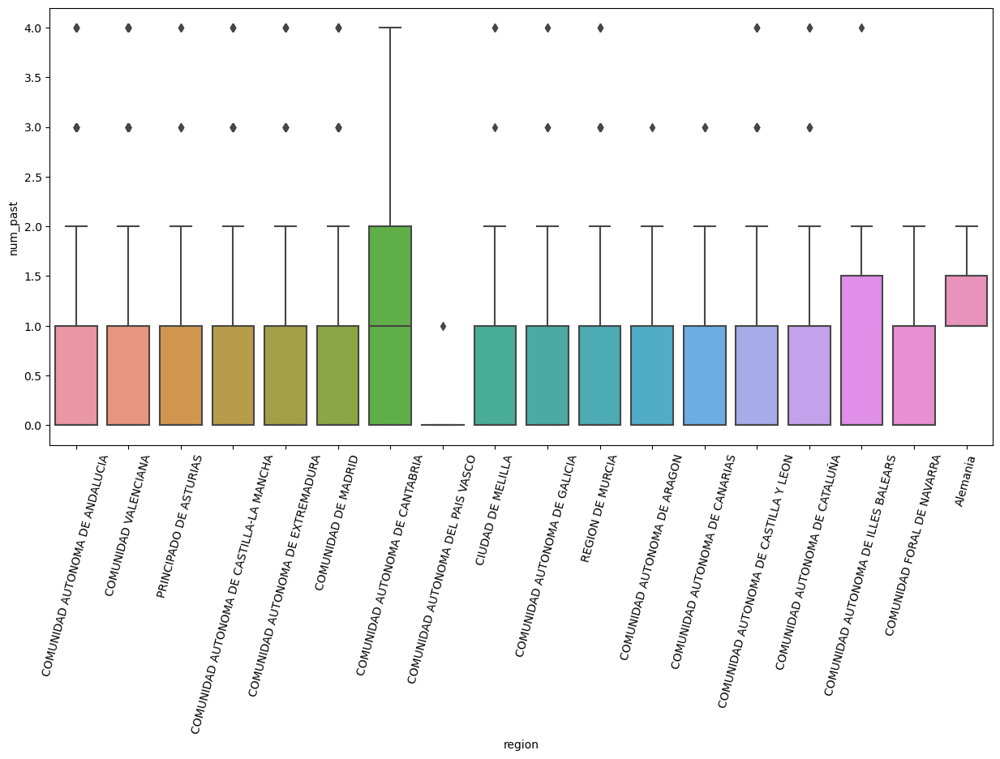

In [39]:
# remove outliers
data = df_syntactic.copy()
data = remove_outliers(data,column='num_past',value=4)
# boxplot
box_plot('num_past',data)
# statistics
statistics('num_past',data)

### 10. Number of future tense verbs

In [162]:
# Mann-Whitney U test
data = df_syntactic.copy()
res = mann_whitney(data,'num_future')
print(res)

MannwhitneyuResult(statistic=1324902.0, pvalue=0.44594256938222476)


In [163]:
# Kruskal-Wallis test
kruskal_posthoc(df_syntactic,'num_future')


AGE: KruskalResult(statistic=0.9252461353505232, pvalue=0.920911238733007)
AGE:        18-24  25-34  35-44  45-54  +55
18-24    1.0    1.0    1.0    1.0  1.0
25-34    1.0    1.0    1.0    1.0  1.0
35-44    1.0    1.0    1.0    1.0  1.0
45-54    1.0    1.0    1.0    1.0  1.0
+55      1.0    1.0    1.0    1.0  1.0
REGION: KruskalResult(statistic=2.5877477335761663, pvalue=0.9999762775244788)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRID                                                   1.0   
COMUNIDAD AUTONOMA DE CANTABRIA                             

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: -0.027716771050064447
The f of Cohen for age is: 0.0007958436622066713
The f of Cohen normalized for age is: 0.36569016278396543
The f of Cohen for demography is: 0.0008112857379371967
The f of Cohen normalized for demography is: 0.48230937120366346


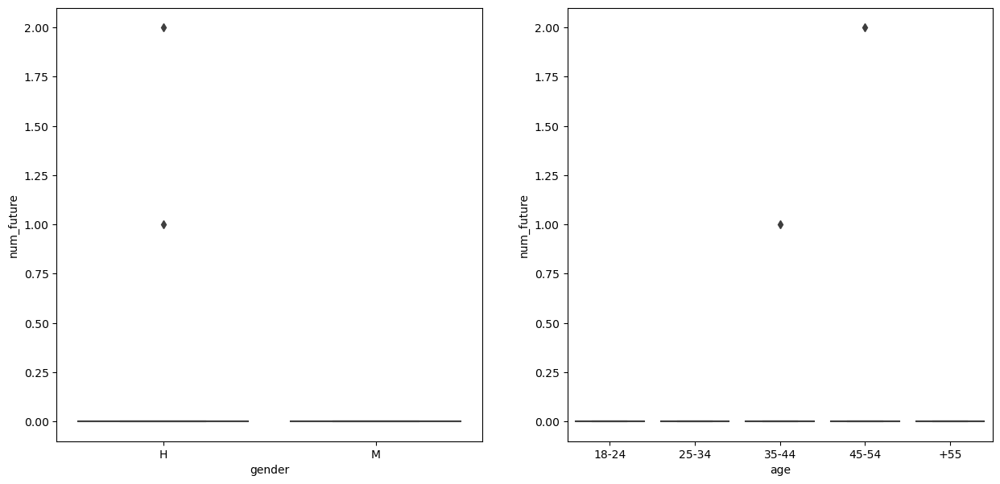

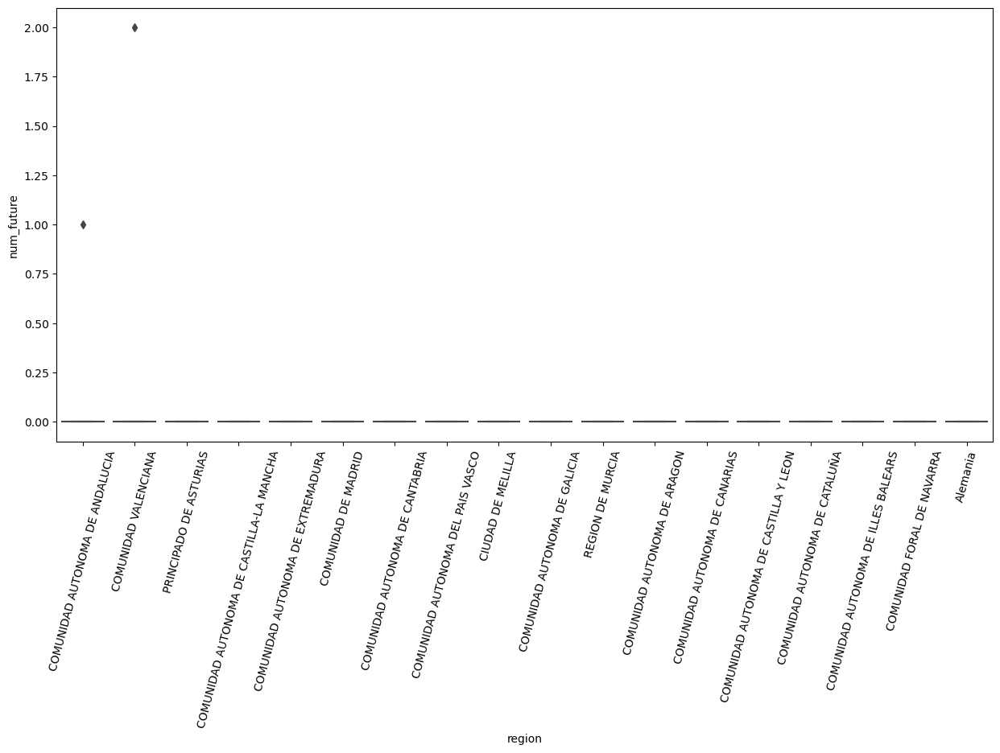

In [40]:
# remove outliers
data = df_syntactic.copy()
#data = remove_outliers(data,column='num_future',value=4)
# boxplot
box_plot('num_future',data)
# statistics
statistics('num_future',data)

### 11. Number of conjunctions

In [164]:
# Mann-Whitney U test
data = df_syntactic.copy()
res = mann_whitney(data,'num_conj')
print(res)

MannwhitneyuResult(statistic=1411695.5, pvalue=0.003330055294727995)


In [165]:
# Kruskal-Wallis test
kruskal_posthoc(df_syntactic,'num_conj')


AGE: KruskalResult(statistic=31.671309434156555, pvalue=2.233019673080488e-06)
AGE:           18-24     25-34     35-44     45-54       +55
18-24  1.000000  0.733393  1.000000  0.000192  0.009296
25-34  0.733393  1.000000  1.000000  1.000000  1.000000
35-44  1.000000  1.000000  1.000000  0.000417  0.059326
45-54  0.000192  1.000000  0.000417  1.000000  0.664066
+55    0.009296  1.000000  0.059326  0.664066  1.000000
REGION: KruskalResult(statistic=143.48421344045227, pvalue=4.582501337648374e-22)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRID         

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.06647809968279604
The f of Cohen for age is: 0.3674947413744072
The f of Cohen normalized for age is: 0.32728228732045117
The f of Cohen for demography is: 0.7606006402934891
The f of Cohen normalized for demography is: 0.114884207937486


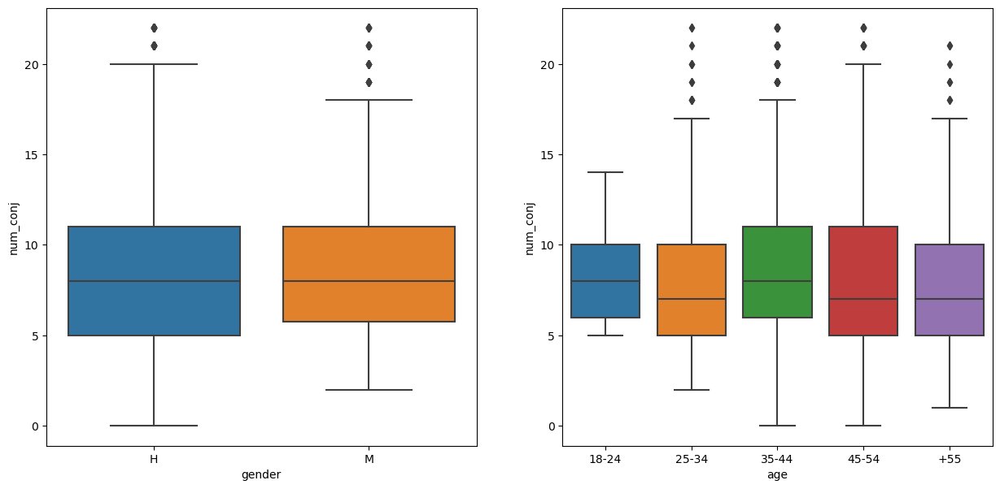

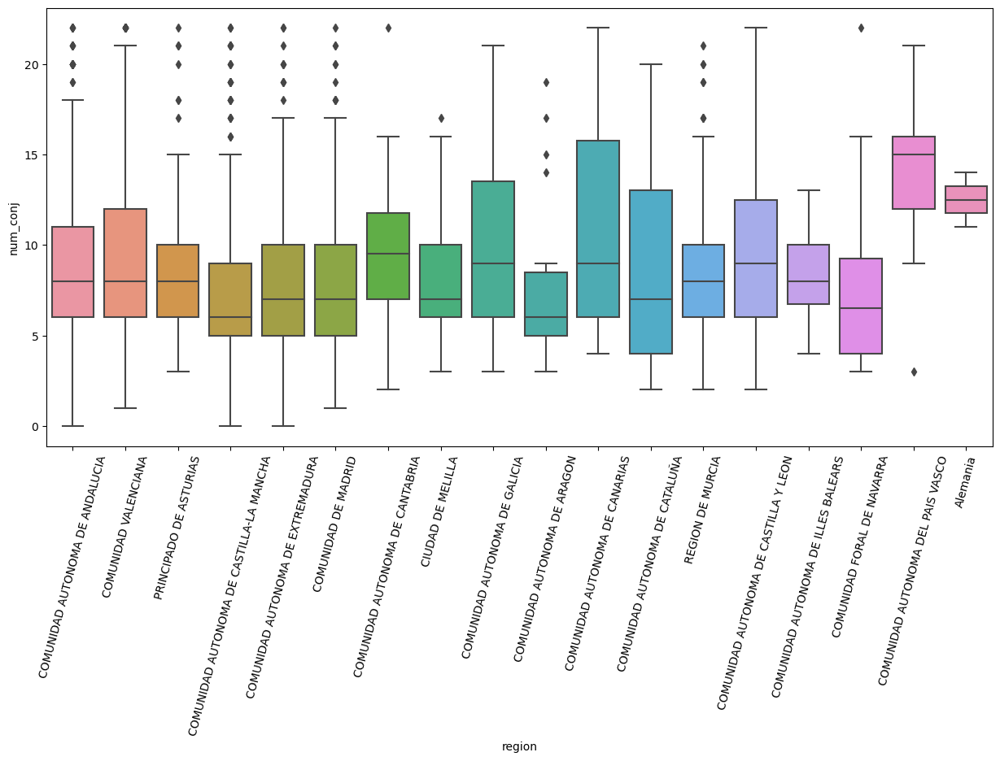

In [42]:
# remove outliers
data = df_syntactic.copy()
data = remove_outliers(data,column='num_conj',value=22)
# boxplot
box_plot('num_conj',data)
# statistics
statistics('num_conj',data)

In [166]:
# load data for character based features analysis
def df_syntactic_based_ratios():
    data = pd.DataFrame() 
    pos_tag = nltk.UnigramTagger(cess_esp.tagged_sents())

    tags_dict = {}
    ratio_det = []
    ratio_pre = []
    ratio_sing = []
    ratio_plural = []
    ratio_adv = []
    ratio_adj = []
    ratio_prop = []
    ratio_pronouns = []
    ratio_past = []
    ratio_future = []
    ratio_conj = []
    list_genero = []
    list_edad  = []
    list_region = []

    for file in files:
        with open(f'Atestados/{file}') as f:
            _dict = json.load(f)

            # policia
            policia = _dict['cp']
            provincia = policia['provincia'].title()
            genero = policia['sexo']
            fn = policia['fn']
            region = get_region(provincia)
            edad = get_edad(fn)

            list_genero.append(genero)
            list_edad.append(edad)
            list_region.append(region)

            # denuncia
            text = _dict['denuncia']
            
            # clean text
            text = quitar_tags(text)
            text = quitar_guiones(text,file)
            cleaned_text = replace_multi_whitespaces(text)
            cleaned_text = cleaned_text.translate(str.maketrans('','',string.punctuation))
            cleaned_text = cleaned_text.replace('\n','')
            analysis = pos_tag.tag(cleaned_text.split(' '))

            num_words = len(analysis)

            det = 0
            pre = 0
            sing = 0
            plural = 0
            adv = 0
            adj = 0
            prop = 0
            pronouns = 0
            past = 0
            future = 0
            conj = 0

            for word,tag in analysis:
                if tag != None:
                    if tag[0] == 'd':
                        det += 1
                    elif tag[0] == 'a':
                        adj += 1
                    elif tag[0] == 'c':
                        conj += 1
                    elif tag[0] == 'p':
                        pronouns += 1
                    elif tag[0] == 'n':
                        if tag[1] == 'p':
                            prop += 1
                        if tag[3] == 's':
                            sing += 1
                        elif tag[3] == 'p':
                            plural += 1
                    elif tag[0] == 'r':
                        adv += 1
                    elif (tag[0] == 'v' and tag[3] == 'f'):
                        future += 1
                    elif (tag[0] == 'v' and tag[3] == 's'):
                        past += 1
                    elif tag[0] == 's':
                        pre += 1

            
            ratio_det.append(det/num_words)
            ratio_pre.append(pre/num_words)
            ratio_sing.append(sing/num_words)
            ratio_plural.append(plural/num_words)
            ratio_adv.append(adv/num_words)
            ratio_adj.append(adj/num_words)
            ratio_prop.append(prop/num_words)
            ratio_pronouns.append(pronouns/num_words)
            ratio_past.append(past/num_words)
            ratio_future.append(future/num_words)
            ratio_conj.append(conj/num_words)

    for k,v in tags_dict.items():
        data[k] = v
    
    data['ratio_det'] = ratio_det
    data['ratio_pre'] = ratio_pre
    data['ratio_sing'] = ratio_sing
    data['ratio_plural'] = ratio_plural
    data['ratio_adv'] = ratio_adv
    data['ratio_adj'] = ratio_adj
    data['ratio_prop'] = ratio_prop
    data['ratio_pronouns'] = ratio_pronouns
    data['ratio_past'] = ratio_past
    data['ratio_future'] = ratio_future
    data['ratio_conj'] = ratio_conj
    data['gender'] = list_genero
    data['age'] = list_edad
    data['region'] = list_region

    return data

In [167]:
df_syntactic_ratios = df_syntactic_based_ratios()
df_syntactic_ratios.head()

,ratio_det,ratio_pre,ratio_sing,ratio_plural,ratio_adv,ratio_adj,ratio_prop,ratio_pronouns,ratio_past,ratio_future,ratio_conj,gender,age,region
0,0.116279,0.232558,0.116279,0.000000,0.000000,0.069767,0.000000,0.069767,0.000000,0.0,0.046512,H,35-44,COMUNIDAD AUTONOMA DE ANDALUCIA
1,0.150000,0.187500,0.112500,0.018750,0.031250,0.050000,0.000000,0.106250,0.000000,0.0,0.056250,H,35-44,COMUNIDAD VALENCIANA
2,0.150000,0.175000,0.075000,0.025000,0.008333,0.050000,0.000000,0.083333,0.008333,0.0,0.091667,H,35-44,COMUNIDAD AUTONOMA DE ANDALUCIA
3,0.080247,0.185185,0.089506,0.024691,0.000000,0.049383,0.003086,0.040123,0.003086,0.0,0.064815,H,25-34,COMUNIDAD VALENCIANA
4,0.139205,0.188920,0.110795,0.019886,0.019886,0.048295,0.007102,0.071023,0.000000,0.0,0.063920,H,35-44,PRINCIPADO DE ASTURIAS


### 1. Ratio of determiners

In [168]:
# Mann-Whitney U test
data = df_syntactic_ratios.copy()
res = mann_whitney(data,'ratio_det')
print(res)

MannwhitneyuResult(statistic=1369975.5, pvalue=0.1321426350616124)


In [169]:
# Kruskal-Wallis test
kruskal_posthoc(df_syntactic_ratios,'ratio_det')


AGE: KruskalResult(statistic=5.683671011073534, pvalue=0.22405017494784807)
AGE:           18-24  25-34  35-44     45-54       +55
18-24  1.000000    1.0    1.0  0.961993  1.000000
25-34  1.000000    1.0    1.0  1.000000  1.000000
35-44  1.000000    1.0    1.0  1.000000  1.000000
45-54  0.961993    1.0    1.0  1.000000  0.923529
+55    1.000000    1.0    1.0  0.923529  1.000000
REGION: KruskalResult(statistic=81.96982236230362, pvalue=1.710146877903702e-10)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRID                                                 

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.056308183497896125
The f of Cohen for age is: 0.00092017619526505
The f of Cohen normalized for age is: 0.09570367648104687
The f of Cohen for demography is: 0.0033101889549058206
The f of Cohen normalized for demography is: 0.18677775714347086


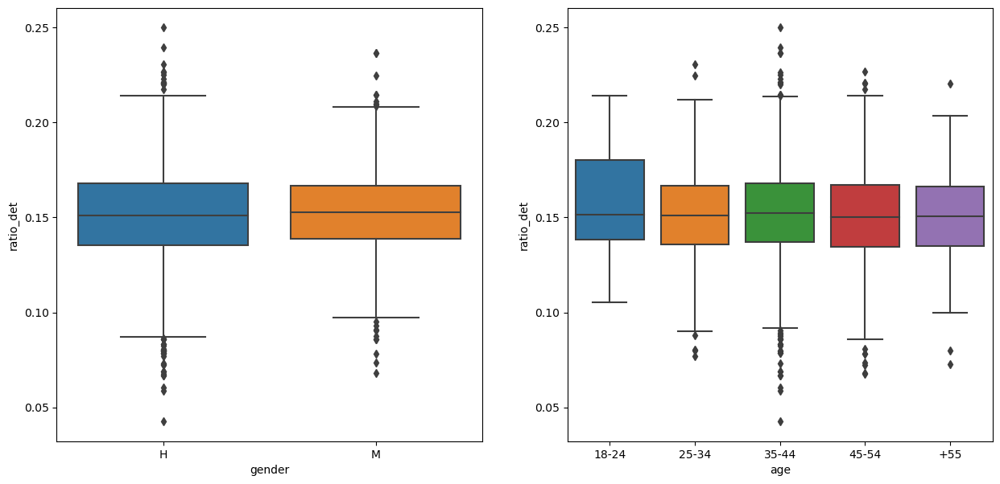

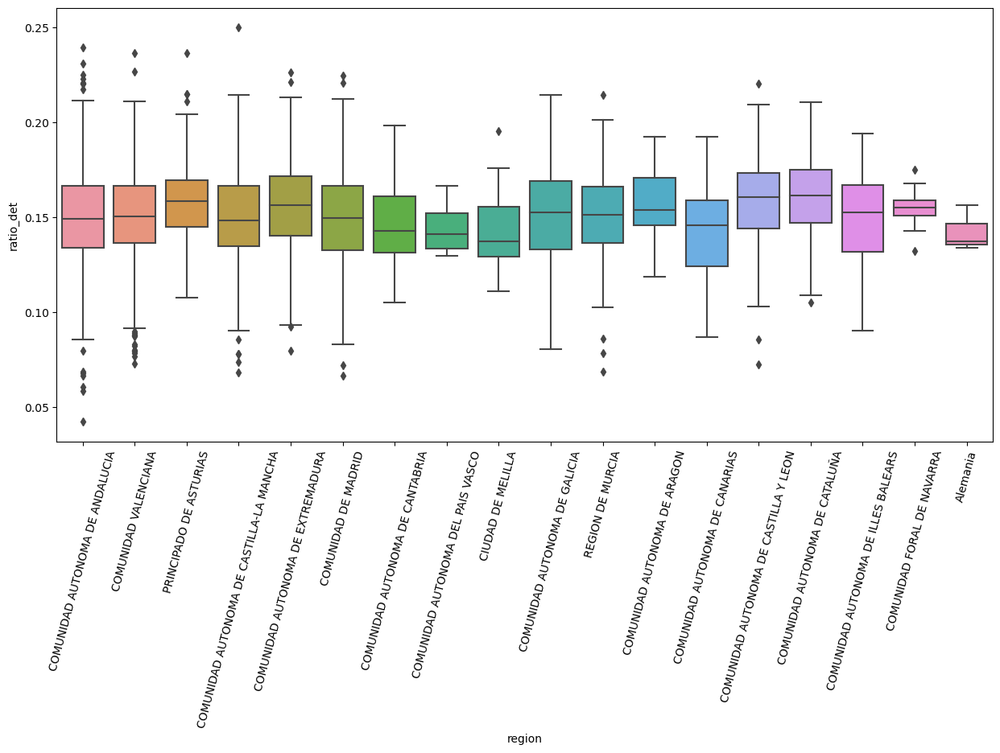

In [20]:
# remove outliers
data = df_syntactic_ratios.copy()
#data = remove_outliers(data,column='ratio_det',value=60)
# boxplot
box_plot('ratio_det',data)
# statistics
statistics('ratio_det',data)

### 2. Ratio of prepositions

In [170]:
# Mann-Whitney U test
data = df_syntactic_ratios.copy()
res = mann_whitney(data,'ratio_pre')
print(res)

MannwhitneyuResult(statistic=1314587.0, pvalue=0.7029638680124888)


In [171]:
# Kruskal-Wallis test
kruskal_posthoc(df_syntactic_ratios,'ratio_pre')


AGE: KruskalResult(statistic=2.5763432381511446, pvalue=0.631019483313694)
AGE:        18-24  25-34  35-44  45-54  +55
18-24    1.0    1.0    1.0    1.0  1.0
25-34    1.0    1.0    1.0    1.0  1.0
35-44    1.0    1.0    1.0    1.0  1.0
45-54    1.0    1.0    1.0    1.0  1.0
+55      1.0    1.0    1.0    1.0  1.0
REGION: KruskalResult(statistic=56.122156327458555, pvalue=4.519233969713085e-06)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRID                                                   1.0   
COMUNIDAD AUTONOMA DE CANTABRIA                          

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: -0.030339303558803085
The f of Cohen for age is: 0.0005660293689907827
The f of Cohen normalized for age is: 0.09312068124012281
The f of Cohen for demography is: 0.002989358120067977
The f of Cohen normalized for demography is: 0.10424384559415875


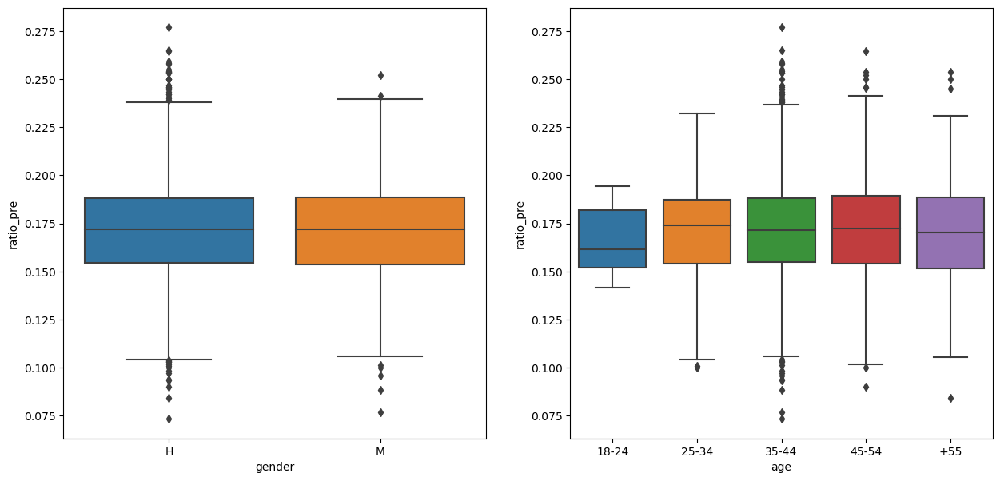

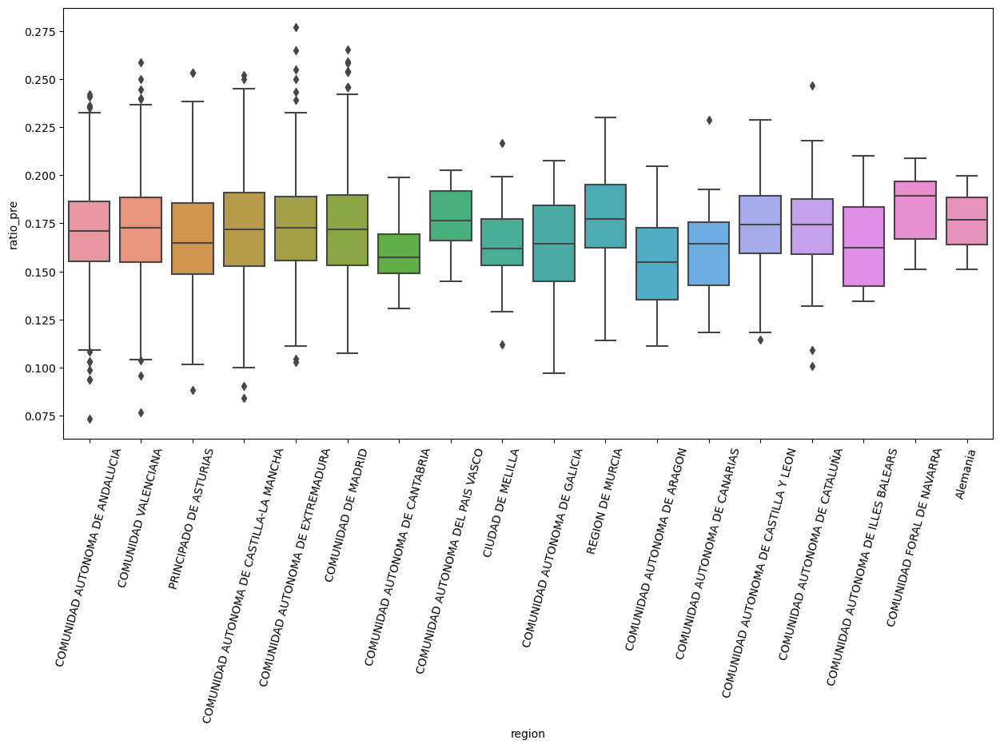

In [21]:
# remove outliers
data = df_syntactic_ratios.copy()
#data = remove_outliers(data,column='ratio_pre',value=70)
# boxplot
box_plot('ratio_pre',data)
# statistics
statistics('ratio_pre',data)

### 3. Ratio of singular nouns

In [172]:
# Mann-Whitney U test
data = df_syntactic_ratios.copy()
res = mann_whitney(data,'ratio_sing')
print(res)

MannwhitneyuResult(statistic=1210693.5, pvalue=8.821324147434615e-05)


In [173]:
# Kruskal-Wallis test
kruskal_posthoc(df_syntactic_ratios,'ratio_sing')


AGE: KruskalResult(statistic=18.129878662712983, pvalue=0.0011640135370560177)
AGE:           18-24  25-34     35-44     45-54       +55
18-24  1.000000    1.0  1.000000  1.000000  0.258764
25-34  1.000000    1.0  1.000000  1.000000  1.000000
35-44  1.000000    1.0  1.000000  0.796991  0.002642
45-54  1.000000    1.0  0.796991  1.000000  0.006412
+55    0.258764    1.0  0.002642  0.006412  1.000000
REGION: KruskalResult(statistic=64.30321013460484, pvalue=2.014047328876628e-07)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRID                            

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: -0.15084355510191083
The f of Cohen for age is: 0.0017134655986103464
The f of Cohen normalized for age is: 0.2528610627098123
The f of Cohen for demography is: 0.003190516906819893
The f of Cohen normalized for demography is: 0.1700023603685807


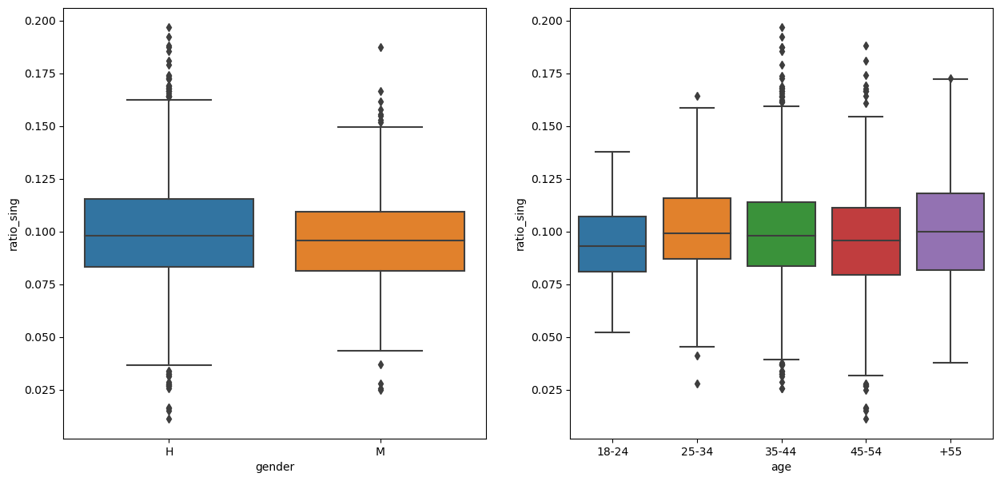

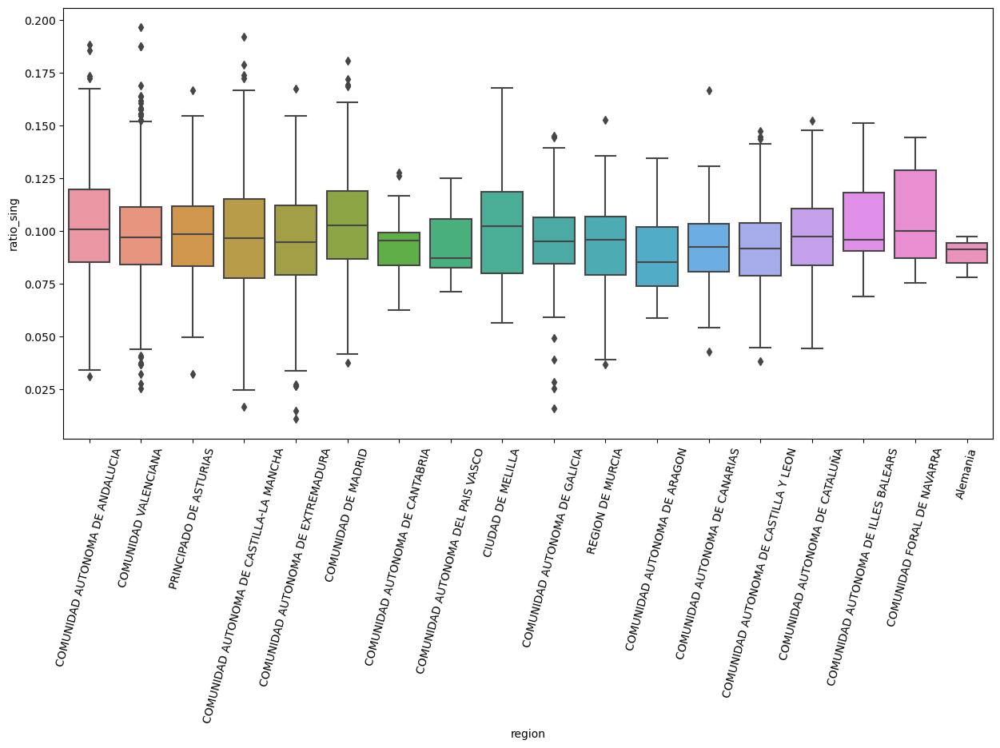

In [22]:
# remove outliers
data = df_syntactic_ratios.copy()
#data = remove_outliers(data,column='num_sing',value=40)
# boxplot
box_plot('ratio_sing',data)
# statistics
statistics('ratio_sing',data)

### 4. Ratio of plural nouns

In [174]:
# Mann-Whitney U test
data = df_syntactic_ratios.copy()
res = mann_whitney(data,'ratio_plural')
print(res)

MannwhitneyuResult(statistic=1211491.5, pvalue=9.870682300048608e-05)


In [175]:
# Kruskal-Wallis test
kruskal_posthoc(df_syntactic_ratios,'ratio_plural')


AGE: KruskalResult(statistic=10.901070116497788, pvalue=0.027698639677382585)
AGE:           18-24     25-34     35-44     45-54       +55
18-24  1.000000  0.073761  1.000000  1.000000  1.000000
25-34  0.073761  1.000000  0.020349  0.022337  0.022344
35-44  1.000000  0.020349  1.000000  1.000000  1.000000
45-54  1.000000  0.022337  1.000000  1.000000  1.000000
+55    1.000000  0.022344  1.000000  1.000000  1.000000
REGION: KruskalResult(statistic=25.46133400066072, pvalue=0.08484965116247427)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRID             

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: -0.14725383982917156
The f of Cohen for age is: 0.0006112154504656752
The f of Cohen normalized for age is: 0.07373148632811044
The f of Cohen for demography is: 0.0011349757109832687
The f of Cohen normalized for demography is: 0.07825680325446052


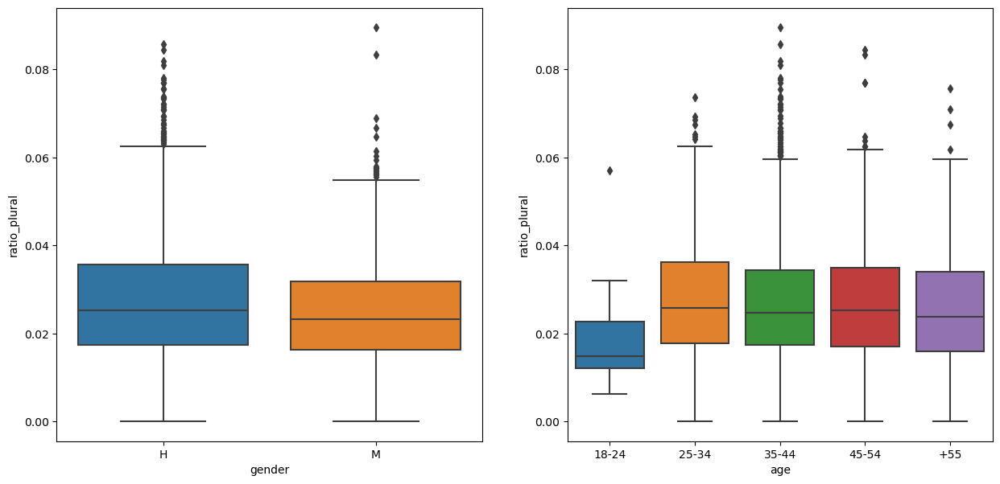

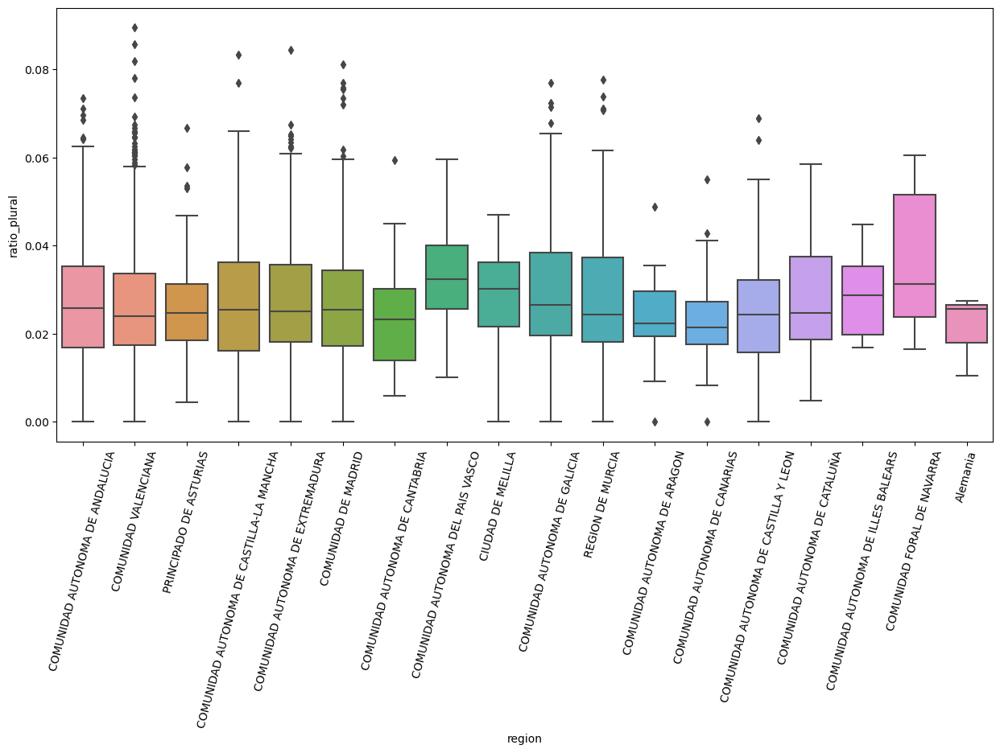

In [23]:
# remove outliers
data = df_syntactic_ratios.copy()
#data = remove_outliers(data,column='num_plural',value=12)
# boxplot
box_plot('ratio_plural',data)
# statistics
statistics('ratio_plural',data)

### 5. Ratio of adverbs

In [176]:
# Mann-Whitney U test
data = df_syntactic_ratios.copy()
res = mann_whitney(data,'ratio_adv')
print(res)

MannwhitneyuResult(statistic=1383110.0, pvalue=0.05064941732908562)


In [177]:
# Kruskal-Wallis test
kruskal_posthoc(df_syntactic_ratios,'ratio_adv')


AGE: KruskalResult(statistic=34.44780901378981, pvalue=6.03107524516496e-07)
AGE:           18-24     25-34     35-44         45-54           +55
18-24  1.000000  0.718195  0.718195  8.903481e-01  7.632062e-02
25-34  0.718195  1.000000  0.458201  7.181947e-01  2.011707e-01
35-44  0.718195  0.458201  1.000000  4.582013e-01  2.859771e-01
45-54  0.890348  0.718195  0.458201  1.000000e+00  2.736254e-07
+55    0.076321  0.201171  0.285977  2.736254e-07  1.000000e+00
REGION: KruskalResult(statistic=94.36090695250839, pvalue=9.750917196515362e-13)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                           

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.09056415889143572
The f of Cohen for age is: 0.0013548445611177107
The f of Cohen normalized for age is: 0.14122483658208343
The f of Cohen for demography is: 0.002340405441890856
The f of Cohen normalized for demography is: 0.1618241944804468


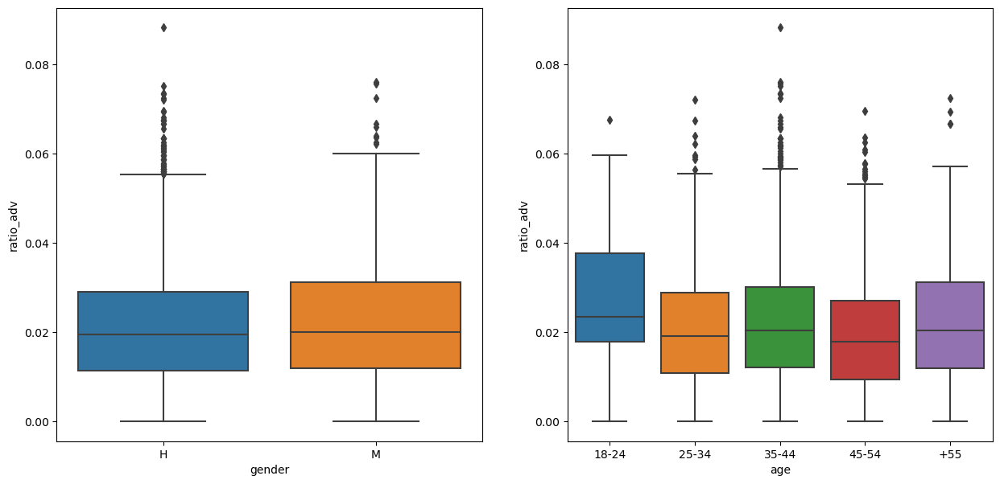

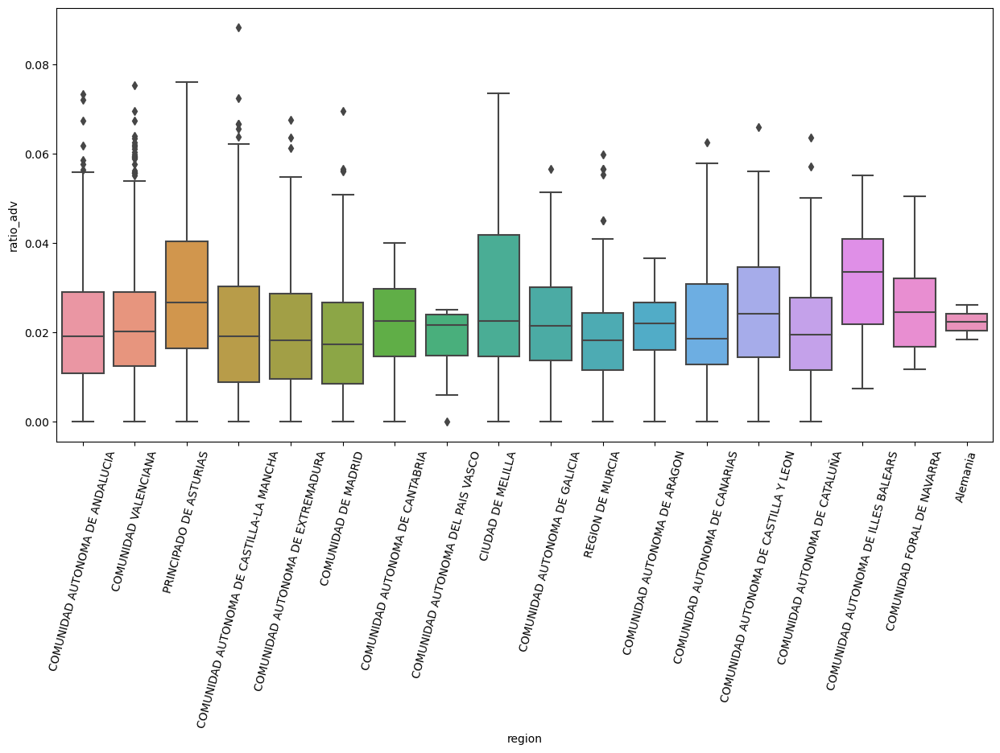

In [24]:
# remove outliers
data = df_syntactic_ratios.copy()
#data = remove_outliers(data,column='num_adv',value=12)
# boxplot
box_plot('ratio_adv',data)
# statistics
statistics('ratio_adv',data)

### 6. Ratio of adjetives

In [178]:
# Mann-Whitney U test
data = df_syntactic_ratios.copy()
res = mann_whitney(data,'ratio_adj')
print(res)

MannwhitneyuResult(statistic=1359384.0, pvalue=0.25227004368748773)


In [179]:
# Kruskal-Wallis test
kruskal_posthoc(df_syntactic_ratios,'ratio_adj')


AGE: KruskalResult(statistic=9.641147674454066, pvalue=0.0469263943326696)
AGE:           18-24     25-34     35-44     45-54       +55
18-24  1.000000  0.047063  0.959223  1.000000  1.000000
25-34  0.047063  1.000000  0.119192  0.059252  0.061773
35-44  0.959223  0.119192  1.000000  0.997914  1.000000
45-54  1.000000  0.059252  0.997914  1.000000  1.000000
+55    1.000000  0.061773  1.000000  1.000000  1.000000
REGION: KruskalResult(statistic=37.95890789595431, pvalue=0.0024899253216607727)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRID              

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.028125414709802593
The f of Cohen for age is: 0.0008476856306351872
The f of Cohen normalized for age is: 0.07618231292125438
The f of Cohen for demography is: 0.002108524238954496
The f of Cohen normalized for demography is: 0.14725305098865363


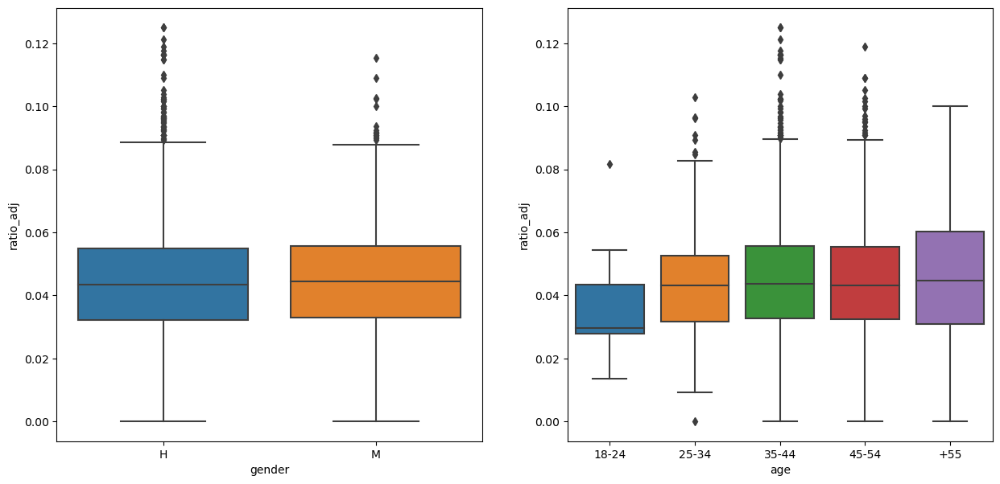

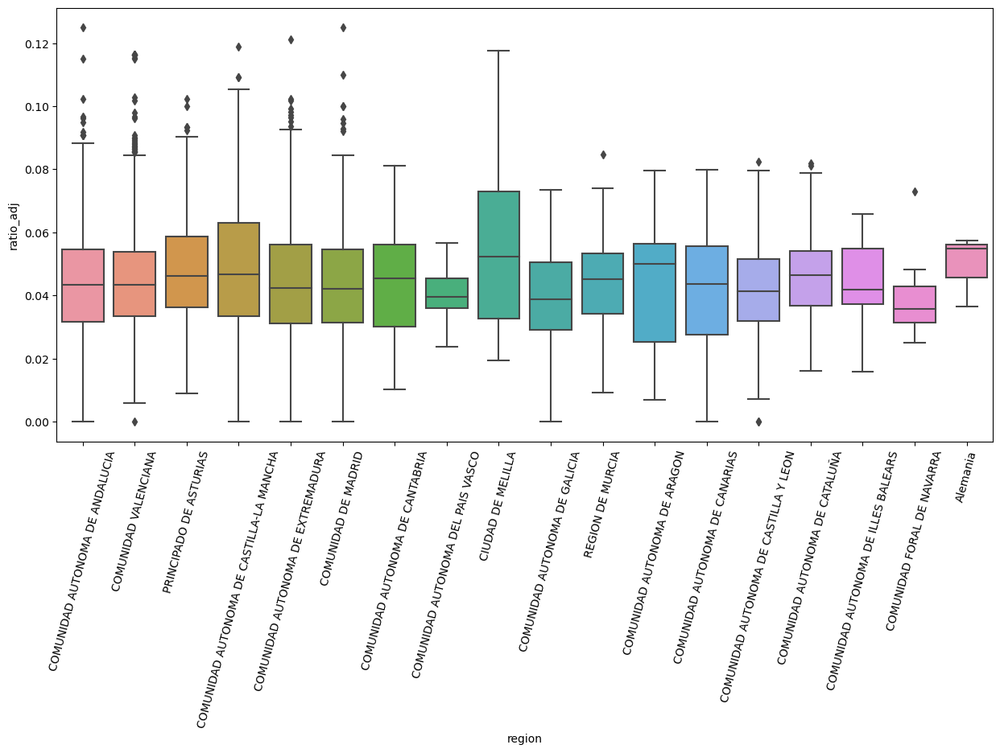

In [25]:
# remove outliers
data = df_syntactic_ratios.copy()
#data = remove_outliers(data,column='num_adj',value=18)
# boxplot
box_plot('ratio_adj',data)
# statistics
statistics('ratio_adj',data)

### 7. Ratio of proper nouns

In [180]:
# Mann-Whitney U test
data = df_syntactic_ratios.copy()
res = mann_whitney(data,'ratio_prop')
print(res)

MannwhitneyuResult(statistic=1391841.0, pvalue=0.001943505083140935)


In [181]:
# Kruskal-Wallis test
kruskal_posthoc(df_syntactic_ratios,'ratio_prop')


AGE: KruskalResult(statistic=23.535317794532105, pvalue=9.896507257466579e-05)


/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

AGE:           18-24  25-34     35-44     45-54       +55
18-24  1.000000    1.0  1.000000  0.441522  0.002073
25-34  1.000000    1.0  1.000000  1.000000  1.000000
35-44  1.000000    1.0  1.000000  1.000000  0.009299
45-54  0.441522    1.0  1.000000  1.000000  0.001071
+55    0.002073    1.0  0.009299  0.001071  1.000000
REGION: KruskalResult(statistic=115.17543531354184, pvalue=1.2723586610979102e-16)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRID                                                   1.0   
COMUNIDAD AUTONOMA DE CANTABRIA                

The d of Cohen for gender is: 0.15593296053428252
The f of Cohen for age is: 0.00043837305004011575
The f of Cohen normalized for age is: 0.3082096080957173
The f of Cohen for demography is: 0.0009057566482572737
The f of Cohen normalized for demography is: 0.06876034722630875


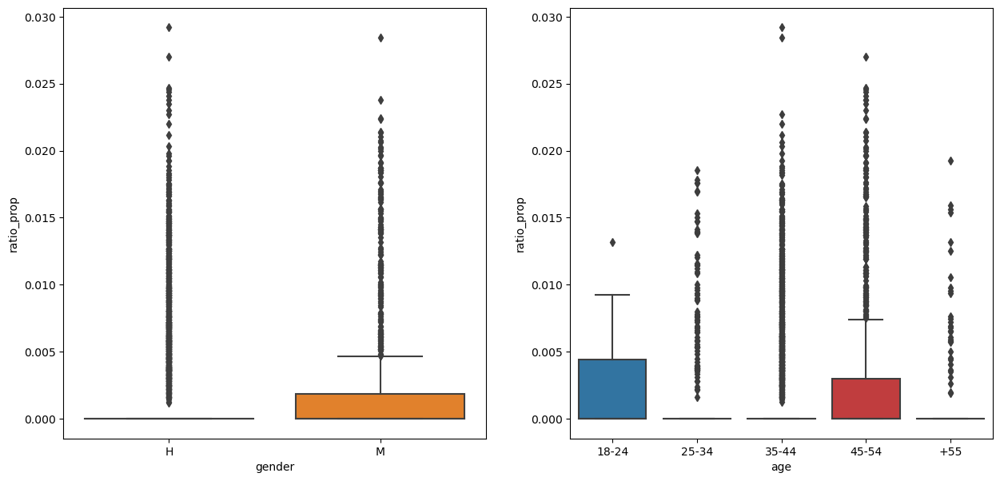

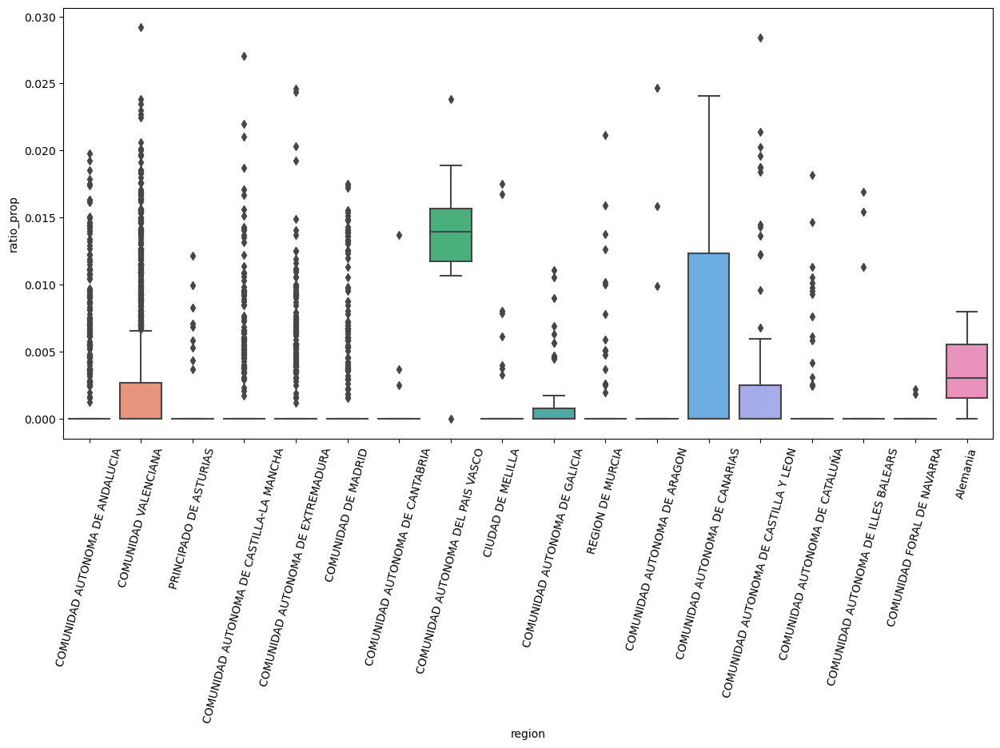

In [26]:
# remove outliers
data = df_syntactic_ratios.copy()
#data = remove_outliers(data,column='num_prop',value=2)
# boxplot
box_plot('ratio_prop',data)
# statistics
statistics('ratio_prop',data)

### 8. Ratio of pronouns

In [182]:
# Mann-Whitney U test
data = df_syntactic_ratios.copy()
res = mann_whitney(data,'ratio_pronouns')
print(res)

MannwhitneyuResult(statistic=1326481.0, pvalue=0.9809597967209511)


In [183]:
# Kruskal-Wallis test
kruskal_posthoc(df_syntactic_ratios,'ratio_pronouns')


AGE: KruskalResult(statistic=33.51731236081518, pvalue=9.358757535402978e-07)
AGE:        18-24  25-34     35-44         45-54           +55
18-24    1.0    1.0  1.000000  1.000000e+00  1.000000e+00
25-34    1.0    1.0  1.000000  1.000000e+00  1.000000e+00
35-44    1.0    1.0  1.000000  1.287355e-02  1.000000e+00
45-54    1.0    1.0  0.012874  1.000000e+00  7.694285e-07
+55      1.0    1.0  1.000000  7.694285e-07  1.000000e+00
REGION: KruskalResult(statistic=64.96346672126442, pvalue=1.558655571101391e-07)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRI

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.02452396364318108
The f of Cohen for age is: 0.002044397754974495
The f of Cohen normalized for age is: 0.4636931257873801
The f of Cohen for demography is: 0.0030550297551185106
The f of Cohen normalized for demography is: 0.11091578481408955


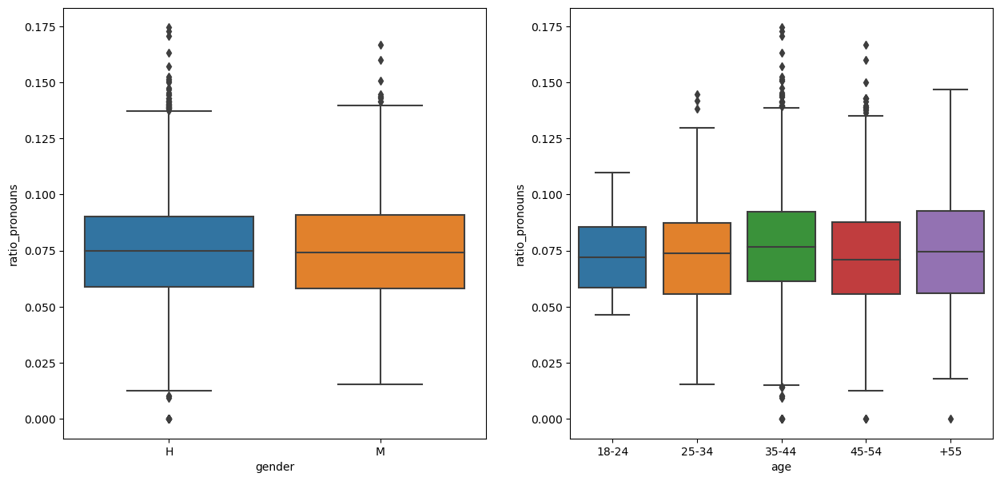

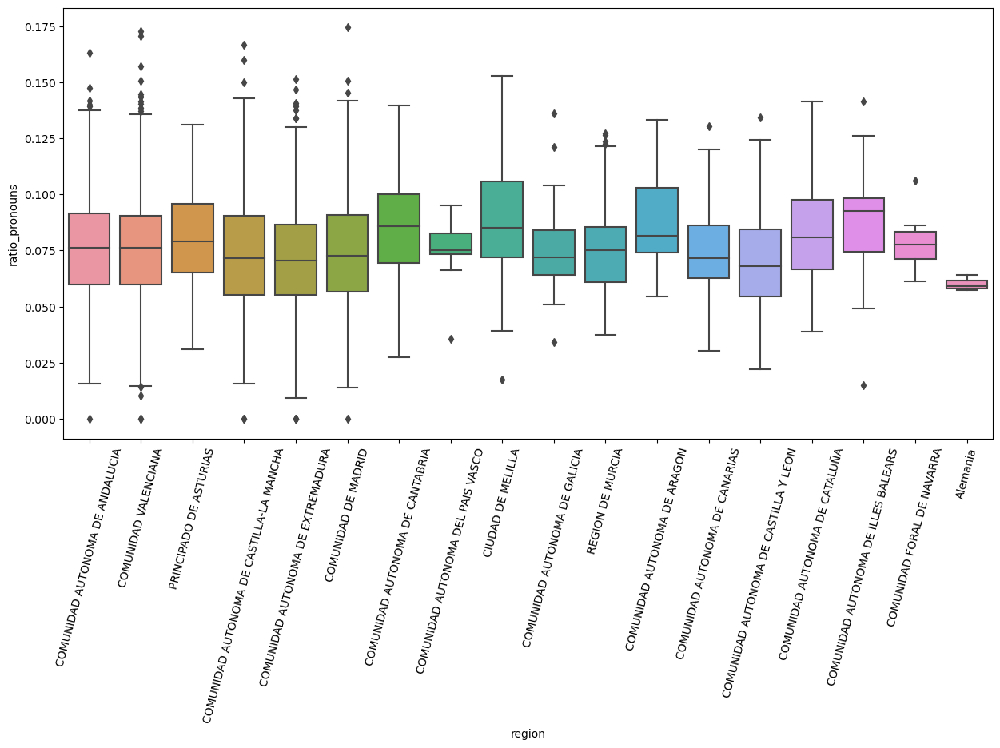

In [28]:
# remove outliers
data = df_syntactic_ratios.copy()
#data = remove_outliers(data,column='ratio_pronouns',value=37)
# boxplot
box_plot('ratio_pronouns',data)
# statistics
statistics('ratio_pronouns',data)

### 9. Ratio of past tense verbs

In [184]:
# Mann-Whitney U test
data = df_syntactic_ratios.copy()
res = mann_whitney(data,'ratio_past')
print(res)

MannwhitneyuResult(statistic=1306075.0, pvalue=0.44495191947749535)


In [185]:
# Kruskal-Wallis test
kruskal_posthoc(df_syntactic_ratios,'ratio_past')


AGE: KruskalResult(statistic=18.646786103102368, pvalue=0.0009219859607550915)
AGE:           18-24     25-34     35-44     45-54       +55
18-24  1.000000  0.224567  0.151184  1.000000  1.000000
25-34  0.224567  1.000000  0.593924  0.227809  0.175936
35-44  0.151184  0.593924  1.000000  0.019996  0.001600
45-54  1.000000  0.227809  0.019996  1.000000  0.490547
+55    1.000000  0.175936  0.001600  0.490547  1.000000
REGION: KruskalResult(statistic=54.61986017990633, pvalue=7.884938780594057e-06)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRID          

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: -0.05537172376672158
The f of Cohen for age is: 0.000604743287211546
The f of Cohen normalized for age is: 0.14790197341427108
The f of Cohen for demography is: 0.0009421801386231214
The f of Cohen normalized for demography is: 0.13783565834546882


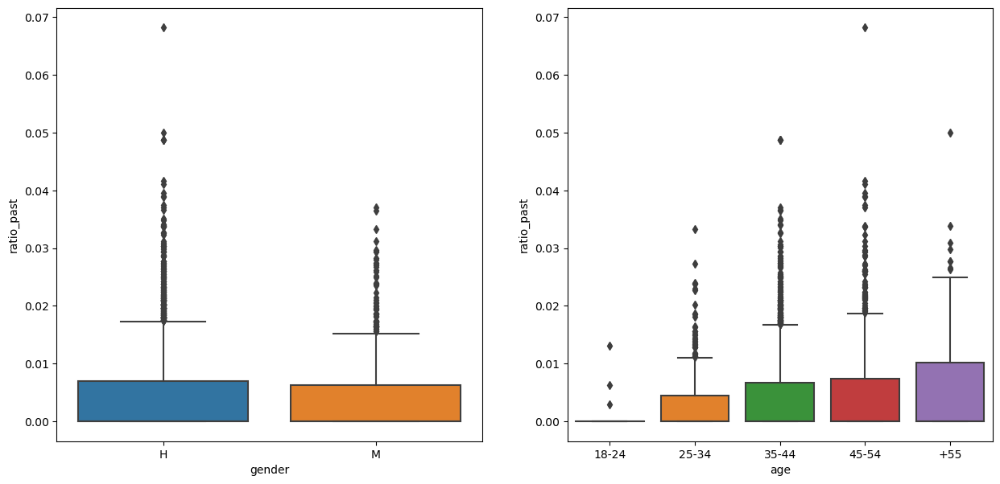

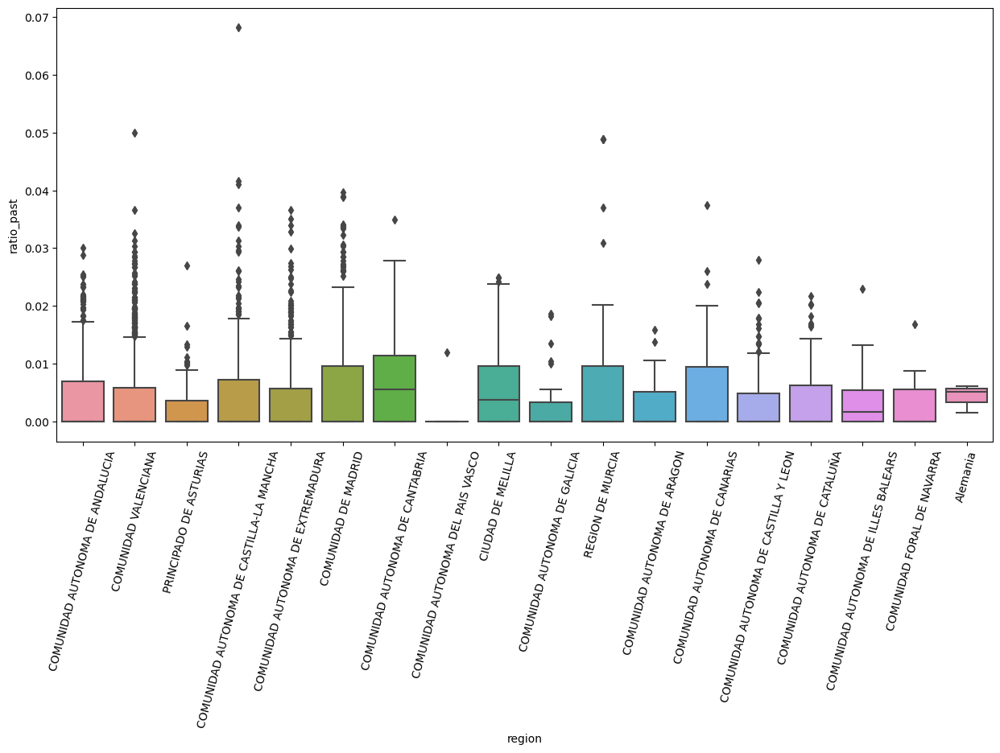

In [29]:
# remove outliers
data = df_syntactic_ratios.copy()
#data = remove_outliers(data,column='num_past',value=4)
# boxplot
box_plot('ratio_past',data)
# statistics
statistics('ratio_past',data)

### 10. Ratio of future tense verbs

In [186]:
# Mann-Whitney U test
data = df_syntactic_ratios.copy()
res = mann_whitney(data,'ratio_future')
print(res)

MannwhitneyuResult(statistic=1324902.0, pvalue=0.44594256938222476)


In [187]:
# Kruskal-Wallis test
kruskal_posthoc(df_syntactic_ratios,'ratio_future')


AGE: KruskalResult(statistic=0.9252461353505232, pvalue=0.920911238733007)
AGE:        18-24  25-34  35-44  45-54  +55
18-24    1.0    1.0    1.0    1.0  1.0
25-34    1.0    1.0    1.0    1.0  1.0
35-44    1.0    1.0    1.0    1.0  1.0
45-54    1.0    1.0    1.0    1.0  1.0
+55      1.0    1.0    1.0    1.0  1.0
REGION: KruskalResult(statistic=2.5877477335761663, pvalue=0.9999762775244788)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRID                                                   1.0   
COMUNIDAD AUTONOMA DE CANTABRIA                             

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: -0.0288157857736585
The f of Cohen for age is: 1.778858077639453e-06
The f of Cohen normalized for age is: 0.3468719885654604
The f of Cohen for demography is: 2.2324107680172317e-06
The f of Cohen normalized for demography is: 0.43678456122717946


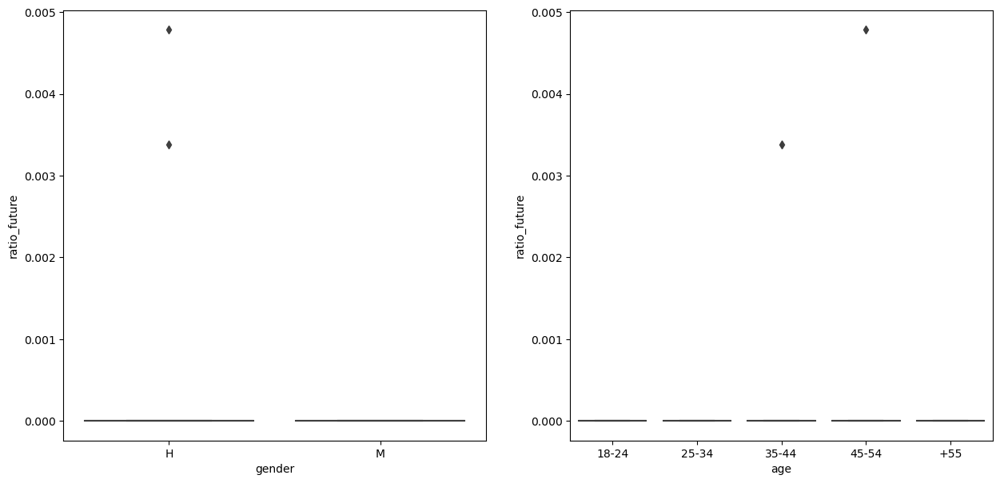

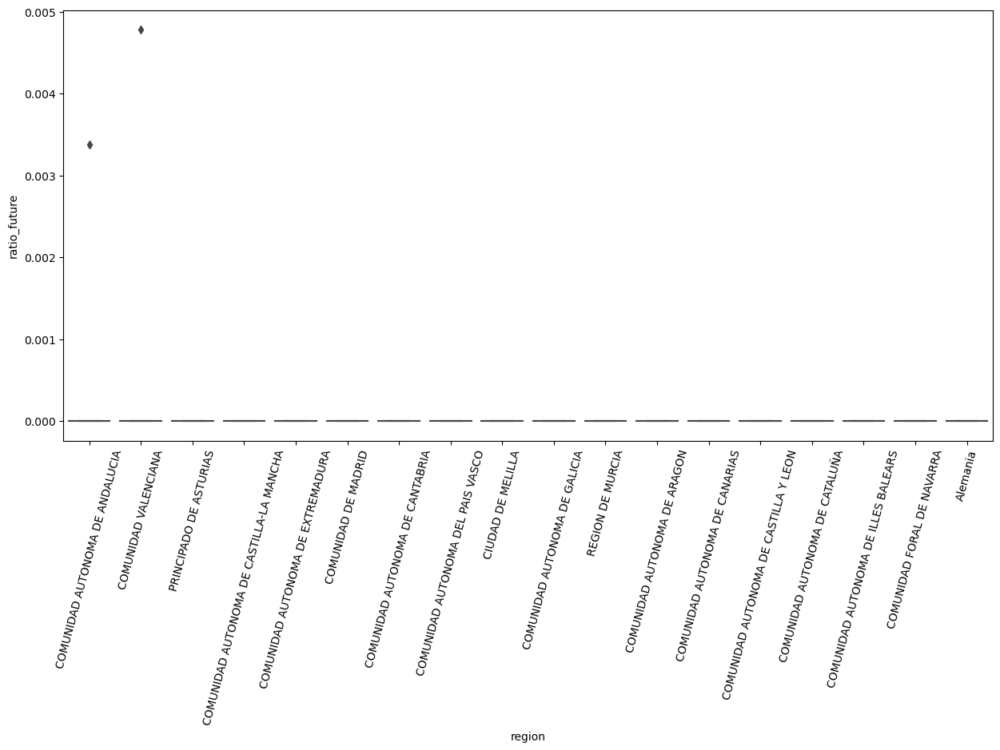

In [31]:
# remove outliers
data = df_syntactic_ratios.copy()
#data = remove_outliers(data,column='num_future',value=4)
# boxplot
box_plot('ratio_future',data)
# statistics
statistics('ratio_future',data)

### 11. Ratio of conjunctions

In [188]:
# Mann-Whitney U test
data = df_syntactic_ratios.copy()
res = mann_whitney(data,'ratio_conj')
print(res)

MannwhitneyuResult(statistic=1337303.0, pvalue=0.6946395494500892)


In [189]:
# Kruskal-Wallis test
kruskal_posthoc(df_syntactic_ratios,'ratio_conj')


AGE: KruskalResult(statistic=55.053195666543175, pvalue=3.1666526988255054e-11)
AGE:               18-24     25-34     35-44         45-54           +55
18-24  1.000000e+00  0.667888  0.000423  3.271601e-08  6.890650e-11
25-34  6.678882e-01  1.000000  0.178560  8.961449e-02  4.287625e-02
35-44  4.230375e-04  0.178560  1.000000  2.088675e-01  1.116339e-02
45-54  3.271601e-08  0.089614  0.208868  1.000000e+00  4.980314e-02
+55    6.890650e-11  0.042876  0.011163  4.980314e-02  1.000000e+00
REGION: KruskalResult(statistic=98.58829801239612, pvalue=1.6237142771617826e-13)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADUR

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.02469919362609386
The f of Cohen for age is: 0.002182395413866065
The f of Cohen normalized for age is: 0.21160196128395664
The f of Cohen for demography is: 0.0026563858331615457
The f of Cohen normalized for demography is: 0.1278369158155554


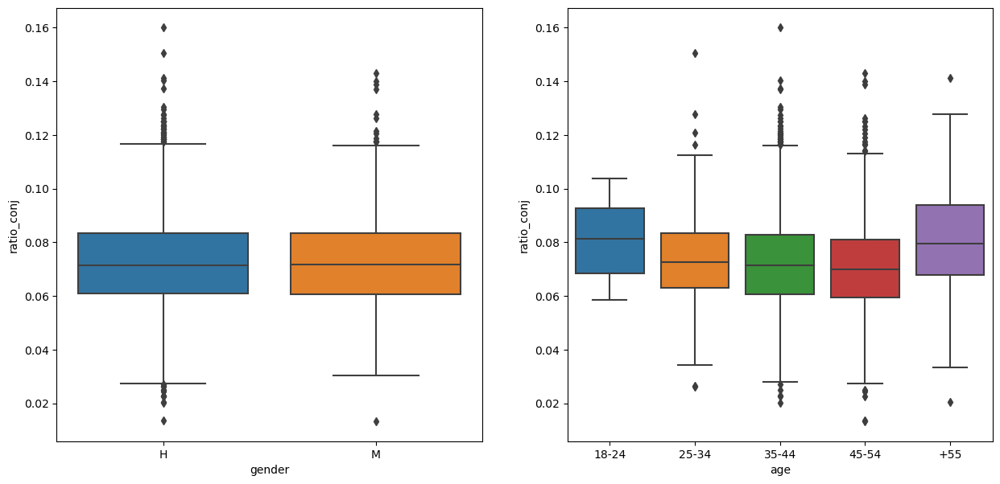

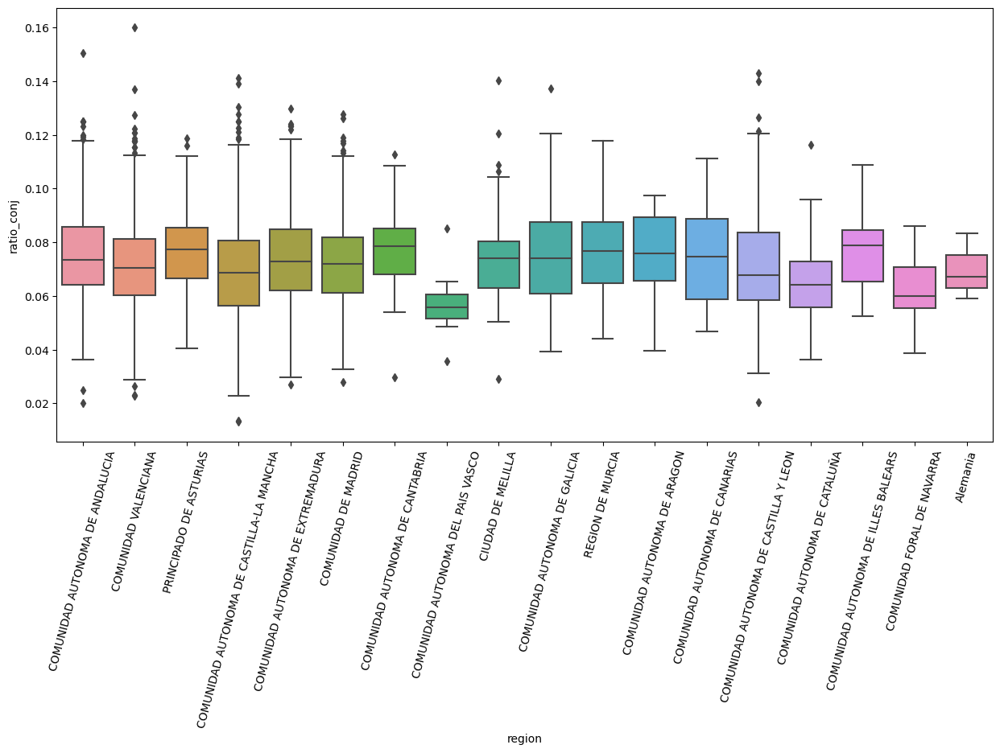

In [32]:
# remove outliers
data = df_syntactic_ratios.copy()
#data = remove_outliers(data,column='num_conj',value=22)
# boxplot
box_plot('ratio_conj',data)
# statistics
statistics('ratio_conj',data)

## WORD FEATURES ANALYSIS: 

1. Count of words
2. Count of positive words
3. Count of negative words
4. Unique words count
5. Count of words that occur twice
6. Average word length
7. Maximum length of a word
8. Count of words with numbers
9. Count of words with length greater than 6
10. Count of words with length smaller than 3
11. Count of stop words
12. Number of locations
13. Number of mentions to people
14. Number of telefones

#### Steps:

- Create boxplots to visualize independence between studied features and the users personal traits (gender, age and demography)
- Statistical measures: d of Cohen for traits with only 2 options, f of Cohen for traits with more than 2 possibilities.
The d of Cohen can be either positive or negative. Two variables are considered independant when the absolute value of d is 0 or very close to 0, and as the absolute value of d gets bigger, the relationship between the variables becomes stronger. Normaly, when the value is below 0.2 the dependency between the variables is considered small, when it is around 0.5 it's considered moderate, and the dependency is big when the value is greater than 0.8. These measures apply as well for the f of Cohen normilized. This measure is calculated dividing the f of Cohen between the difference of the max and min values of the groups of each of the studied features.

### SENTIMENT ANALYSIS FOR COUNT OF POSITIVE AND NEGATIVE WORDS: 

We are going to use a file from the NRC Association http://saifmohammad.com which indicates if a word is positive or negative, and the corresponding emotions associated to it. The emotions are anger, anticipation, disgust, fear, joy, sadness, surprise and trust. If the word isn't classified as positive or negative, we will classify it based on the emotion: if anger, disgust, fear or sadness we'll classify it as negative; if joy or trust we'll classify it as positive.

In [190]:
sent_analysis_data = pd.read_csv('../Spanish-NRC-EmoLex.txt',sep='\t')
sent_analysis_data.head()

,English Word,anger,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust,Spanish Word
0,aback,0,0,0,0,0,0,0,0,0,0,detrás
1,abacus,0,0,0,0,0,0,0,0,0,1,ábaco
2,abandon,0,0,0,1,0,1,0,1,0,0,abandonar
3,abandoned,1,0,0,1,0,1,0,1,0,0,abandonado
4,abandonment,1,0,0,1,0,1,0,1,1,0,abandono


In [191]:
def sent_analysis(word):
    columns = sent_analysis_data.keys()
    negative = ['negative','fear','anger','disgust','sadness']
    positive = ['positive','joy','trust']

    row = sent_analysis_data.loc[sent_analysis_data['Spanish Word'] == word]
    cols = np.where(row == 1)
    attributes = [columns[i] for i in cols]

    intersection_neg = list(set(negative) & set(attributes[0]))
    intersection_pos = list(set(positive) & set(attributes[0]))

    if len(intersection_neg) != 0:
        if len(intersection_pos) != 0:
            return 'Both'
        else:
            return 'Negative'
    elif len(intersection_pos) != 0:
        return 'Positive'

    return None

In [192]:
# returns a list of words that occur exactly 'num' times or None if no coincidence
def num_occurences(lista,num):
    aux_dict = {}
    for item in lista:
        if item in aux_dict.keys():
            aux_dict[item] += 1
        else:
            aux_dict[item] = 1

    try:
        idx = list(aux_dict.values()).index(num)
        words = list(aux_dict.keys())[idx]
        return len(words)
    except:
        return 0

In [193]:
# load data for character based features analysis
def df_word_based():

    data = pd.DataFrame() 

    # load spanish stop words
    stop_words_df = pd.read_csv('../spanish-stop-words.txt',header=None)
    stop_words = list(stop_words_df[0])

    num_words = []
    num_pos_words = []
    num_neg_words = []
    num_unique = []
    num_twice = []
    av_length = []
    max_length = []
    num_numbers = []
    num_greater = []
    num_smaller = []
    num_stop = []
    num_locations = []
    num_telefono = []
    num_fechas = []
    num_personas = []
    list_genero = []
    list_edad = []
    list_region = []

    for file in files:
        with open(f'Atestados/{file}') as f:
            _dict = json.load(f)
            # policia
            policia = _dict['cp']
            provincia = policia['provincia'].title()
            genero = policia['sexo']
            fn = policia['fn']
            region = get_region(provincia)
            edad = get_edad(fn)

            list_genero.append(genero)
            list_edad.append(edad)
            list_region.append(region)

            # denuncia
            text = _dict['denuncia']

            # before cleaning, count num of tags
            tags = re.findall('LOC|NUM|TIEM|PER',text)
            counter = Counter(tags)
            for k in ['LOC','NUM','TIEM','PER']:
                if k not in counter.keys():
                    counter[k] = 0
                    
            for k,v in counter.items():
                if k == 'LOC':
                    num_locations.append(v)
                elif k == 'NUM':
                    num_telefono.append(v)
                elif k == 'TIEM':
                    num_fechas.append(v)
                elif k == 'PER':
                    num_personas.append(v)

            # remove punctuation
            # clean text
            text = quitar_tags(text)
            cleaned_text = clean_text(text,file)
            cleaned_text = cleaned_text.translate(str.maketrans('','',string.punctuation))
            sentences = cleaned_text.split('\n')
            words = []
            for sentence in sentences:
                words += sentence.split(' ')
            words = [w for w in words if len(w) != 0]
            words_lower = [w.lower() for w in words if len(w) != 0]

            num_words.append(len(words))

            # sentiment analysis
            pos = 0
            neg = 0
            for word in words:
                sentiment = sent_analysis(word)
                if sentiment == 'Both':
                    neg += 1
                    pos += 1
                elif sentiment == 'Positive':
                    pos += 1
                elif sentiment == 'Negative':
                    neg += 1

            num_pos_words.append(pos)
            num_neg_words.append(neg)

            # unique words
            num_unique.append(num_occurences(words,1))
            # twice occurrences
            num_twice.append(num_occurences(words,2))
            
            # max, av, >6, <3 length and num words with digits, count english words
            max_len = 0
            sum_length = 0
            digits = 0
            len_greater = 0
            len_smaller = 0
            for word in words:
                sum_length += len(word)
                if len(word) > max_len:
                    max_len = len(word)

                if len(re.findall('\d',word)) > 0:
                    digits += 1

                if len(word) > 6:
                    len_greater += 1
                elif len(word) < 3:
                    len_smaller += 1
            
            av_length.append(sum_length/len(words))
            max_length.append(max_len)
            num_numbers.append(digits)
            num_greater.append(len_greater)
            num_smaller.append(len_smaller)


            # count stop-words 
            intersection_stop = list(set(stop_words) & set(words_lower))
            num_stop.append(len(intersection_stop))


    data['gender'] = list_genero
    data['age'] = list_edad
    data['region'] = list_region
    data['num_locations'] = num_locations
    data['num_fechas'] = num_fechas
    data['num_personas'] = num_personas
    data['num_telefono'] = num_telefono
    data['num_words'] = num_words
    data['num_pos_words'] = num_pos_words
    data['num_neg_words'] = num_neg_words
    data['num_unique'] = num_unique
    data['num_twice'] = num_twice
    data['av_length'] = av_length
    data['max_length'] = max_length
    data['num_numbers'] = num_numbers
    data['num_greater'] = num_greater
    data['num_smaller'] = num_smaller
    data['num_stop'] = num_stop

    return data         

In [194]:
df_word = df_word_based()
df_word.head()

,gender,age,region,num_locations,num_fechas,num_personas,num_telefono,num_words,num_pos_words,num_neg_words,num_unique,num_twice,av_length,max_length,num_numbers,num_greater,num_smaller,num_stop
0,H,35-44,COMUNIDAD AUTONOMA DE ANDALUCIA,1,2,0,0,40,0,1,2,3,5.475000,15,2,16,10,13
1,H,35-44,COMUNIDAD VALENCIANA,2,6,0,0,155,0,8,8,3,4.612903,15,0,47,56,38
2,H,35-44,COMUNIDAD AUTONOMA DE ANDALUCIA,1,4,0,0,116,0,1,8,3,4.732759,15,2,30,32,38
3,H,25-34,COMUNIDAD VALENCIANA,4,2,3,4,304,0,3,8,3,5.013158,15,20,94,96,32
4,H,35-44,PRINCIPADO DE ASTURIAS,4,3,0,0,697,0,24,12,9,4.658537,15,19,196,234,70


## Normality test: 
Kolmogorov-Smirnoff test, if p-value > 0.05 then it is normally distributed

In [55]:
for c in df_word.columns:
    if c not in df_policia.columns:
        res = kstest(df_word[c], 'norm')
        print(f'{c}: {res}')

num_locations: KstestResult(statistic=0.8372400770074859, pvalue=0.0, statistic_location=1, statistic_sign=-1)
num_fechas: KstestResult(statistic=0.9143971230543863, pvalue=0.0, statistic_location=2, statistic_sign=-1)
num_personas: KstestResult(statistic=0.5, pvalue=0.0, statistic_location=0, statistic_sign=-1)
num_telefono: KstestResult(statistic=0.5, pvalue=0.0, statistic_location=0, statistic_sign=-1)
num_words: KstestResult(statistic=1.0, pvalue=0.0, statistic_location=12, statistic_sign=-1)
num_pos_words: KstestResult(statistic=0.5, pvalue=0.0, statistic_location=0, statistic_sign=-1)
num_neg_words: KstestResult(statistic=0.8818163123822467, pvalue=0.0, statistic_location=2, statistic_sign=-1)
num_unique: KstestResult(statistic=0.9912103892952042, pvalue=0.0, statistic_location=3, statistic_sign=-1)
num_twice: KstestResult(statistic=0.909522828544381, pvalue=0.0, statistic_location=2, statistic_sign=-1)
av_length: KstestResult(statistic=0.9999610841491681, pvalue=0.0, statistic_l

### 1. Number of words

In [195]:
# Mann-Whitney U test
data = df_word.copy()
res = mann_whitney(data,'num_words')
print(res)

MannwhitneyuResult(statistic=1466446.5, pvalue=1.647712048189651e-06)


In [196]:
# Kruskal-Wallis test
kruskal_posthoc(df_word,'num_words')


AGE: KruskalResult(statistic=104.59008045208499, pvalue=1.0357129185130943e-21)
AGE:               18-24     25-34         35-44         45-54           +55
18-24  1.000000e+00  0.012385  1.357746e-11  6.413480e-23  1.172596e-15
25-34  1.238523e-02  1.000000  1.000000e+00  1.000000e+00  1.000000e+00
35-44  1.357746e-11  1.000000  1.000000e+00  6.640688e-02  1.000000e+00
45-54  6.413480e-23  1.000000  6.640688e-02  1.000000e+00  6.640688e-02
+55    1.172596e-15  1.000000  1.000000e+00  6.640688e-02  1.000000e+00
REGION: KruskalResult(statistic=225.5247619053285, pvalue=2.0024462460485133e-38)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDA

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.1158329790221756
The f of Cohen for age is: 11.395334373175793
The f of Cohen normalized for age is: 0.21654247532602977
The f of Cohen for demography is: 15.23170499800709
The f of Cohen normalized for demography is: 0.12693087498339242


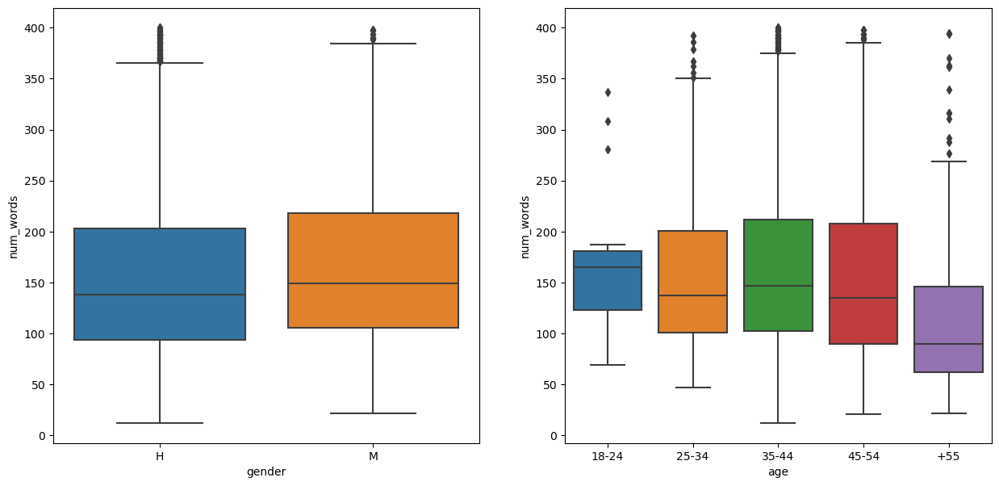

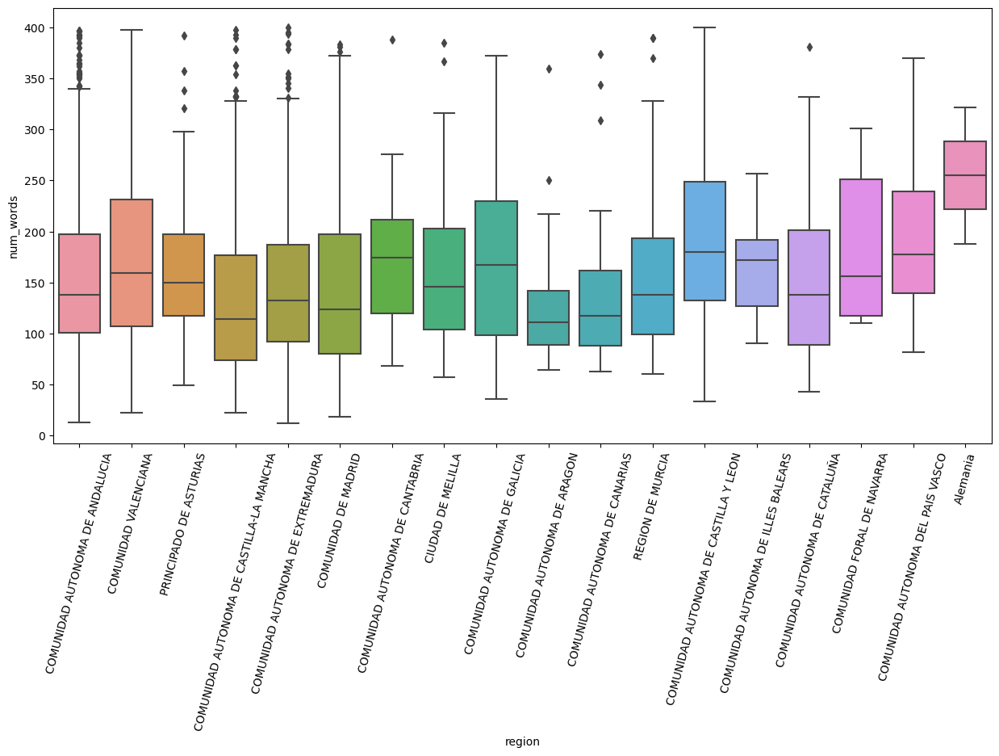

In [74]:
# remove outliers
data = df_word.copy()
data = remove_outliers(data,column='num_words',value=400)
# boxplot
box_plot('num_words',data)
# statistics
statistics('num_words',data)

### 2. Number of positive words

In [197]:
# Mann-Whitney U test
data = df_word.copy()
res = mann_whitney(data,'num_pos_words')
print(res)

MannwhitneyuResult(statistic=1334621.0, pvalue=0.09211883970250703)


In [198]:
# Kruskal-Wallis test
kruskal_posthoc(df_word,'num_pos_words')


AGE: KruskalResult(statistic=9.221349568156414, pvalue=0.055798751220286054)
AGE:           18-24     25-34     35-44     45-54       +55
18-24  1.000000  0.289465  1.000000  0.485621  0.692609
25-34  0.289465  1.000000  0.294618  0.485621  0.478685
35-44  1.000000  0.294618  1.000000  0.462489  0.692609
45-54  0.485621  0.485621  0.462489  1.000000  1.000000
+55    0.692609  0.478685  0.692609  1.000000  1.000000
REGION: KruskalResult(statistic=25.577636926174403, pvalue=0.08250702670839757)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRID             

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.05822470245163264
The f of Cohen for age is: 0.005329949357744662
The f of Cohen normalized for age is: 0.09593908843940392
The f of Cohen for demography is: 0.008277905140435594
The f of Cohen normalized for demography is: 0.12416857710653391


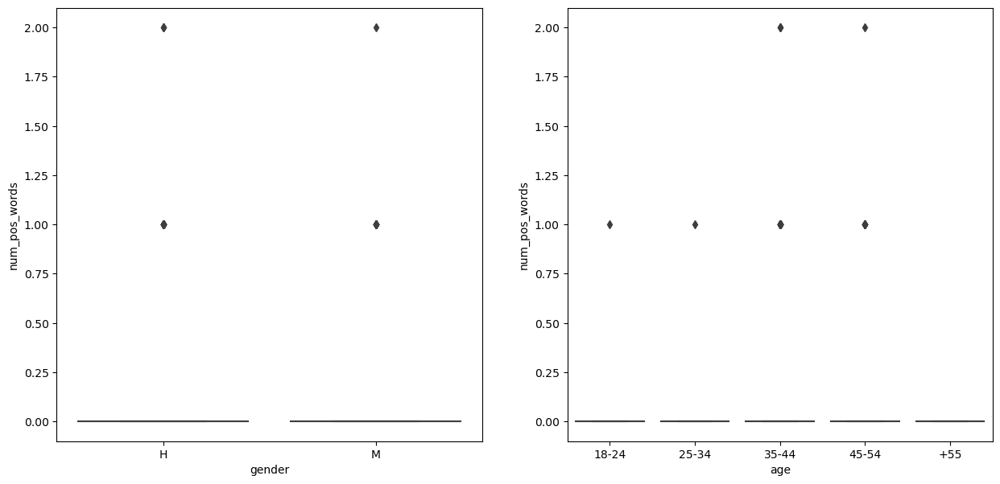

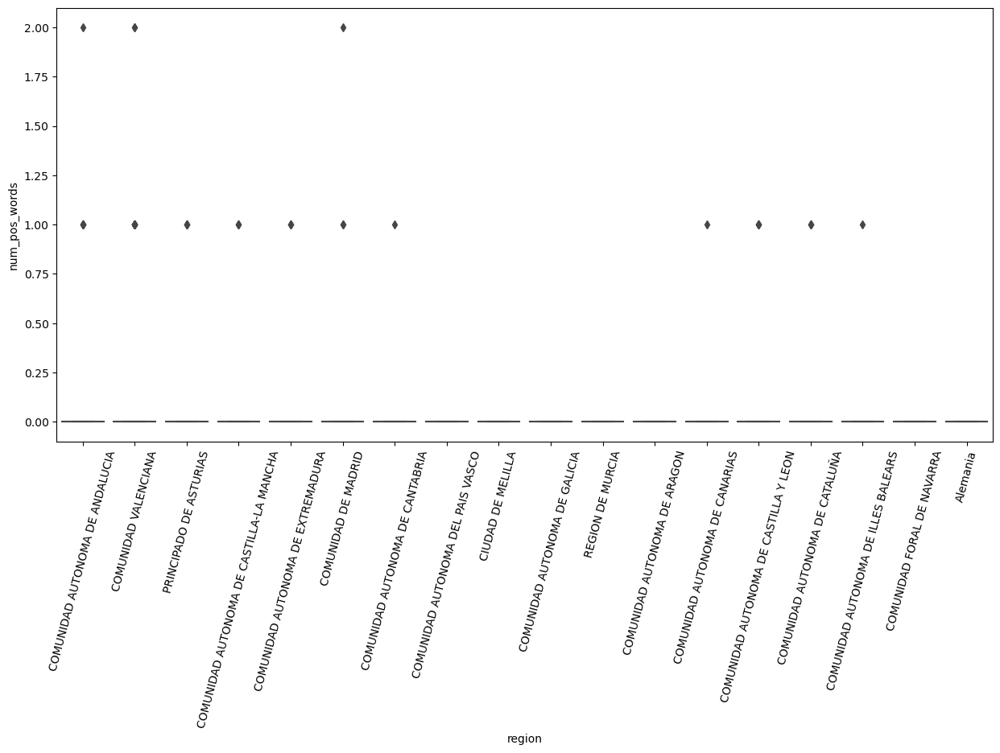

In [75]:
# remove outliers
data = df_word.copy()
#data = remove_outliers(data,column='num_pos_words',value=150)
# boxplot
box_plot('num_pos_words',data)
# statistics
statistics('num_pos_words',data)

### 3. Number of negative words

In [199]:
# Mann-Whitney U test
data = df_word.copy()
res = mann_whitney(data,'num_neg_words')
print(res)

MannwhitneyuResult(statistic=1430366.5, pvalue=0.0003468996173730325)


In [200]:
# Kruskal-Wallis test
kruskal_posthoc(df_word,'num_neg_words')


AGE: KruskalResult(statistic=87.05333100451386, pvalue=5.561981369014594e-18)
AGE:               18-24     25-34         35-44         45-54           +55
18-24  1.000000e+00  0.051133  4.165314e-08  6.852277e-18  6.684640e-10
25-34  5.113342e-02  1.000000  1.000000e+00  1.000000e+00  1.000000e+00
35-44  4.165314e-08  1.000000  1.000000e+00  2.758818e-02  1.000000e+00
45-54  6.852277e-18  1.000000  2.758818e-02  1.000000e+00  1.070626e-03
+55    6.684640e-10  1.000000  1.000000e+00  1.070626e-03  1.000000e+00
REGION: KruskalResult(statistic=277.8979804944975, pvalue=4.011938683944442e-49)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                  1.000000   
COMUNIDAD VALENCIANA                                             1.000000   
PRINCIPADO DE ASTURIAS                                           1.000000   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                         1.000000   
COMUNIDAD A

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.06470369461060035
The f of Cohen for age is: 0.4664150222457344
The f of Cohen normalized for age is: 0.22272769335178005
The f of Cohen for demography is: 0.7865975959542798
The f of Cohen normalized for demography is: 0.16268502968359175


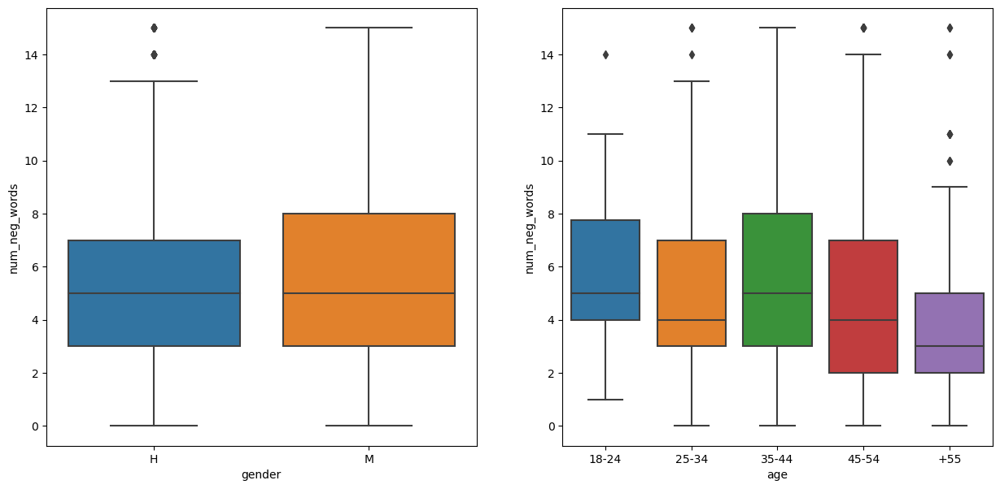

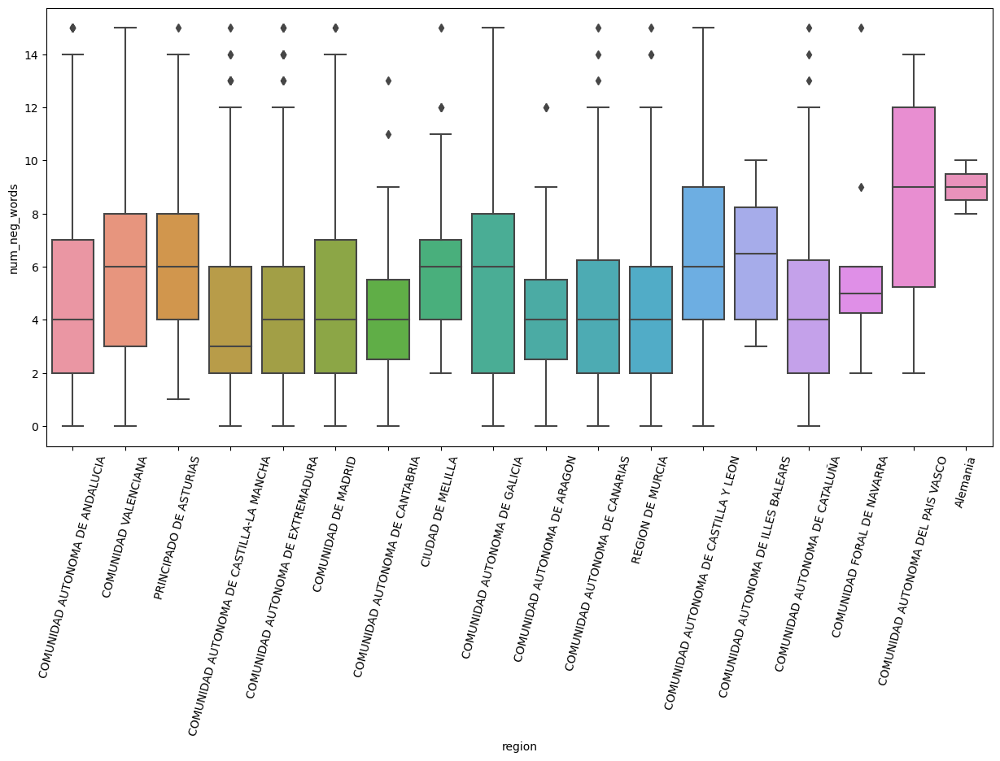

In [78]:
data = df_word.copy()
# remove outliers
data = remove_outliers(data,column='num_neg_words',value=15)
# boxplot
box_plot('num_neg_words',data)
# statistics
statistics('num_neg_words',data)

### 4. Unique words count

In [201]:
# Mann-Whitney U test
data = df_word.copy()
res = mann_whitney(data,'num_unique')
print(res)

MannwhitneyuResult(statistic=1324874.0, pvalue=0.9595290793278919)


In [202]:
# Kruskal-Wallis test
kruskal_posthoc(df_word,'num_unique')


AGE: KruskalResult(statistic=7.492443600218726, pvalue=0.11204296008182496)
AGE:        18-24  25-34  35-44     45-54       +55
18-24    1.0    1.0    1.0  1.000000  1.000000
25-34    1.0    1.0    1.0  1.000000  1.000000
35-44    1.0    1.0    1.0  1.000000  1.000000
45-54    1.0    1.0    1.0  1.000000  0.072636
+55      1.0    1.0    1.0  0.072636  1.000000
REGION: KruskalResult(statistic=75.65876860645982, pvalue=2.2393745150143084e-09)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRID                                                   1.0   
COMUNIDA

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.02168765787973095
The f of Cohen for age is: 0.06882826556049601
The f of Cohen normalized for age is: 0.20784324929123466
The f of Cohen for demography is: 0.20418614860823067
The f of Cohen normalized for demography is: 0.17015512384019207


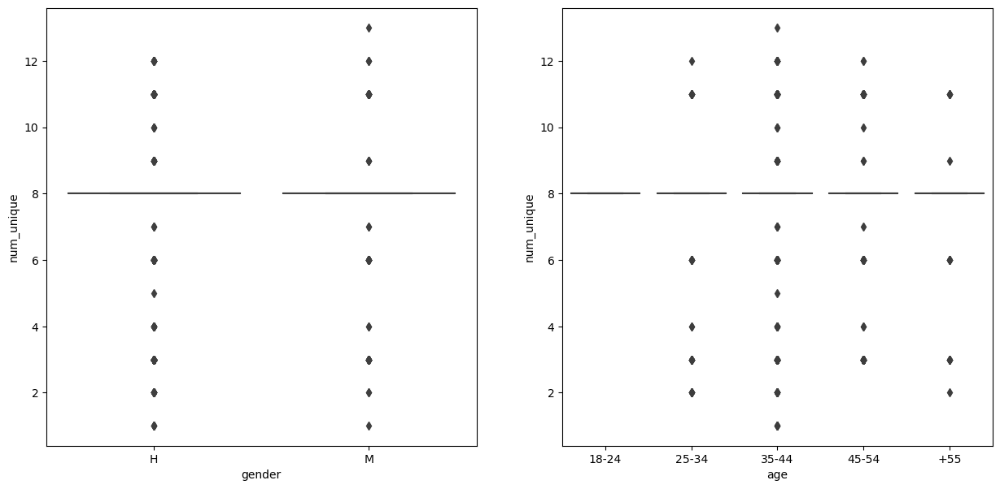

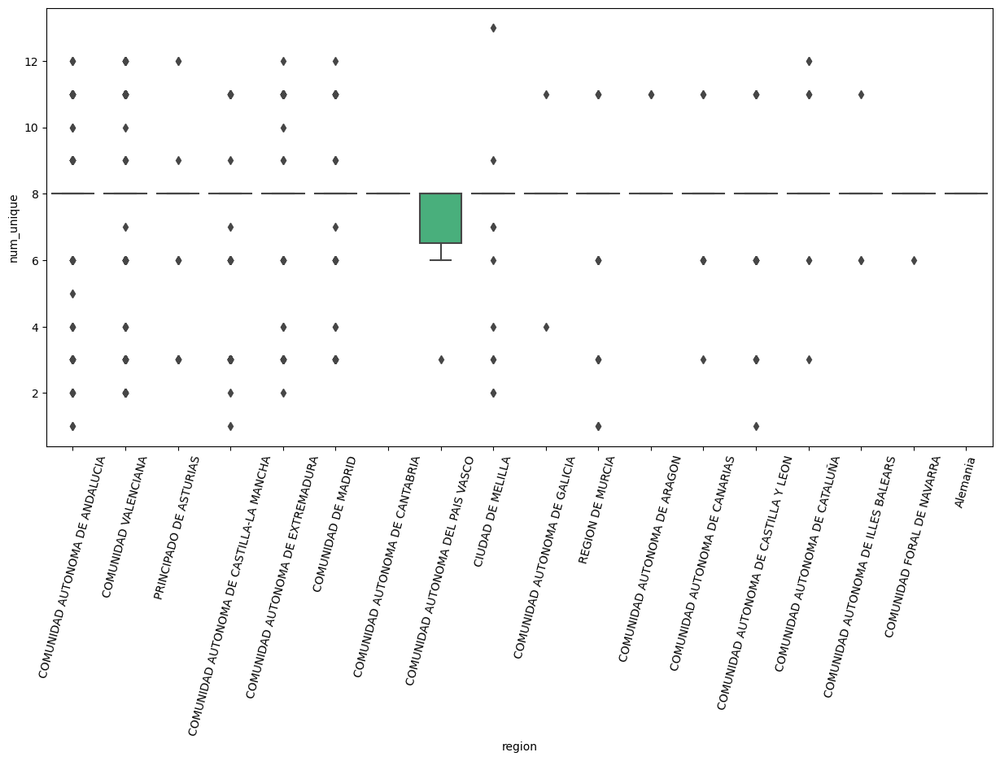

In [79]:
data = df_word.copy()
# remove outliers
#data = remove_outliers(data,column='num_unique',value=12)
# boxplot
box_plot('num_unique',data)
# statistics
statistics('num_unique',data)

### 5. Number of words that occur twice

In [203]:
# Mann-Whitney U test
data = df_word.copy()
res = mann_whitney(data,'num_twice')
print(res)

MannwhitneyuResult(statistic=1317756.0, pvalue=0.7740807010749945)


In [204]:
# Kruskal-Wallis test
kruskal_posthoc(df_word,'num_twice')


AGE: KruskalResult(statistic=30.40934448008583, pvalue=4.03956869841818e-06)
AGE:           18-24  25-34     35-44     45-54       +55
18-24  1.000000    1.0  0.051789  0.000022  0.026212
25-34  1.000000    1.0  1.000000  1.000000  1.000000
35-44  0.051789    1.0  1.000000  0.161121  1.000000
45-54  0.000022    1.0  0.161121  1.000000  0.018218
+55    0.026212    1.0  1.000000  0.018218  1.000000
REGION: KruskalResult(statistic=57.89019999610626, pvalue=2.332766237067916e-06)


/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRID                                                   1.0   
COMUNIDAD AUTONOMA DE CANTABRIA                                       1.0   
COMUNIDAD AUTONOMA DEL PAIS VASCO                                     1.0   
CIUDAD DE MELILLA                                                     1.0   
COMUNIDAD AUTONOMA DE GALICIA                                         1.0   
REGION DE MURCIA                                                      1.0   
COMUNIDAD AUTONOMA DE ARAGON                                        

The d of Cohen for gender is: -0.04507313163003628
The f of Cohen for age is: 0.22077559977276356
The f of Cohen normalized for age is: 0.2604092695145526
The f of Cohen for demography is: 0.34415042631472015
The f of Cohen normalized for demography is: 0.07941932914955081


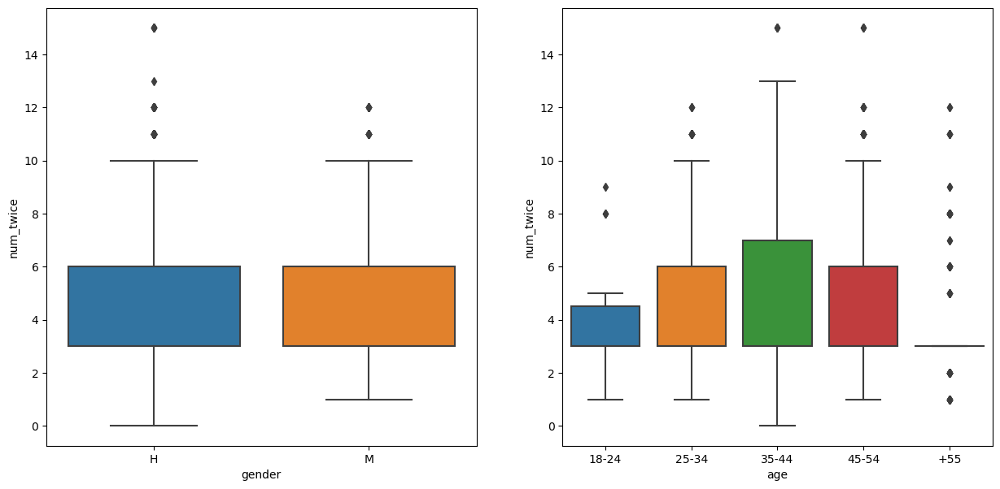

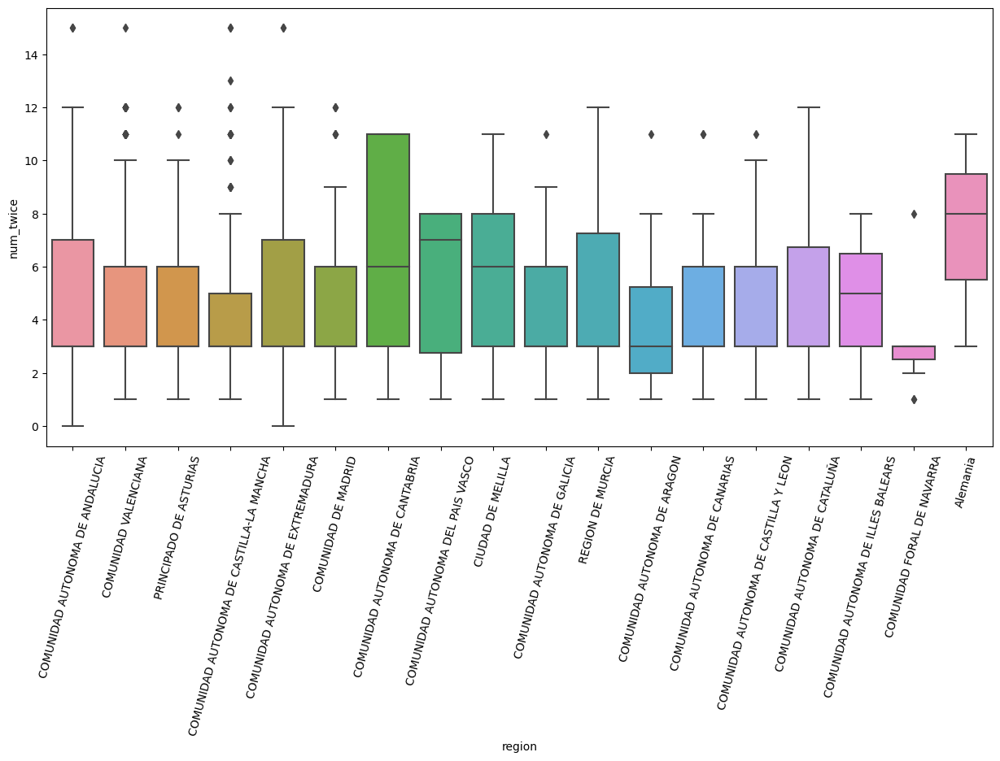

In [81]:
data = df_word.copy()
# remove outliers
#data = remove_outliers(data,column='num_twice',value=12)
# boxplot
box_plot('num_twice',data)
# statistics
statistics('num_twice',data)

### 6. Average word length

In [205]:
# Mann-Whitney U test
data = df_word.copy()
res = mann_whitney(data,'av_length')
print(res)

MannwhitneyuResult(statistic=1204603.0, pvalue=3.652953185942323e-05)


In [206]:
# Kruskal-Wallis test
kruskal_posthoc(df_word,'av_length')


AGE: KruskalResult(statistic=28.51955065233339, pvalue=9.786026829556086e-06)
AGE:           18-24     25-34     35-44     45-54       +55
18-24  1.000000  0.659803  0.000215  0.000394  0.000003
25-34  0.659803  1.000000  1.000000  1.000000  1.000000
35-44  0.000215  1.000000  1.000000  1.000000  1.000000
45-54  0.000394  1.000000  1.000000  1.000000  0.057195
+55    0.000003  1.000000  1.000000  0.057195  1.000000
REGION: KruskalResult(statistic=95.21310531133928, pvalue=6.801167173127752e-13)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRID           

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: -0.17933292900229922
The f of Cohen for age is: 0.019686111998229144
The f of Cohen normalized for age is: 0.21233887028576942
The f of Cohen for demography is: 0.03776405584238858
The f of Cohen normalized for demography is: 0.12346215227581983


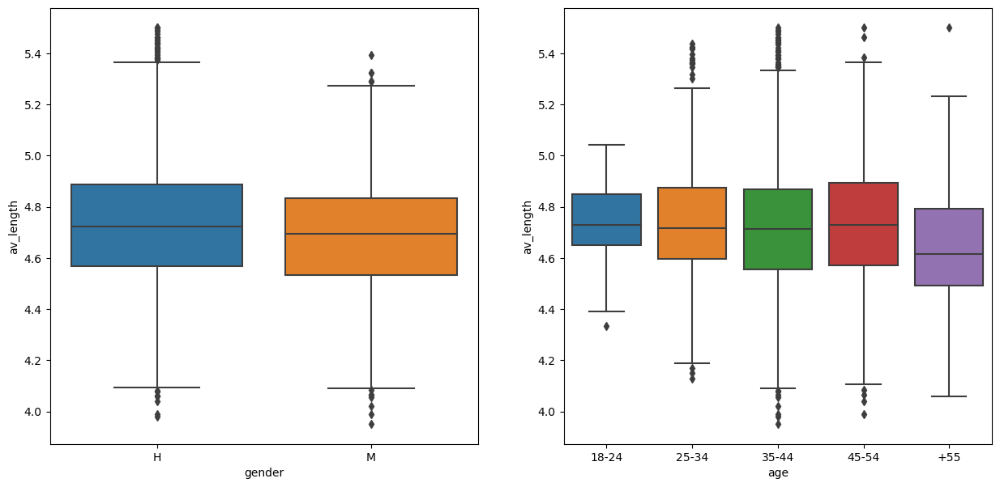

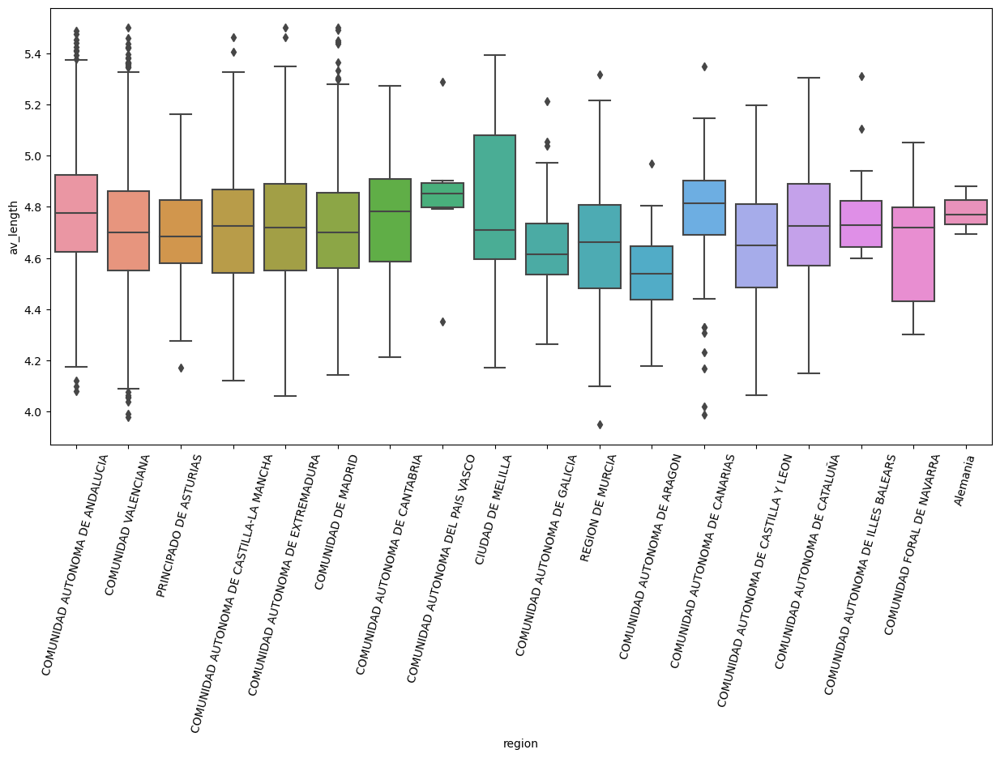

In [83]:
data = df_word.copy()
# remove outliers
data = remove_outliers(data,column='av_length',value=5.5)
# boxplot
box_plot('av_length',data)
# statistics
statistics('av_length',data)

### 7. Max word length

In [207]:
# Mann-Whitney U test
data = df_word.copy()
res = mann_whitney(data,'max_length')
print(res)

MannwhitneyuResult(statistic=1313518.0, pvalue=0.6581657839440411)


In [208]:
# Kruskal-Wallis test
kruskal_posthoc(df_word,'max_length')


AGE: KruskalResult(statistic=27.16738727231598, pvalue=1.8388416937401956e-05)
AGE:           18-24     25-34     35-44     45-54       +55
18-24  1.000000  0.019545  0.000367  0.000019  0.001662
25-34  0.019545  1.000000  0.519201  0.519201  0.363065
35-44  0.000367  0.519201  1.000000  0.963254  0.552729
45-54  0.000019  0.519201  0.963254  1.000000  0.519201
+55    0.001662  0.363065  0.552729  0.519201  1.000000
REGION: KruskalResult(statistic=78.49451829692751, pvalue=7.089459858656894e-10)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRID          

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: -0.034756262866438646
The f of Cohen for age is: 0.14150957621020568
The f of Cohen normalized for age is: 0.10899325510413785
The f of Cohen for demography is: 0.2795052324264882
The f of Cohen normalized for demography is: 0.0512853637479795


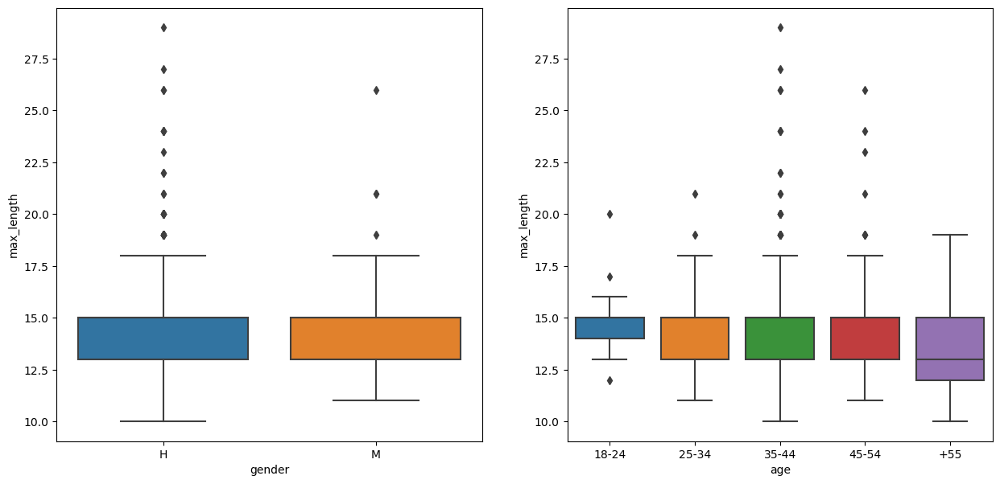

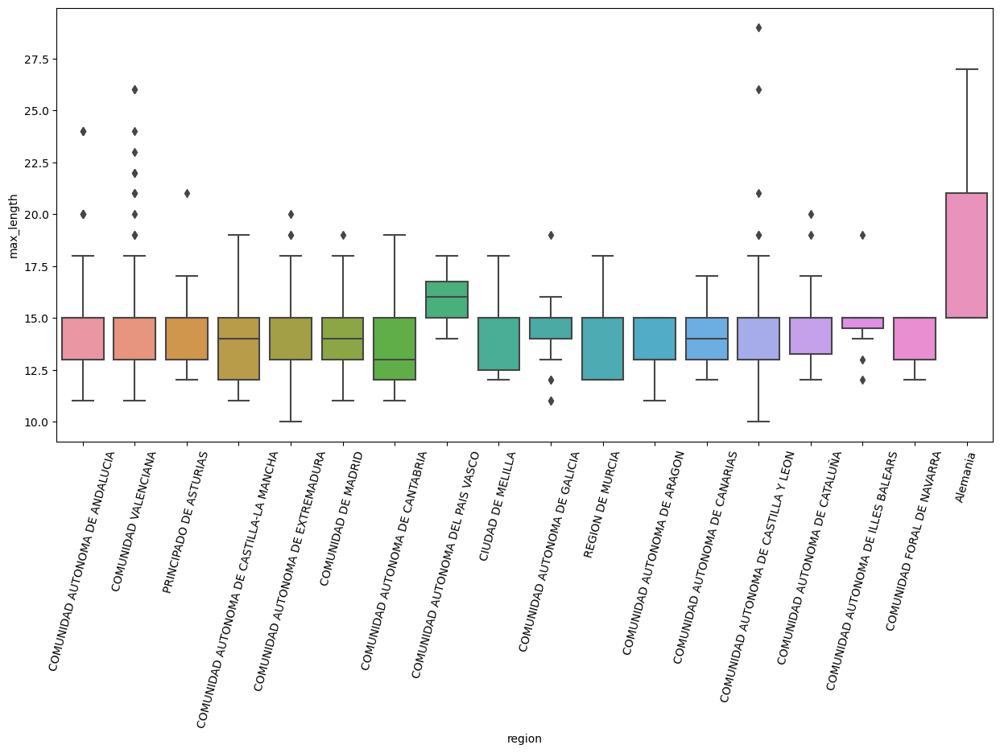

In [87]:
data = df_word.copy()
# remove outliers
#data = remove_outliers(data,column='max_length',value=22)
# boxplot
box_plot('max_length',data)
# statistics
statistics('max_length',data)

### 8. Count of words with numbers

In [209]:
# Mann-Whitney U test
data = df_word.copy()
res = mann_whitney(data,'num_numbers')
print(res)

MannwhitneyuResult(statistic=1417199.5, pvalue=0.0015013352518996473)


In [210]:
# Kruskal-Wallis test
kruskal_posthoc(df_word,'num_numbers')


AGE: KruskalResult(statistic=36.875665023767766, pvalue=1.9107282184290768e-07)
AGE:               18-24     25-34     35-44     45-54           +55
18-24  1.000000e+00  1.000000  0.000045  0.000002  2.540356e-08
25-34  1.000000e+00  1.000000  1.000000  1.000000  8.164369e-01
35-44  4.548378e-05  1.000000  1.000000  1.000000  1.000000e+00
45-54  1.880420e-06  1.000000  1.000000  1.000000  2.423419e-01
+55    2.540356e-08  0.816437  1.000000  0.242342  1.000000e+00
REGION: KruskalResult(statistic=129.39260502194352, pvalue=2.4530628218175072e-19)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                  1.000000   
COMUNIDAD VALENCIANA                                             0.574953   
PRINCIPADO DE ASTURIAS                                           0.450911   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                         0.720174   
COMUNIDAD AUTONOMA DE EXTREMADURA                      

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.040930055523483985
The f of Cohen for age is: 0.13938181239268907
The f of Cohen normalized for age is: 0.21563753111631534
The f of Cohen for demography is: 0.35789749776459756
The f of Cohen normalized for demography is: 0.07453520599765406


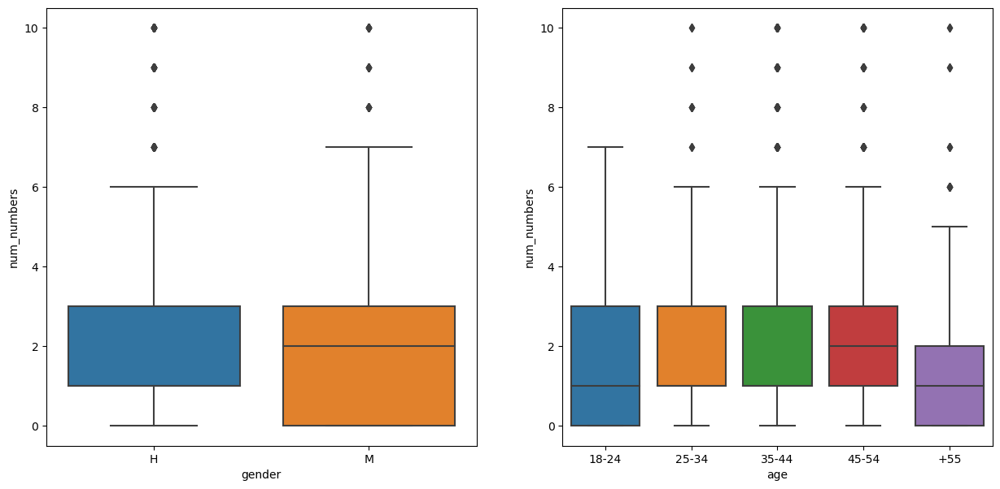

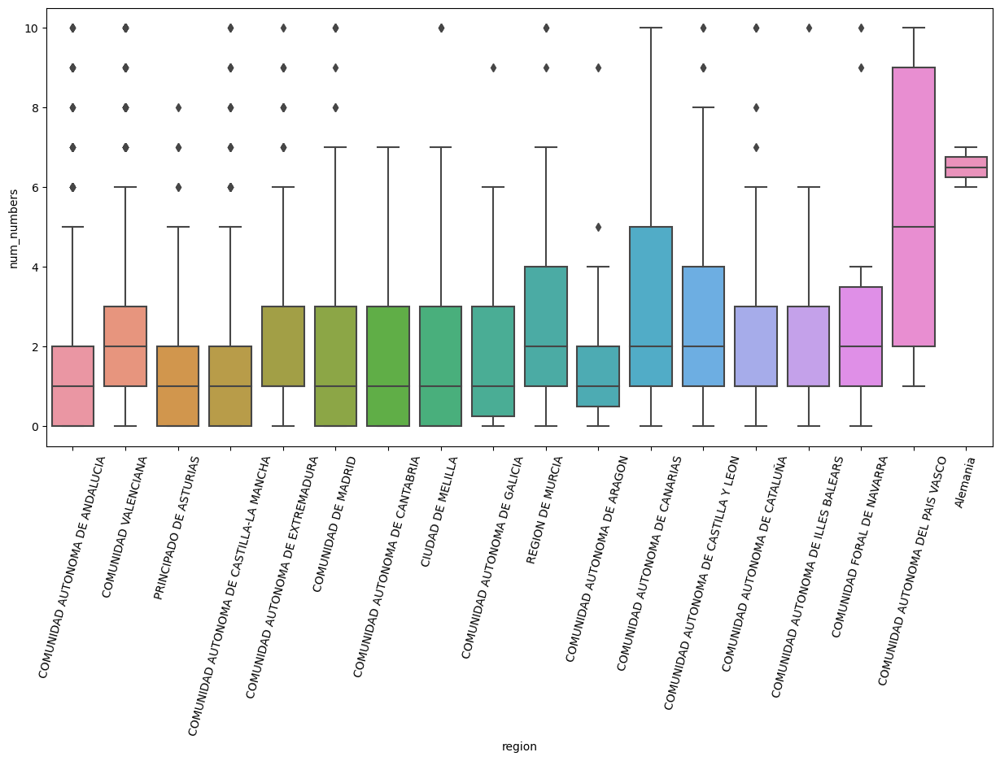

In [89]:
data = df_word.copy()
# remove outliers
data = remove_outliers(data,column='num_numbers',value=10)
# boxplot
box_plot('num_numbers',data)
# statistics
statistics('num_numbers',data)

### 9. Count of words with length greater than 6

In [211]:
# Mann-Whitney U test
data = df_word.copy()
res = mann_whitney(data,'num_greater')
print(res)

MannwhitneyuResult(statistic=1450578.5, pvalue=2.116732468959095e-05)


In [212]:
# Kruskal-Wallis test
kruskal_posthoc(df_word,'num_greater')


AGE: KruskalResult(statistic=117.84845683231393, pvalue=1.5386335542615933e-24)
AGE:               18-24     25-34         35-44         45-54           +55
18-24  1.000000e+00  0.005845  1.750619e-14  3.451329e-26  6.106979e-19
25-34  5.845340e-03  1.000000  1.000000e+00  1.000000e+00  1.000000e+00
35-44  1.750619e-14  1.000000  1.000000e+00  1.782235e-01  1.000000e+00
45-54  3.451329e-26  1.000000  1.782235e-01  1.000000e+00  1.782235e-01
+55    6.106979e-19  1.000000  1.000000e+00  1.782235e-01  1.000000e+00
REGION: KruskalResult(statistic=220.77834949163972, pvalue=1.8348499655546668e-37)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                  1.000000   
COMUNIDAD VALENCIANA                                             1.000000   
PRINCIPADO DE ASTURIAS                                           1.000000   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                         1.000000   
COMUNID

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.0728230764777037
The f of Cohen for age is: 3.39994738452389
The f of Cohen normalized for age is: 0.22677743858468602
The f of Cohen for demography is: 4.308479833679251
The f of Cohen normalized for demography is: 0.09891917985488076


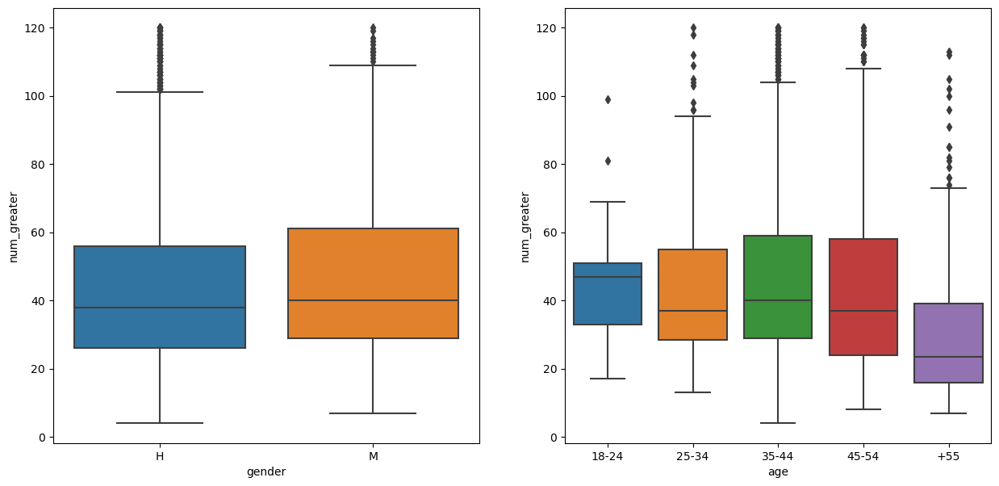

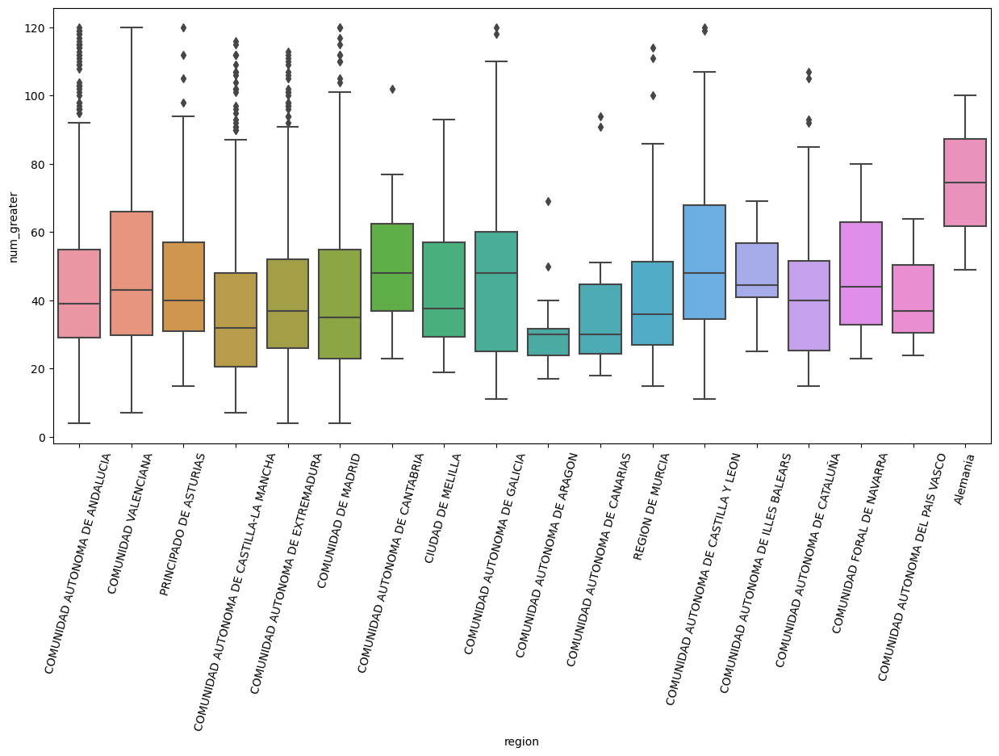

In [93]:
data = df_word.copy()
# remove outliers
data = remove_outliers(data,column='num_greater',value=120)
# boxplot
box_plot('num_greater',data)
# statistics
statistics('num_greater',data)

### 10. Count of words with length smaller than 3

In [213]:
# Mann-Whitney U test
data = df_word.copy()
res = mann_whitney(data,'num_smaller')
print(res)

MannwhitneyuResult(statistic=1475994.5, pvalue=3.087209621593092e-07)


In [214]:
# Kruskal-Wallis test
kruskal_posthoc(df_word,'num_smaller')


AGE: KruskalResult(statistic=92.76279877309331, pvalue=3.4073917435066802e-19)
AGE:               18-24     25-34         35-44         45-54           +55
18-24  1.000000e+00  0.008076  3.337751e-10  3.327361e-20  2.119406e-13
25-34  8.075604e-03  1.000000  1.000000e+00  1.000000e+00  1.000000e+00
35-44  3.337751e-10  1.000000  1.000000e+00  8.090015e-02  1.000000e+00
45-54  3.327361e-20  1.000000  8.090015e-02  1.000000e+00  5.114430e-02
+55    2.119406e-13  1.000000  1.000000e+00  5.114430e-02  1.000000e+00
REGION: KruskalResult(statistic=237.25842645206586, pvalue=8.266758742142473e-41)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.12244313273774692
The f of Cohen for age is: 3.6701072467254203
The f of Cohen normalized for age is: 0.23531347463743846
The f of Cohen for demography is: 5.641665076241709
The f of Cohen normalized for demography is: 0.11538389284025023


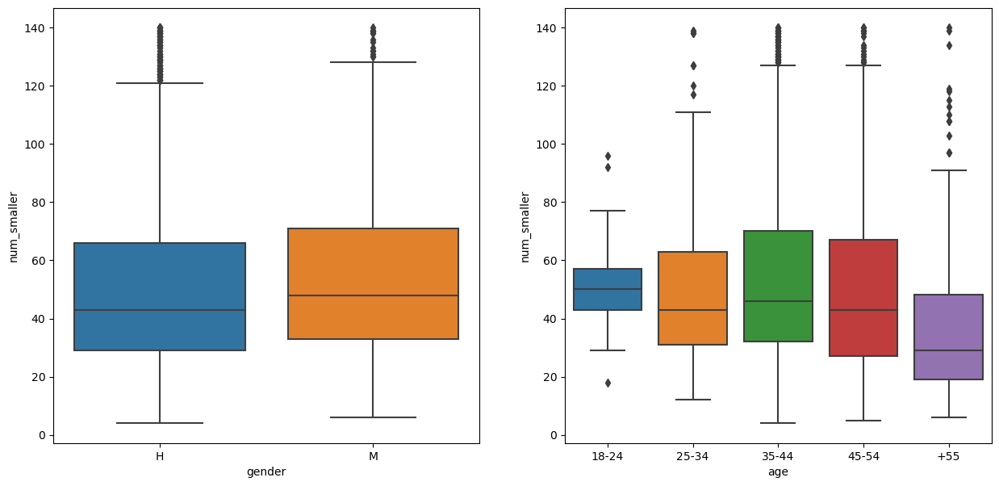

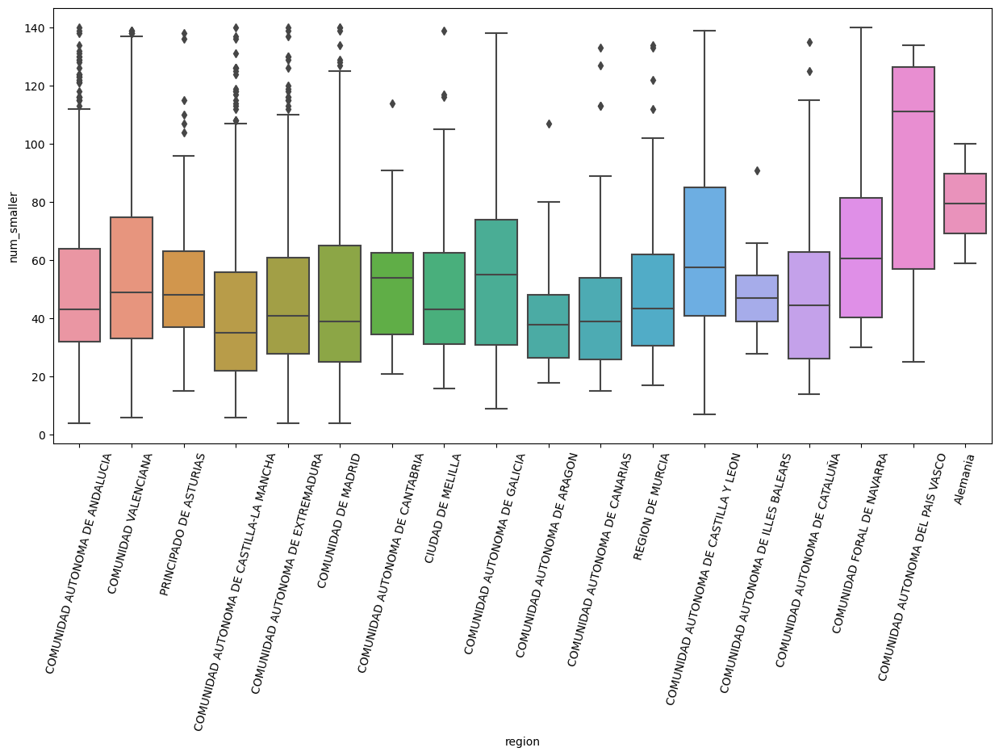

In [96]:
data = df_word.copy()
# remove outliers
data = remove_outliers(data,column='num_smaller',value=140)
# boxplot
box_plot('num_smaller',data)
# statistics
statistics('num_smaller',data)

### 11. Count of stop words

In [215]:
# Mann-Whitney U test
data = df_word.copy()
res = mann_whitney(data,'num_stop')
print(res)

MannwhitneyuResult(statistic=1482779.5, pvalue=8.779759957653626e-08)


In [216]:
# Kruskal-Wallis test
kruskal_posthoc(df_word,'num_stop')


AGE: KruskalResult(statistic=84.1053072242806, pvalue=2.348359121193828e-17)
AGE:               18-24     25-34         35-44         45-54           +55
18-24  1.000000e+00  0.007638  7.604629e-07  3.715905e-17  1.722605e-10
25-34  7.637875e-03  1.000000  6.646677e-01  7.705214e-01  7.705214e-01
35-44  7.604629e-07  0.664668  1.000000e+00  4.965866e-03  7.705214e-01
45-54  3.715905e-17  0.770521  4.965866e-03  1.000000e+00  1.259870e-02
+55    1.722605e-10  0.770521  7.705214e-01  1.259870e-02  1.000000e+00
REGION: KruskalResult(statistic=214.33921505490915, pvalue=3.684359681963717e-36)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                  1.000000   
COMUNIDAD VALENCIANA                                             1.000000   
PRINCIPADO DE ASTURIAS                                           1.000000   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                         1.000000   
COMUNIDAD A

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.18416110808969685
The f of Cohen for age is: 1.7060651537170262
The f of Cohen normalized for age is: 0.1736765554940726
The f of Cohen for demography is: 2.933655334278486
The f of Cohen normalized for demography is: 0.16286589561141832


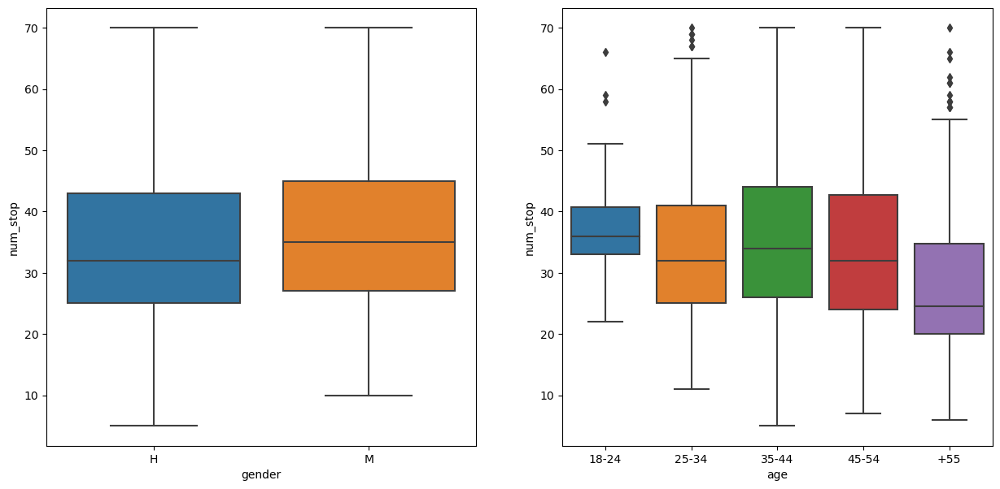

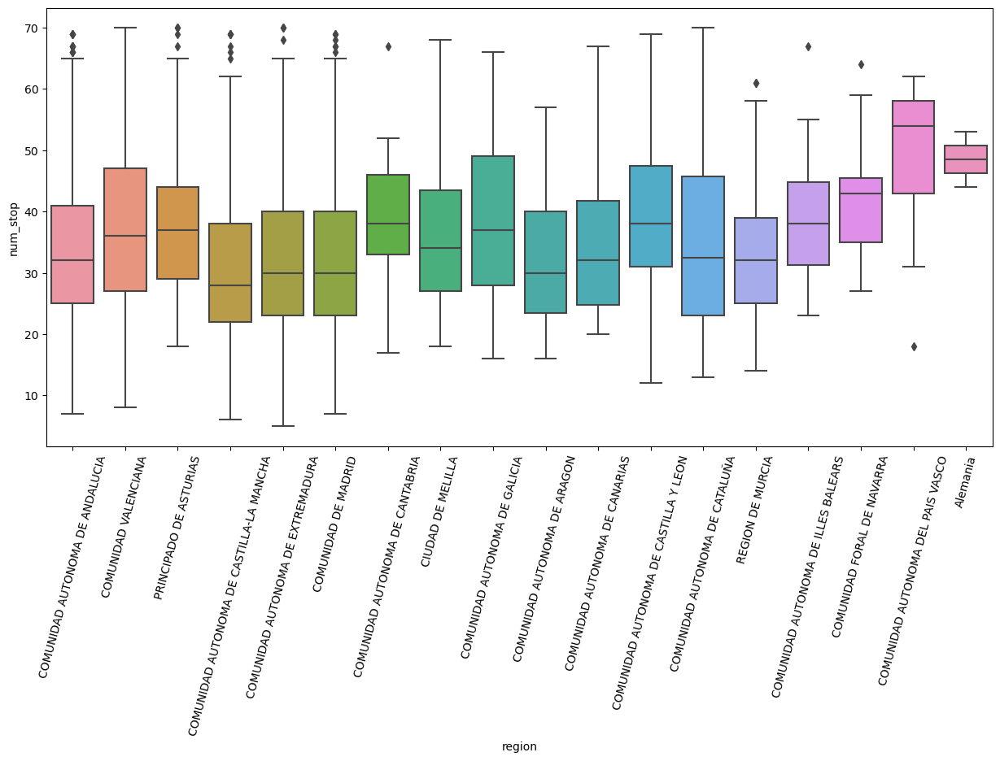

In [98]:
data = df_word.copy()
# remove outliers
data = remove_outliers(data,column='num_stop',value=70)
# boxplot
box_plot('num_stop',data)
# statistics
statistics('num_stop',data)

### 12. Count of location words

In [217]:
# Mann-Whitney U test
data = df_word.copy()
res = mann_whitney(data,'num_locations')
print(res)

MannwhitneyuResult(statistic=1388350.0, pvalue=0.021760074789145357)


In [218]:
# Kruskal-Wallis test
kruskal_posthoc(df_word,'num_locations')


AGE: KruskalResult(statistic=33.747991675161174, pvalue=8.393408735292495e-07)
AGE:           18-24     25-34     35-44     45-54       +55
18-24  1.000000  0.001359  0.011039  0.000005  0.000028
25-34  0.001359  1.000000  0.040050  0.091057  0.091057
35-44  0.011039  0.040050  1.000000  0.202163  0.244814
45-54  0.000005  0.091057  0.202163  1.000000  0.870342
+55    0.000028  0.091057  0.244814  0.870342  1.000000
REGION: KruskalResult(statistic=98.96707975033586, pvalue=1.3818656374733639e-13)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRID         

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.08032197513883509
The f of Cohen for age is: 0.09377366713239227
The f of Cohen normalized for age is: 0.10797437912633158
The f of Cohen for demography is: 0.18640418921730934
The f of Cohen normalized for demography is: 0.161452447353575


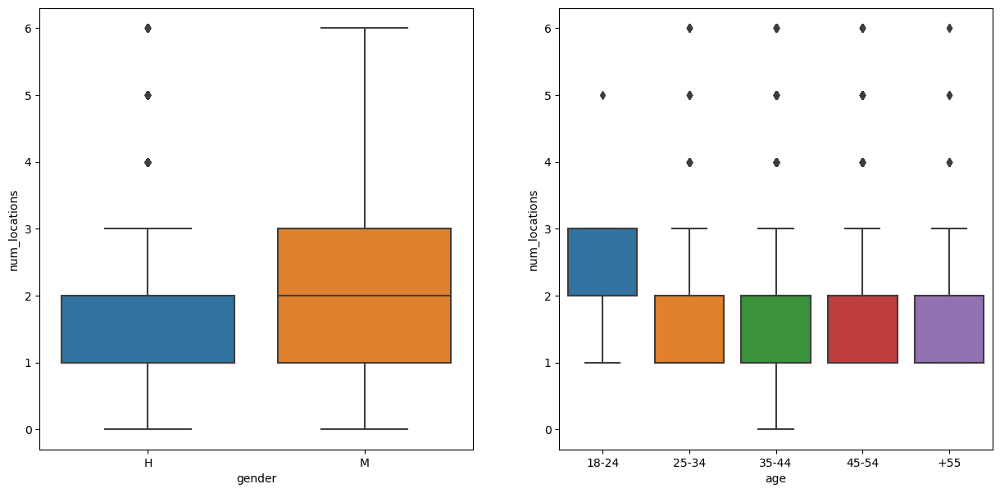

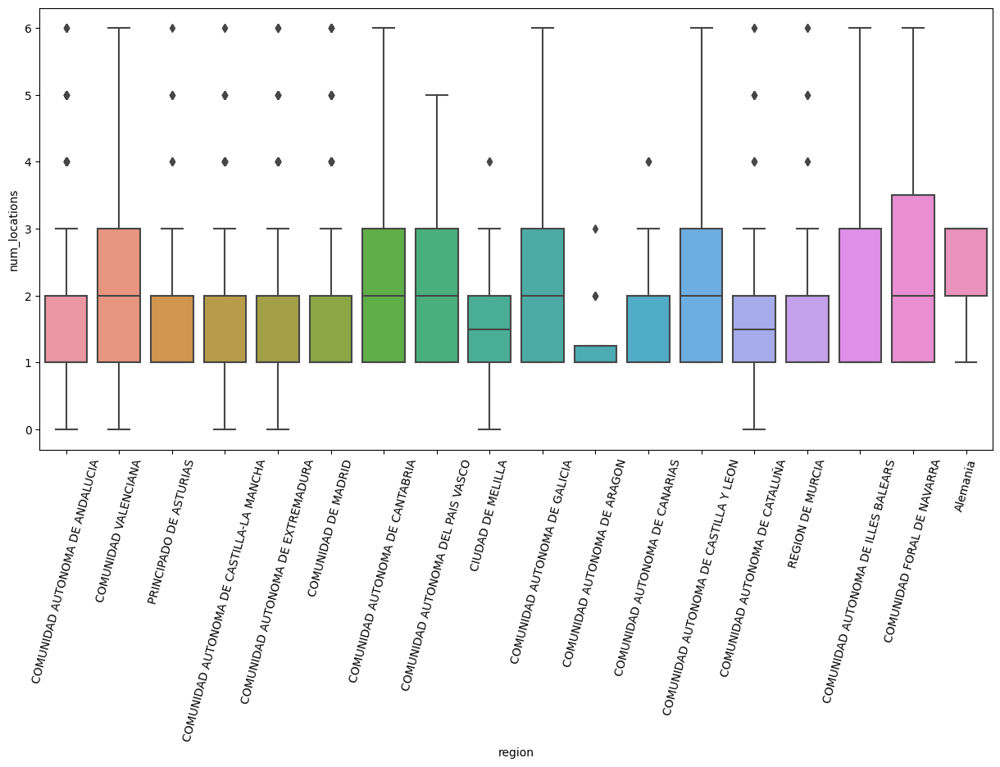

In [100]:
data = df_word.copy()
# remove outliers
data = remove_outliers(data,column='num_locations',value=6)
# boxplot
box_plot('num_locations',data)
# statistics
statistics('num_locations',data)

### 13. Count of telefone numbers

In [219]:
# Mann-Whitney U test
data = df_word.copy()
res = mann_whitney(data,'num_telefono')
print(res)

MannwhitneyuResult(statistic=1374562.0, pvalue=0.0283427512499461)


In [220]:
# Kruskal-Wallis test
kruskal_posthoc(df_word,'num_telefono')


AGE: KruskalResult(statistic=5.70014433528889, pvalue=0.2226887383549045)
AGE:           18-24  25-34  35-44     45-54       +55
18-24  1.000000    1.0    1.0  1.000000  0.611876
25-34  1.000000    1.0    1.0  1.000000  1.000000
35-44  1.000000    1.0    1.0  1.000000  1.000000
45-54  1.000000    1.0    1.0  1.000000  0.540132
+55    0.611876    1.0    1.0  0.540132  1.000000
REGION: KruskalResult(statistic=51.126793172498544, pvalue=2.8188402289371423e-05)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRID                                                 

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.07203770060455497
The f of Cohen for age is: 0.01452677077013913
The f of Cohen normalized for age is: 0.26510512254328283
The f of Cohen for demography is: 0.051666783930147855
The f of Cohen normalized for demography is: 0.19876588321992367


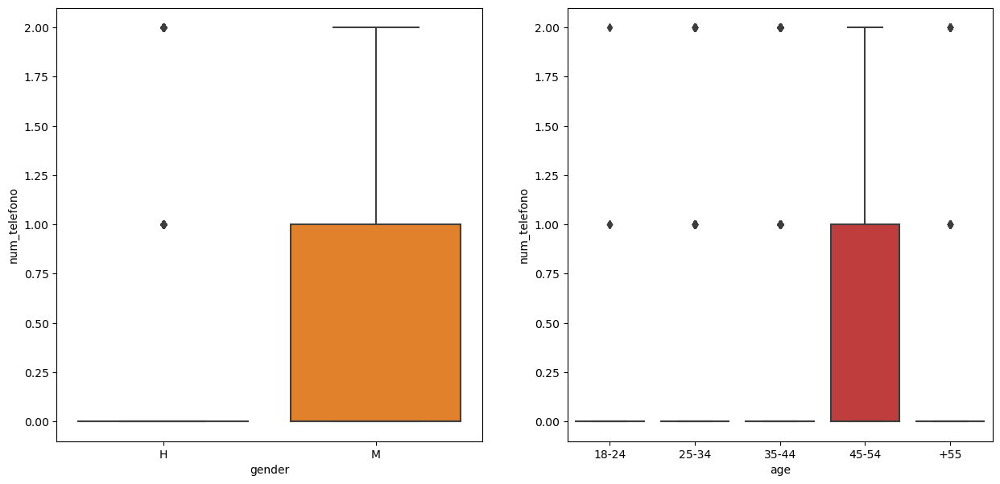

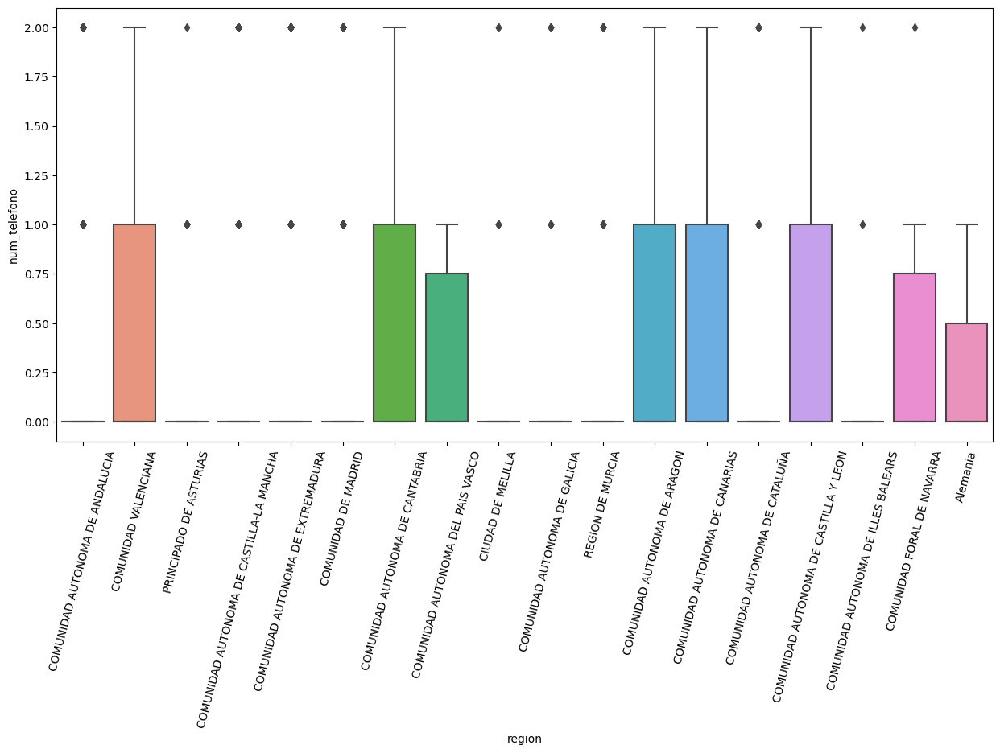

In [102]:
data = df_word.copy()
# remove outliers
data = remove_outliers(data,column='num_telefono',value=2)
# boxplot
box_plot('num_telefono',data)
# statistics
statistics('num_telefono',data)

### 14. Count of mentions to people

In [221]:
# Mann-Whitney U test
data = df_word.copy()
res = mann_whitney(data,'num_personas')
print(res)

MannwhitneyuResult(statistic=1350607.5, pvalue=0.28270768807888624)


In [222]:
# Kruskal-Wallis test
kruskal_posthoc(df_word,'num_personas')


AGE: KruskalResult(statistic=5.353316786911142, pvalue=0.25292706838762125)
AGE:        18-24     25-34  35-44     45-54       +55
18-24    1.0  1.000000    1.0  1.000000  1.000000
25-34    1.0  1.000000    1.0  1.000000  0.964783
35-44    1.0  1.000000    1.0  1.000000  1.000000
45-54    1.0  1.000000    1.0  1.000000  0.939651
+55      1.0  0.964783    1.0  0.939651  1.000000
REGION: KruskalResult(statistic=76.95372374836, pvalue=1.325972725311034e-09)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRID                                                   1

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.05005153169752629
The f of Cohen for age is: 0.03740575241545767
The f of Cohen normalized for age is: 0.09585422482833968
The f of Cohen for demography is: 0.10174282868960671
The f of Cohen normalized for demography is: 0.1917910793689138


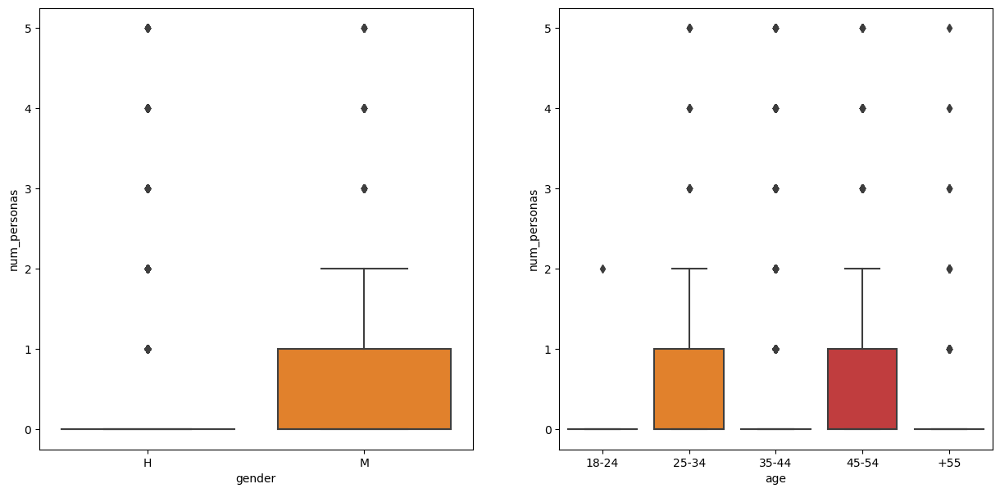

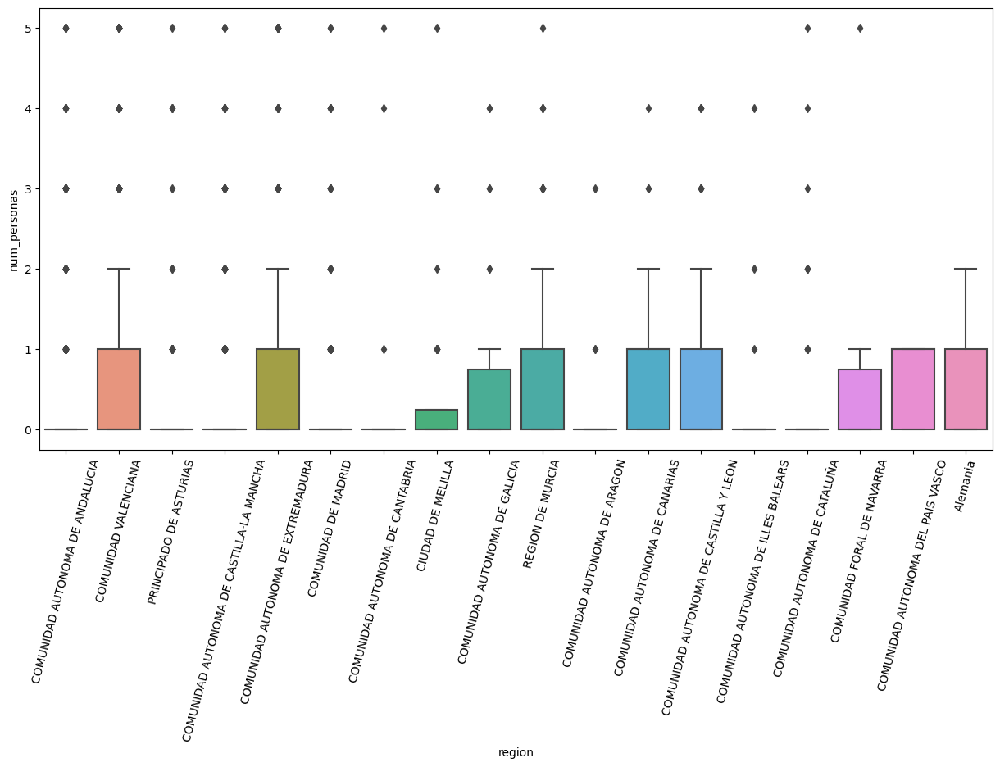

In [109]:
data = df_word.copy()
# remove outliers
data = remove_outliers(data,column='num_personas',value=5)
# boxplot
box_plot('num_personas',data)
# statistics
statistics('num_personas',data)

### 15. Count of timestamps

In [223]:
# Mann-Whitney U test
data = df_word.copy()
res = mann_whitney(data,'num_fechas')
print(res)

MannwhitneyuResult(statistic=1400201.5, pvalue=0.00837551541439024)


In [224]:
# Kruskal-Wallis test
kruskal_posthoc(df_word,'num_fechas')


AGE: KruskalResult(statistic=29.957527437929475, pvalue=4.992852611593438e-06)
AGE:           18-24  25-34     35-44     45-54       +55
18-24  1.000000    1.0  1.000000  0.015481  0.463840
25-34  1.000000    1.0  1.000000  1.000000  1.000000
35-44  1.000000    1.0  1.000000  0.000058  0.095439
45-54  0.015481    1.0  0.000058  1.000000  0.111977
+55    0.463840    1.0  0.095439  0.111977  1.000000
REGION: KruskalResult(statistic=90.76492808716941, pvalue=4.4302525113601365e-12)
REGION:                                           COMUNIDAD AUTONOMA DE ANDALUCIA  \
COMUNIDAD AUTONOMA DE ANDALUCIA                                       1.0   
COMUNIDAD VALENCIANA                                                  1.0   
PRINCIPADO DE ASTURIAS                                                1.0   
COMUNIDAD AUTONOMA DE CASTILLA-LA MANCHA                              1.0   
COMUNIDAD AUTONOMA DE EXTREMADURA                                     1.0   
COMUNIDAD DE MADRID                           

/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:53: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=0,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:54: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['18-24','25-34','35-44','45-54','+55'],axis=1,inplace=True)
/var/folders/_x/cddkf2k97y19q18kzrrrxrzw0000gn/T/ipykernel_47096/2893180864.py:85: FutureWarning: DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead
  posthoc.set_axis(['COMUNIDAD AUTONOMA DE ANDALUCIA','COMUNIDAD VALENCIANA','PRINCIPADO DE ASTURIAS','COMUNIDAD AUTONOM

The d of Cohen for gender is: 0.07665539857332758
The f of Cohen for age is: 0.13875831164895305
The f of Cohen normalized for age is: 0.32762664429946464
The f of Cohen for demography is: 0.20983221505791047
The f of Cohen normalized for demography is: 0.12063748144002191


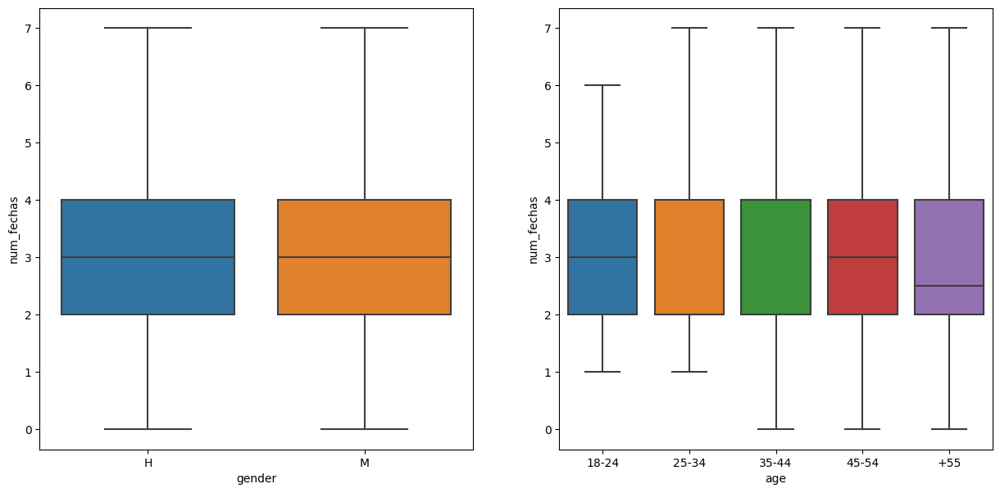

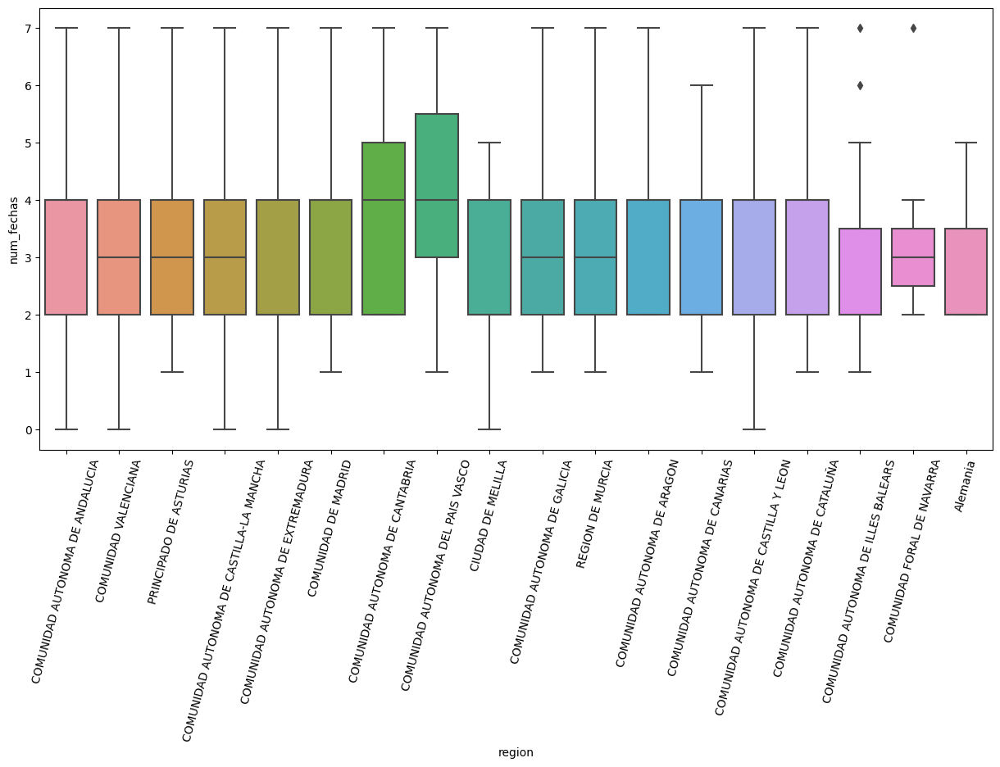

In [111]:
data = df_word.copy()
# remove outliers
data = remove_outliers(data,column='num_fechas',value=7)
# boxplot
box_plot('num_fechas',data)
# statistics
statistics('num_fechas',data)

## Conclusions
For the crime report dataset, with the police officer's demographic traits as targets, we can conclude that the statistical significant features are:

1. Gender:
    * Character based:
        - Number of capital letters
        - Number of characters
    * Structural based: 
        - Average number of sentences per paragraph
        - Number of sentences
    * Syntactic based:
        - Number of determiners
        - Number of adverbs
        - Number of pronouns
    * Word based:
        - Number of words
        - Average word length
        - Length smaller than 3
        - Count of stopwords
2. Age:
    * Character based:
        - Number of characters
        - Number of capital letters
        - Number of punctuation marks
    * Structural based:
        - Average number of sentences per paragraph
    * Syntactic based:
        - Number of prepositions
        - Number of singular nouns
        - Number of plural nouns
        - Number of adjectives
        - Number of pronouns
        - Number of future tense verbs
        - Number of conjunctions
    * Word based:
        - Number of words
        - Unique word count
        - Number of words that occur twice
        - Average word length
        - Count of words with numbers
        - Count of words with length > 6
        - Count of words with length < 3
        - Count of timestamps
3. Region:
    * Character based: 
        - Number of capital letters
        - Number of characters
    * Structural based: 
        - Average number of words per paragraph
        - Average number of characters per paragraph
    * Stylistic based:
        - Number of determiners
        - Number of pronouns
    * Word based:
        - Number of words